In [26]:
import os
import time
import datetime
import calendar
import glob
import csv
import matplotlib.pyplot as plt
import numpy as np
import re
import math

X = "x"
Y = "y"

test_duration = [200, 110, 130, 120]

scenario_list = [(i, f"s{i}", test_duration[i - 1]) for i in range(1, 5)]
print(scenario_list)

number_of_peers_list = [(i, f"n{i:02}") for i in [2, 4, 8]]
print(number_of_peers_list)

CRDT_CLIENT_SERVER = 0
CRDT_P2P = 1
OT_CLIENT_SERVER = 2
type_list = [(0, "crdt-cs", "tab:blue"), (1, "crdt-p2p", "tab:orange"), (2, "ot", "tab:green")]
print(type_list)

parameter_list = ["cpu", "mem", "network-in", "network-out"]
# parameter_label = {
#     "cpu" : "Catatan: dalam satuan %, utilisasi CPU aplikasi, 100% = 1 core",
#     "network-in" : "Catatan: dalam satuan Kilobits/s, kecepatan bandwidth data yang masuk atau diterima",
#     "network-out" : "Catatan: dalam satuan Kilobits/s, kecepatan bandwidth data yang keluar atau dikirim",
#     "mem": "Catatan: dalam satuan Mebibytes, penggunaan memori aplikasi yang sudah normalized (dimulai dari 0 saat inisialisasi test)"
# }


parameter_label = {
    "cpu" :  "Application CPU",
    "network-in" : "Incoming network data",
    "network-out" : "Outgoing network data",
    "mem":"Application RAM"
}


y_labels = {
    "cpu" :  "Utilization (%)",
    "network-in" : "Network usage (Kilobits/s)",
    "network-out" : "Network usage (Kilobits/s)",
    "mem":"Memory (Mebibytes)"
}

from termcolor import colored
def declare_scenario(current_scenario):
    print(colored(f"Currently computing Scenario {current_scenario}", "red"))

def declare_n(current_n):
    print(colored(f"Currently computing for peers {current_n}", "blue"))

def parse_log_time(time_str):
    # 2022-11-02 18:04:00.001
    element = datetime.datetime.strptime(time_str,"%Y-%m-%d %H:%M:%S.%f")
    return element

def parse_log_time_second(time_str):
    return int(calendar.timegm(parse_log_time(time_str).timetuple()))

def parse_log_time_mili(time_str):
    # 2022-11-02 18:04:00.001
    element = parse_log_time(time_str)
    micro = element.microsecond
    element = int(calendar.timegm(element.timetuple())) * 1000000 + micro
    return element//1000

[(1, 's1', 200), (2, 's2', 110), (3, 's3', 130), (4, 's4', 120)]
[(2, 'n02'), (4, 'n04'), (8, 'n08')]
[(0, 'crdt-cs', 'tab:blue'), (1, 'crdt-p2p', 'tab:orange'), (2, 'ot', 'tab:green')]


In [27]:
def scenario(idx, normalize_mem = 9):
    logger = [["parameter","peer number","instance", "avg", "med", "max", "min"]]
    current_scenario = scenario_list[idx]
    declare_scenario(current_scenario)
    disconnection_exist = scenario_list[idx][0] <= 2
    for n in number_of_peers_list:
        declare_n(n)
        data_path = os.path.join(os.getcwd(), current_scenario[1], n[1])

        plotting_groups = dict()
        for server_kind in type_list:

            start_time = None
            end_time = None
            for i in range(1, n[0] + 1):
                log_path = os.path.join(data_path, server_kind[1], f"peer-{i}")
                # print(log_path)
                log_file = glob.glob(f"{log_path}/*.log")
                assert(len(log_file) == 1)
                assert(os.path.isdir(log_path))
                log_file = log_file[0]
                
                with open(log_file, 'r') as log_buffer:
                    log_data = log_buffer.read()
                    test_start_line = re.search("\[(.+?)\].+Test Start", log_data)
                    timestamp_str = test_start_line.groups()[0]
                    timestamp_int = parse_log_time_second(timestamp_str)
                    if(start_time == None):
                        start_time = timestamp_int
                    assert(start_time == timestamp_int)

                    try:
                        test_start_line = re.search("\[(.+?)\].+Exit Test", log_data)
                        timestamp_str = test_start_line.groups()[0]
                        # print(timestamp_str)
                        timestamp_int = parse_log_time_second(timestamp_str)

                        if(end_time == None):
                            end_time = timestamp_int
                        # print(log_path)
                        # print(end_time, timestamp_int)
                        end_time = max(end_time, timestamp_int)
                        assert(abs(end_time-timestamp_int) <= 10)
                    except:
                        print(colored(f"{log_path} Doesn't end!", "red"))
                        pass

            # start_time already got from log, now time to plot
            # wpen csv file
            for parameter in parameter_list:
                # print(parameter)
                parameter_log_path = os.path.join(data_path, server_kind[1])
                parameter_log_glob = glob.glob(f"{parameter_log_path}/{parameter.split('-')[0]}-*.csv")
                for parameter_glob_path in parameter_log_glob:
                    # print(parameter_glob_path)
                    parameter_glob_path_name = parameter_glob_path.split('/')[-1]
                    # print(parameter_glob_path_name)
                    instance_category = re.search(f"{parameter.split('-')[0]}-(.+?)\.csv", parameter_glob_path_name)
                    instance_category = instance_category.groups()[0]
                    is_peer = ""
                    group_parameter = parameter
                    if("peer" in instance_category):
                        group_parameter += f"-peers"
                        instance_category += f"-{server_kind[1]}"
                    # print(instance_category)
                    plotting_groups.setdefault(group_parameter, dict())
                    current_group = plotting_groups[group_parameter]
                    current_group.setdefault(instance_category, dict())
                    current_entry = current_group[instance_category]
                    x_min = start_time - 10
                    x_max = end_time + 10
                    x = []
                    y = []
                    with open(parameter_glob_path, 'r') as parameter_log_buffer:
                        reader = list(csv.reader(parameter_log_buffer))
                        reader_len = len(reader)
                        for i in range(1, reader_len):
                            # print(reader[i])
                            if(x_min <= int(reader[i][0]) <= x_max):
                                x.append(int(reader[i][0]) - x_min)
                                if(parameter == "network-out"):
                                    y.append(float(reader[i][2]))
                                else:
                                    y.append(float(reader[i][1]))
                    y = [j for _, j in sorted(zip(x, y))]
                    x.sort()
                    current_entry["x"] = x
                    current_entry["y"] = y
        for parameter in plotting_groups.keys():
            current_group = plotting_groups[parameter]
            fig = plt.figure(figsize=(12, 7))
            plt.title(f'''{parameter_label[parameter.strip('-peers')]} for {'peers/clients' if parameter.endswith('peers') else 'servers'}
Scenario {current_scenario[0]}, $n$ = {n[0]}''')
            # plt.title(f"{parameter}\n{parameter_label[parameter.strip('-peers')]}")
                # Normalize to 0
            for instance in current_group.keys():
                current_instance = current_group[instance]
                if(parameter.startswith("mem")):
                    # print(parameter)
                    first_el = current_instance[Y][normalize_mem]
                    for i in range(len(current_instance[Y])):
                        current_instance[Y][i] -= first_el
                total = 0
                # print(current_scenario)
                START_FROM = 10
                running = []
                for i in range(len(current_instance[Y])):
                    if(START_FROM <= current_instance[X][i] <= START_FROM + current_scenario[2]):
                        running.append(current_instance[Y][i])
                tmp_label = f"{instance} avg={np.average(running):.3f}"
                plt.plot(current_instance[X], current_instance[Y], label=tmp_label)
                tmp_log = [parameter,n[0],instance,np.average(running),np.median(running),np.max(running),np.min(running)]
                logger.append(tmp_log)
            plt.xticks(np.arange(10, 300, 30), [i for i in np.arange(0, 300, 30)])
            plt.xlabel(f'''Seconds passed (s)''')
            plt.ylabel(f"{y_labels[parameter.strip('-peers')]}")
            plt.legend()
            plt.grid()
            plt.show()
    with open(f"log-scenario-{current_scenario[0]}.csv", "w") as log_buffer:
        writer = csv.writer(log_buffer)
        writer.writerows(logger)

Currently computing Scenario (1, 's1', 200)
Currently computing for peers (2, 'n02')


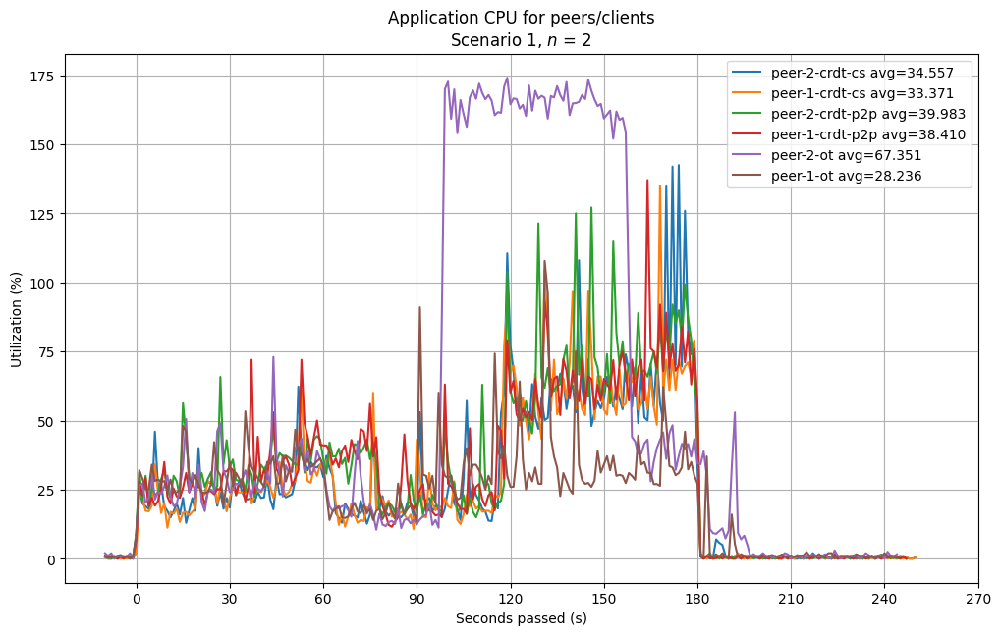

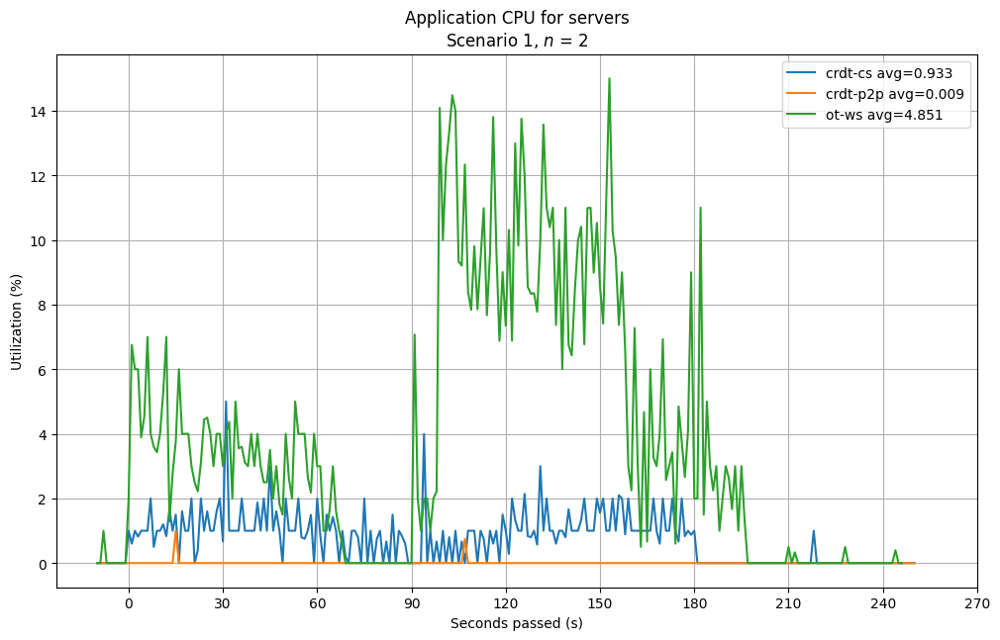

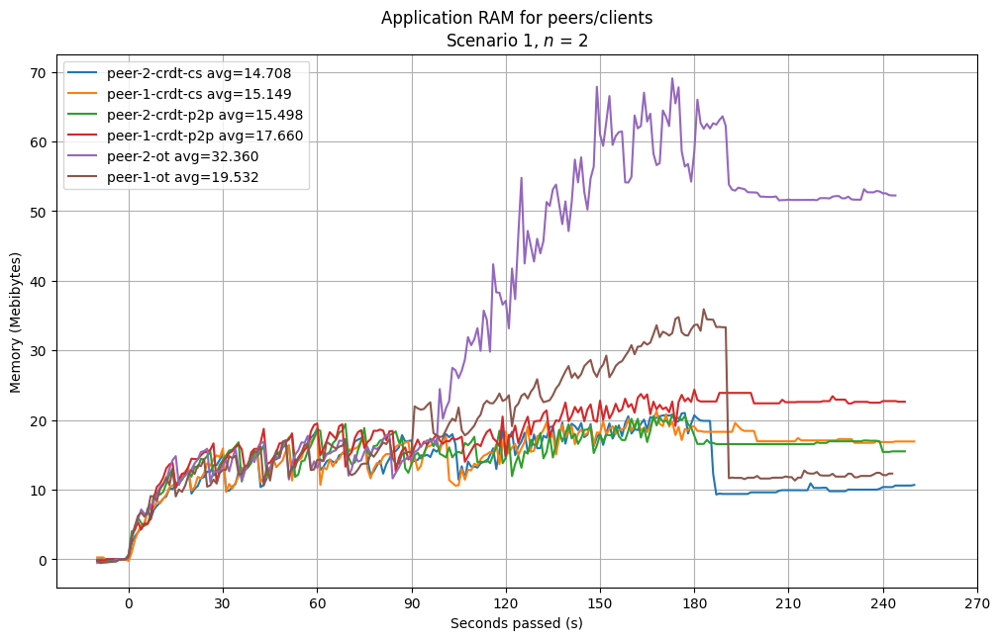

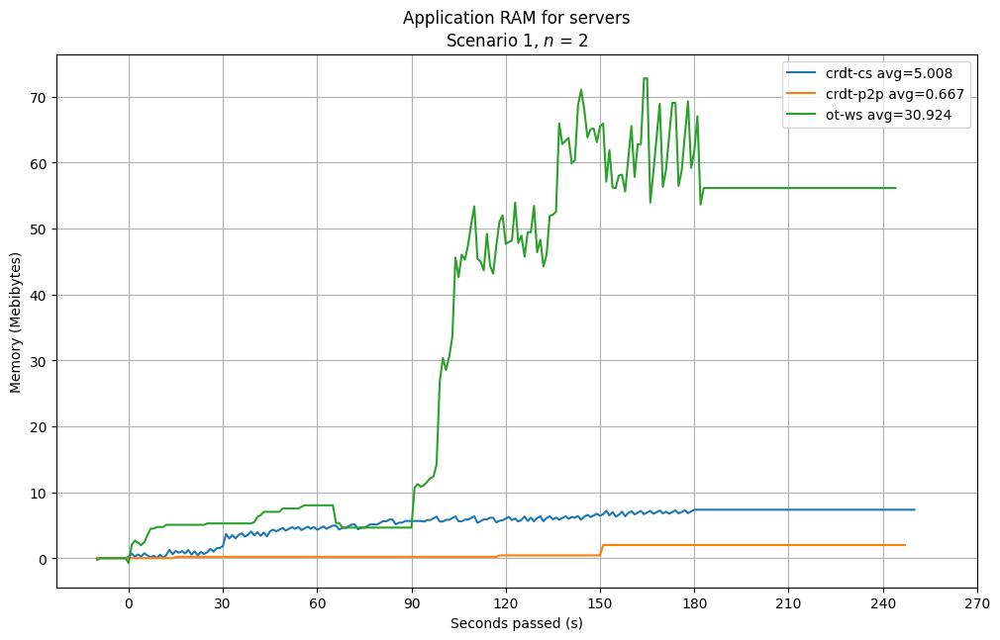

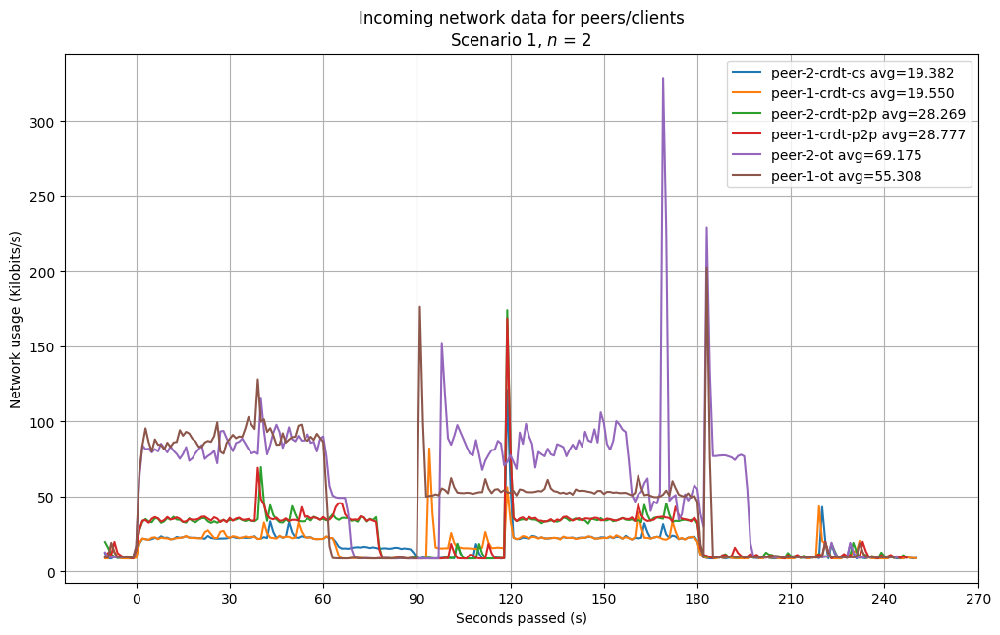

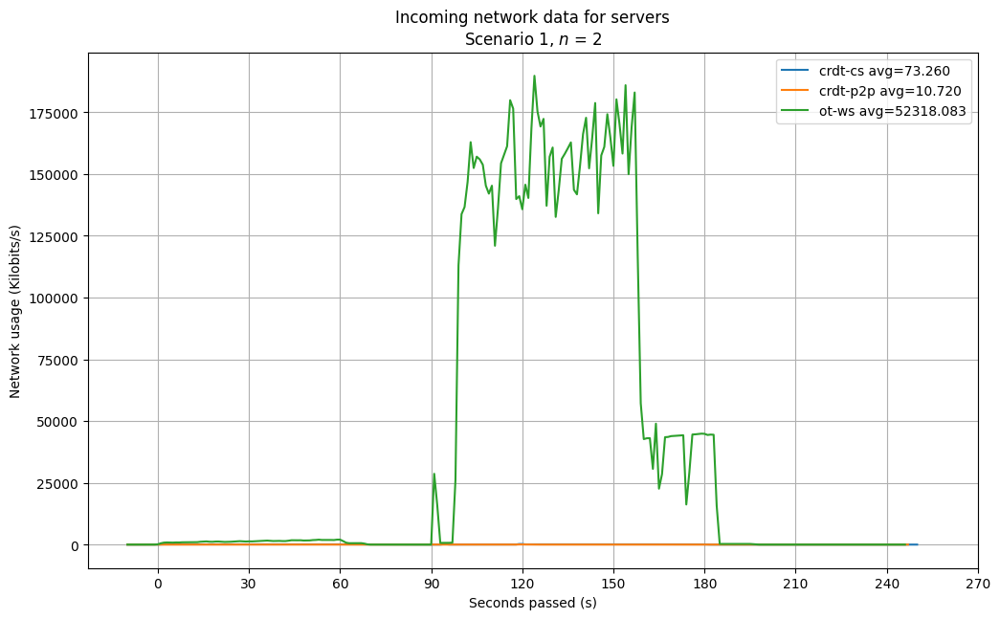

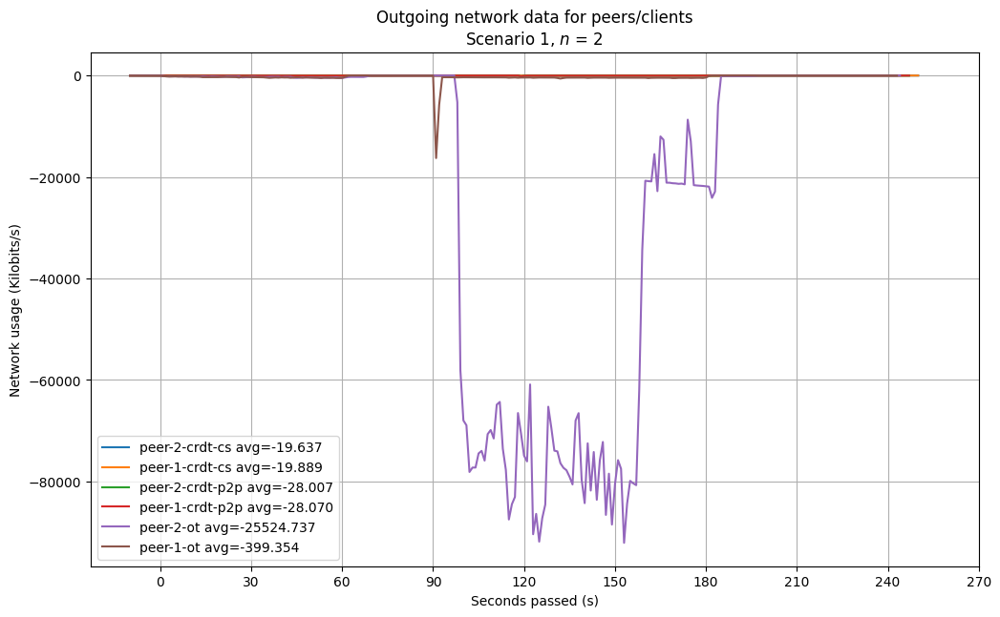

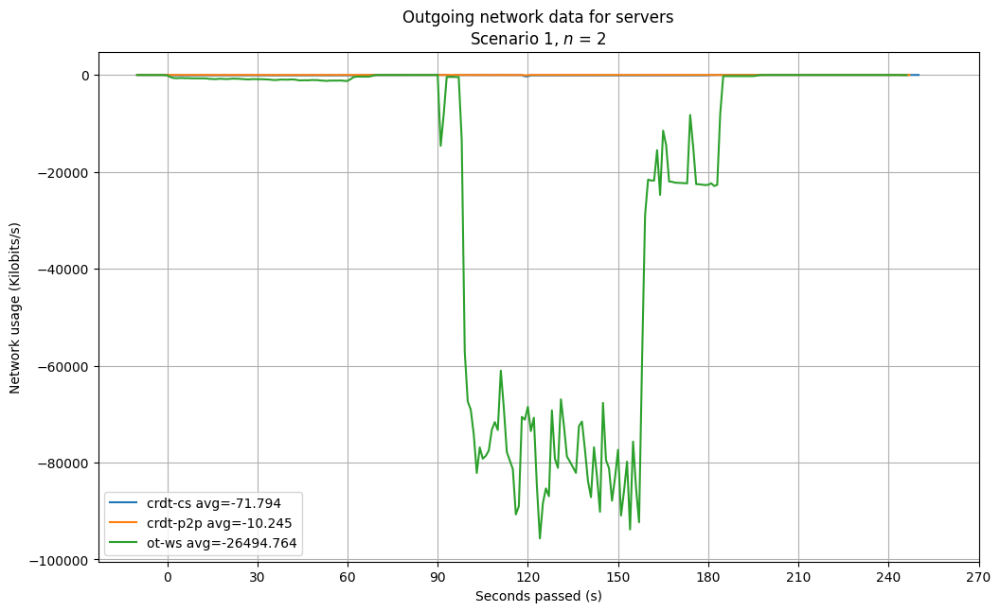

Currently computing for peers (4, 'n04')


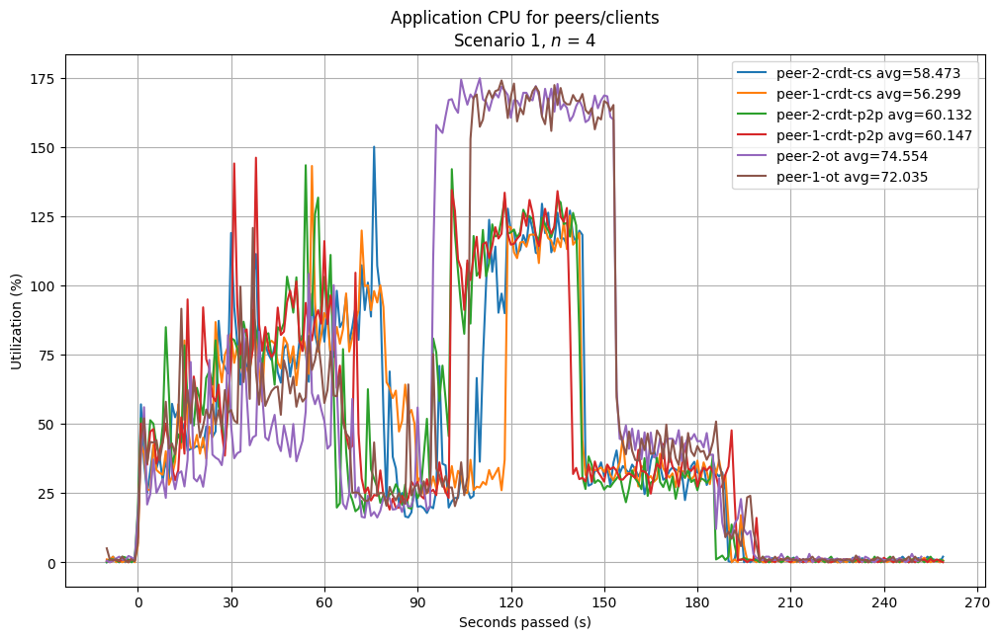

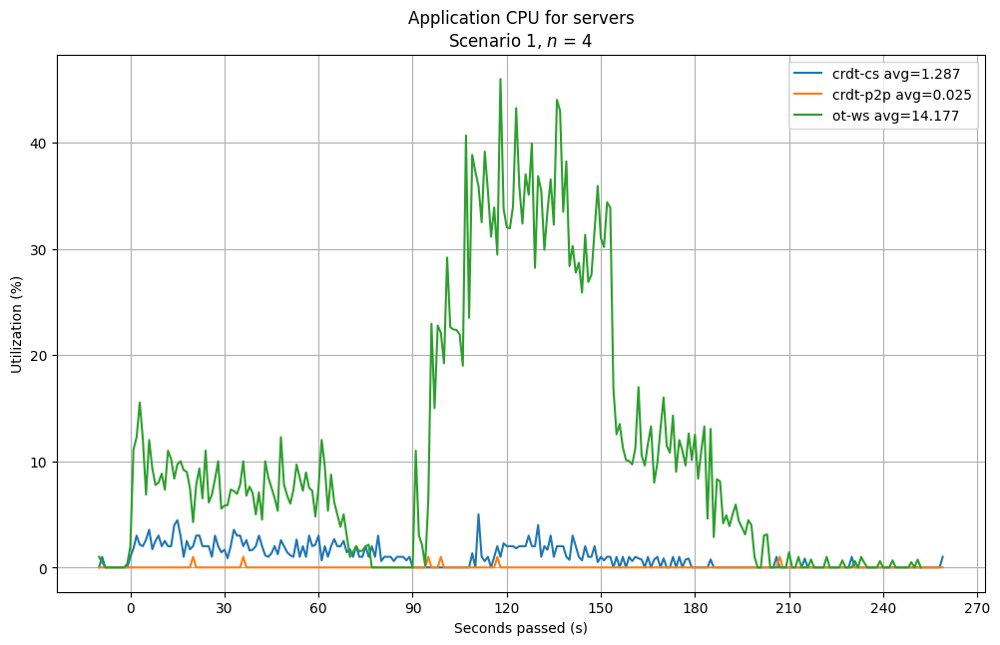

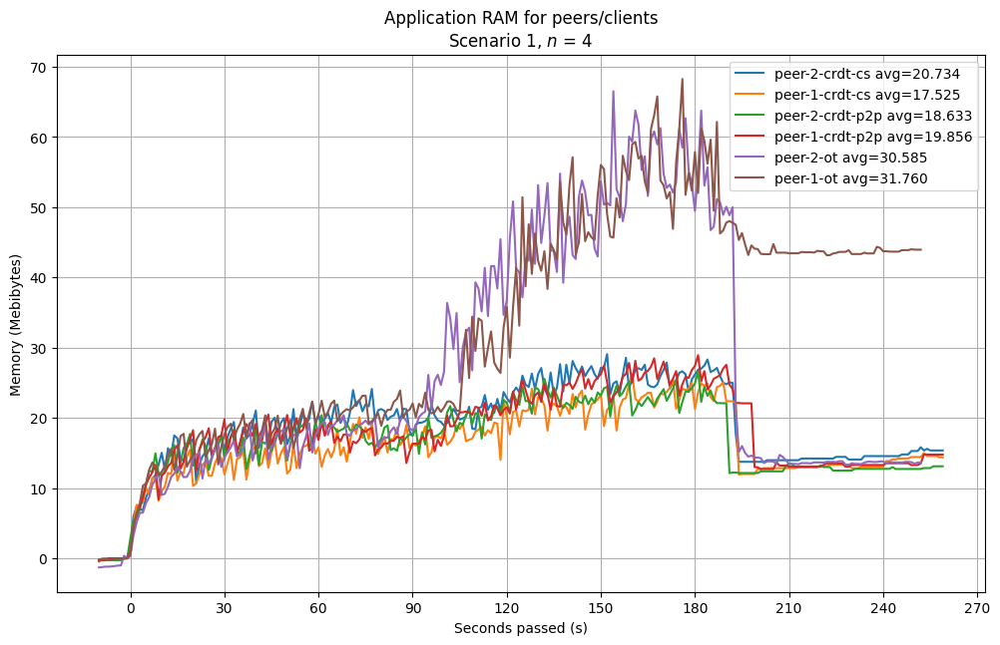

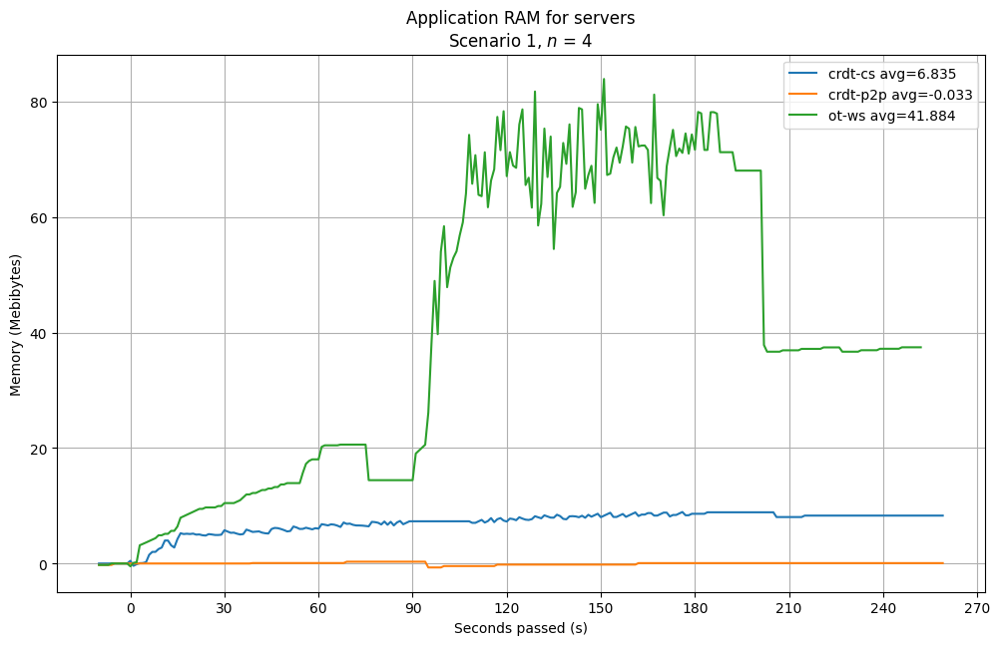

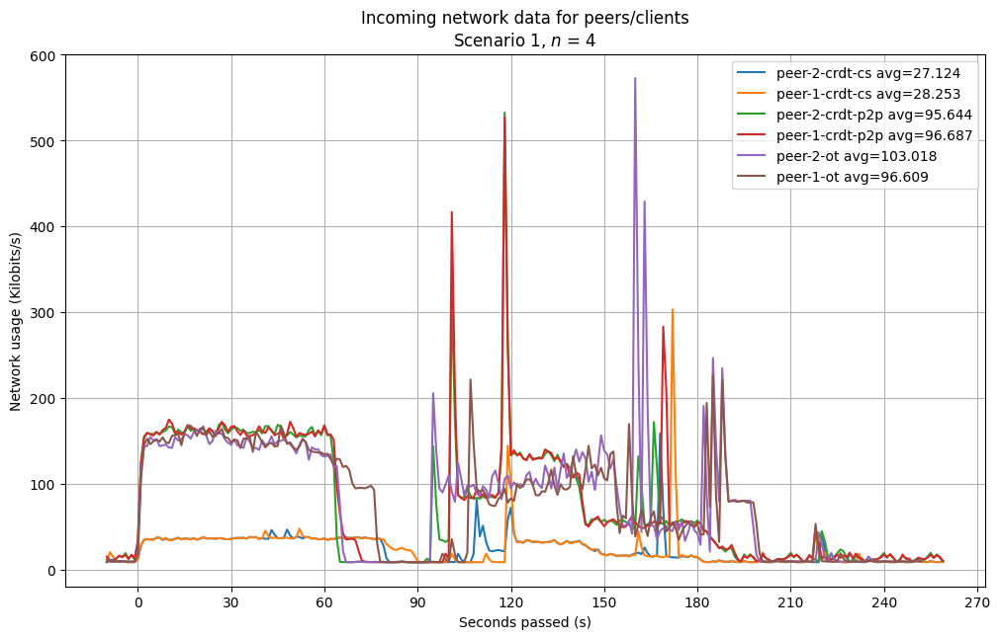

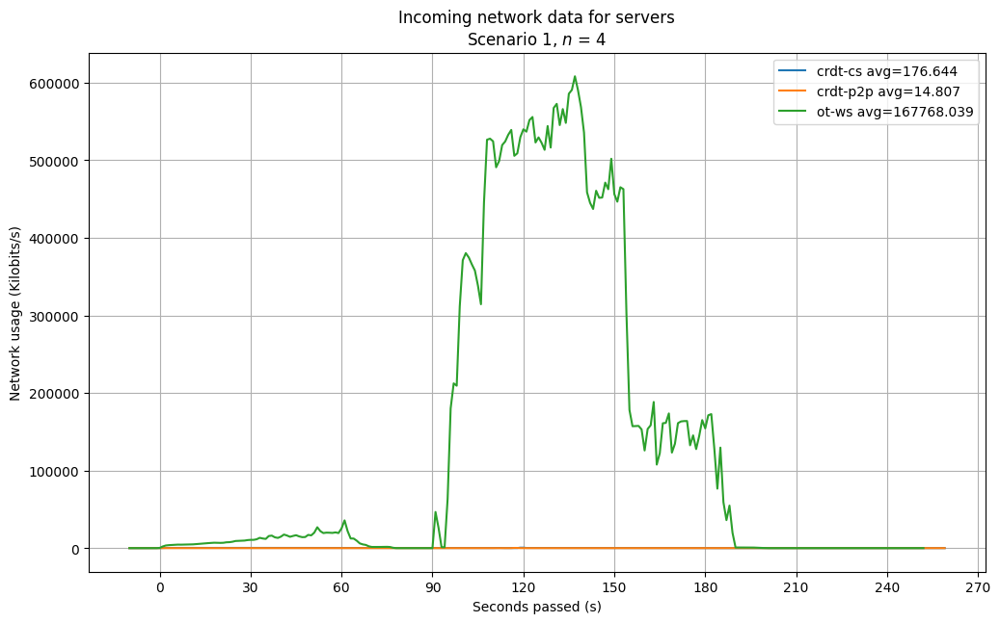

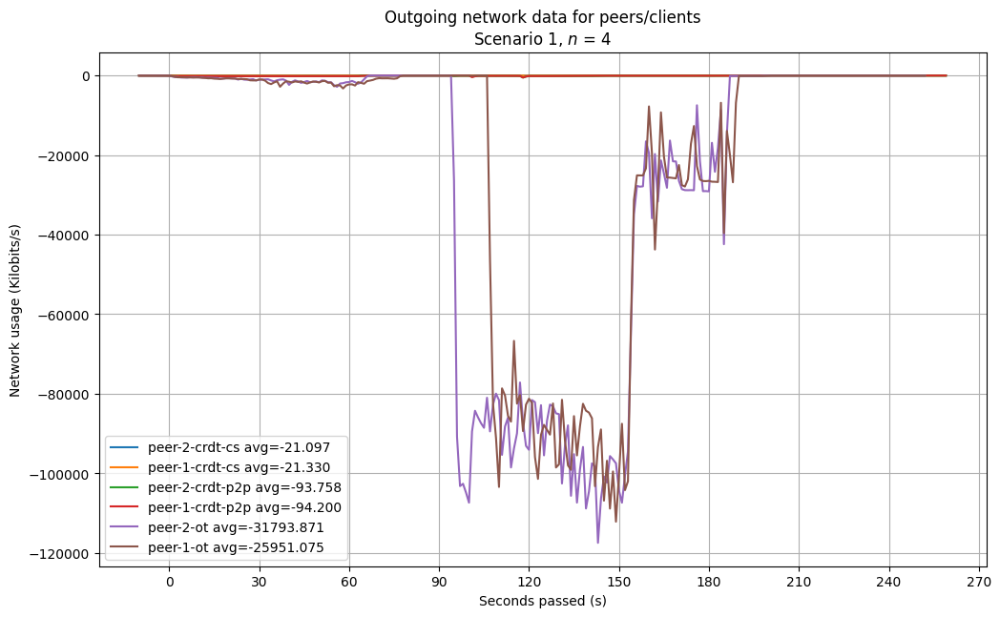

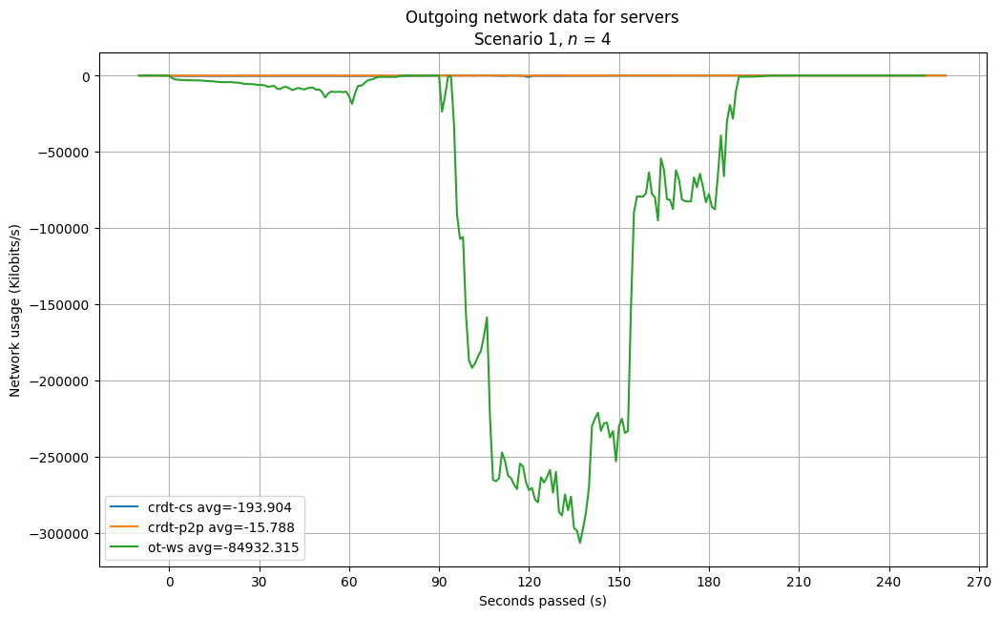

Currently computing for peers (8, 'n08')
/Users/hocky/peertocp-benchmark/s1/n08/ot/peer-4 Doesn't end!
/Users/hocky/peertocp-benchmark/s1/n08/ot/peer-5 Doesn't end!


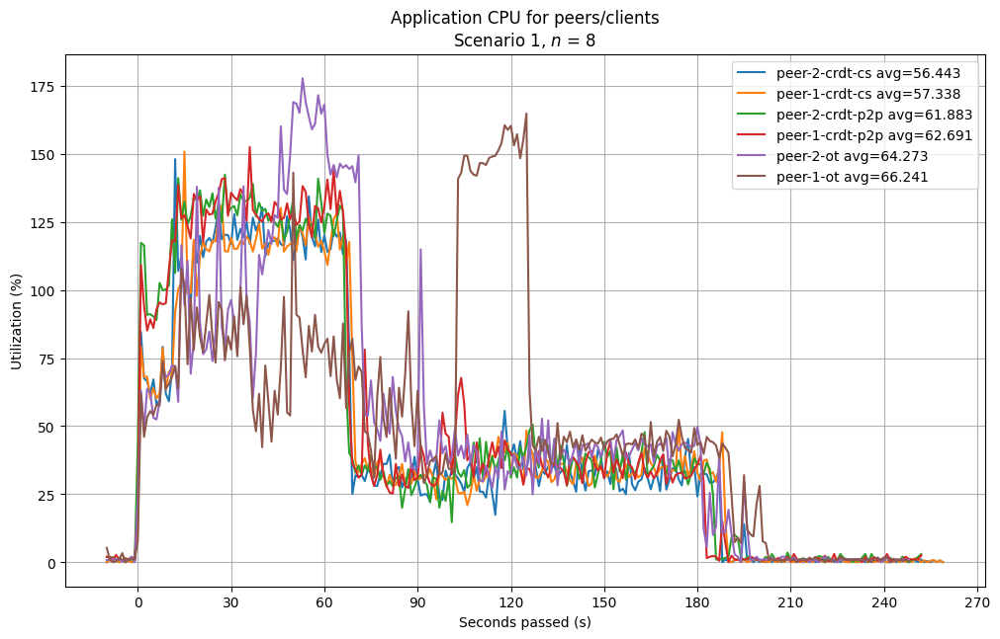

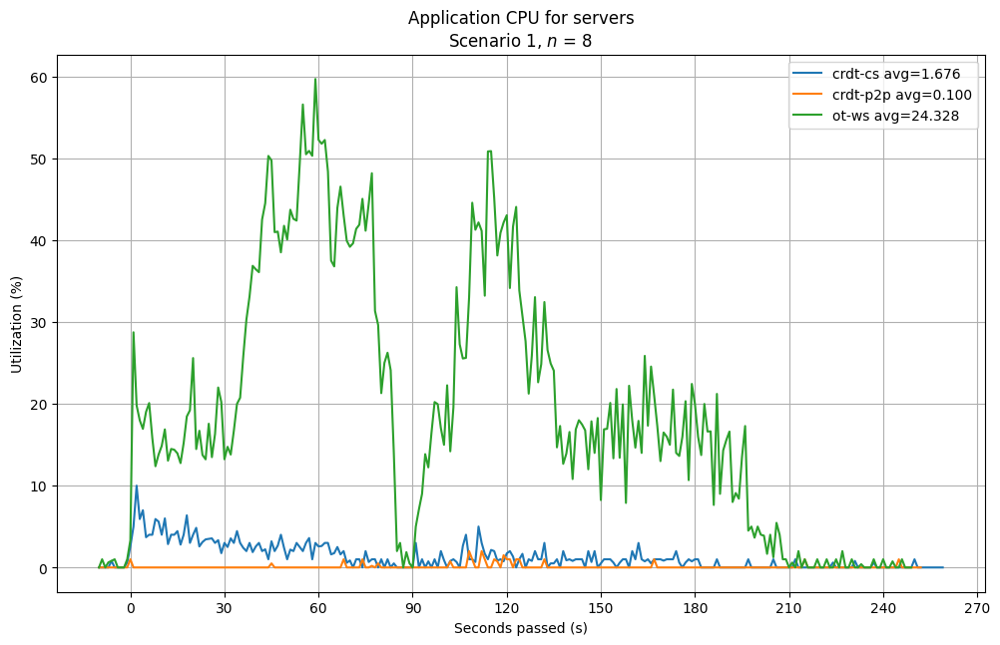

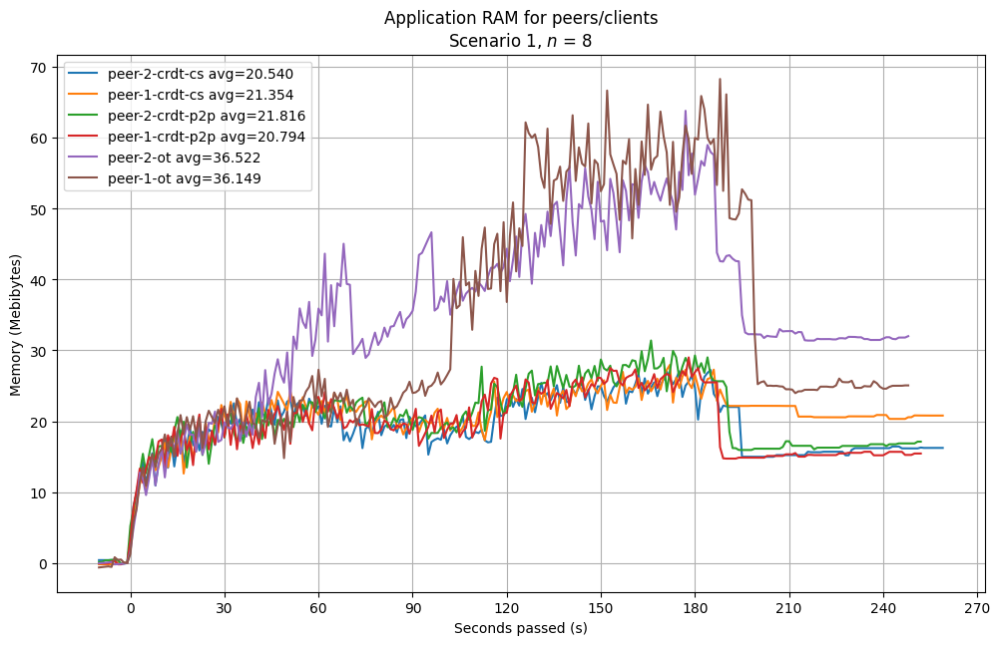

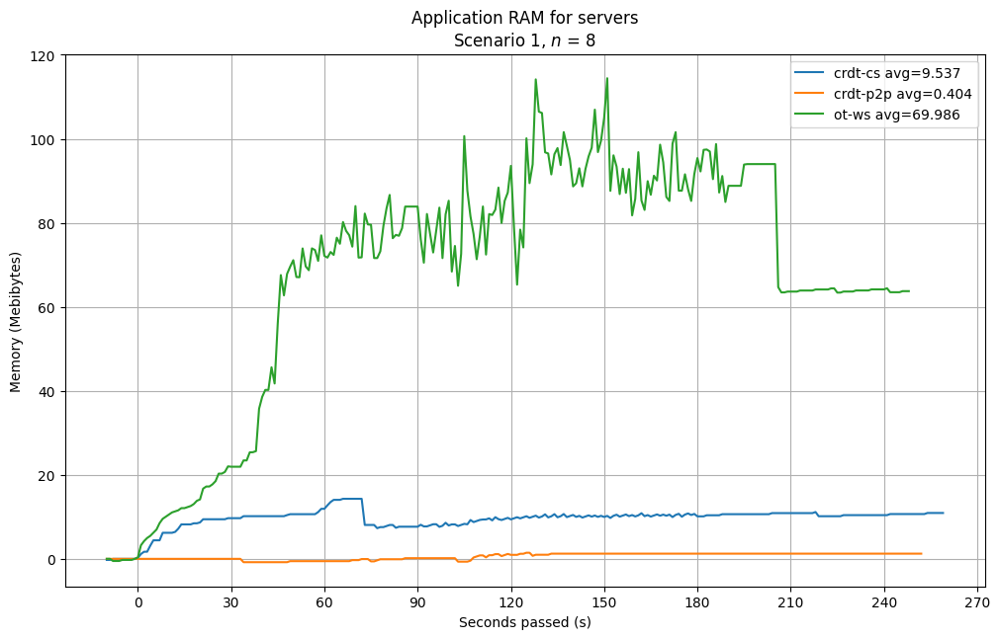

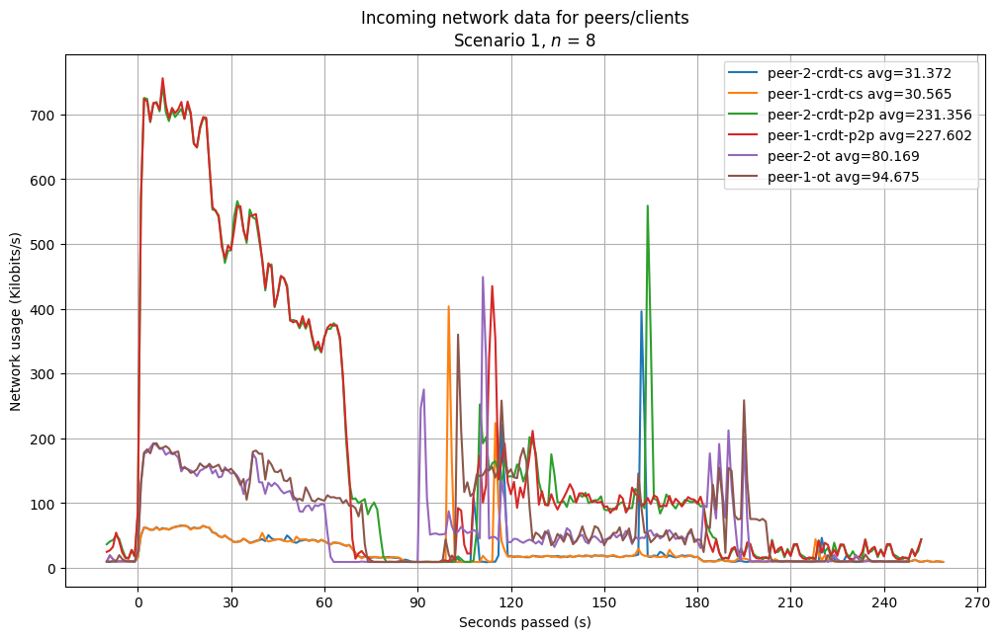

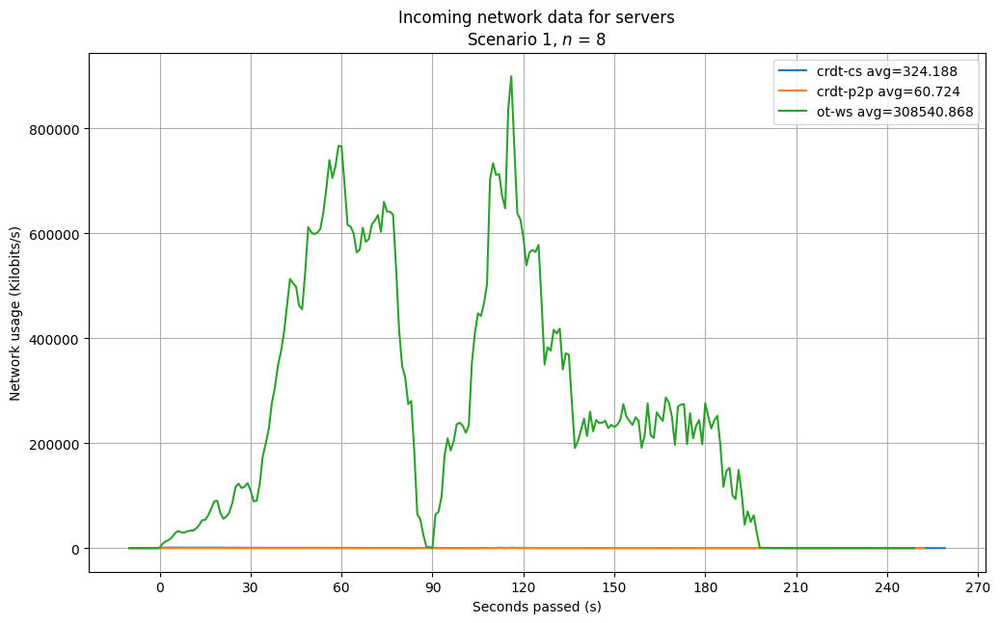

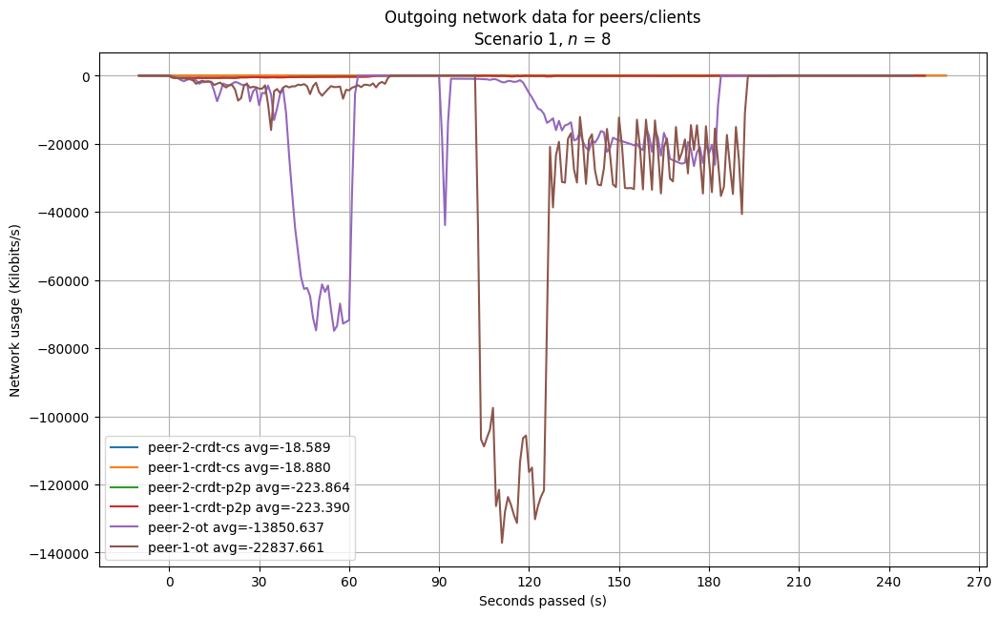

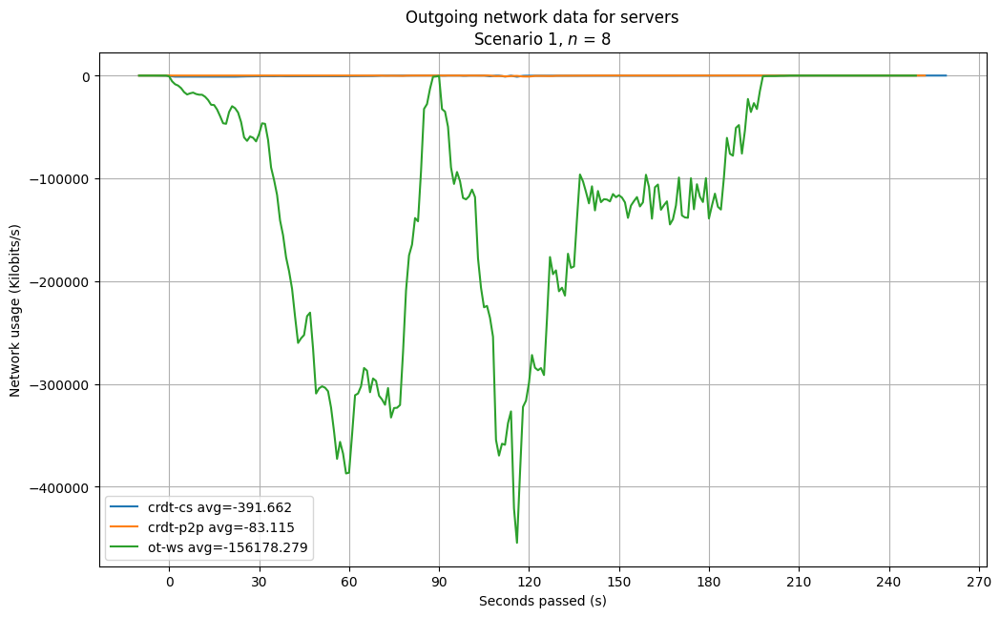

In [28]:
scenario(0)

Currently computing Scenario (2, 's2', 110)
Currently computing for peers (2, 'n02')


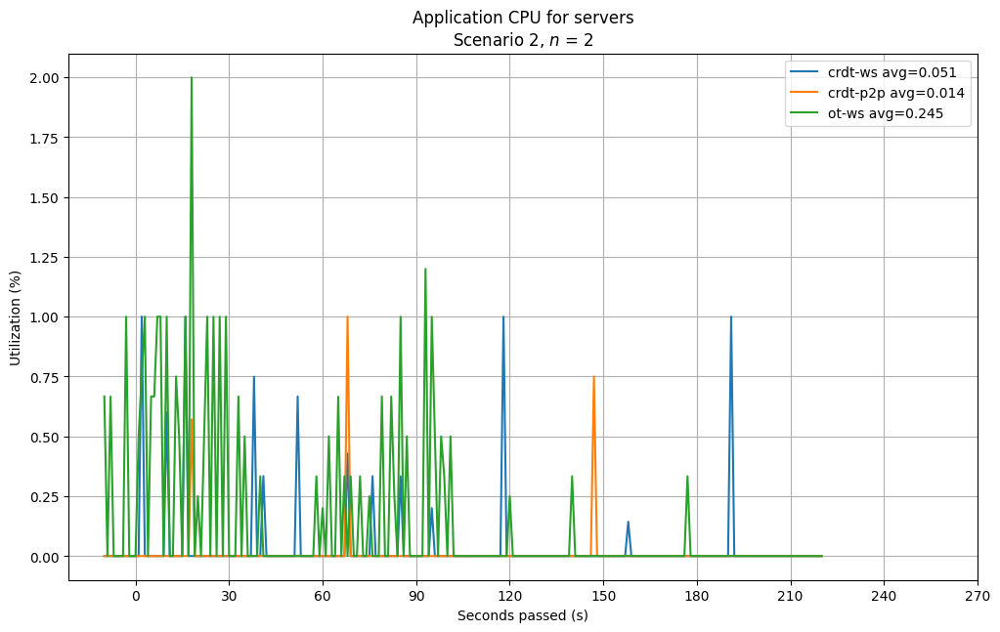

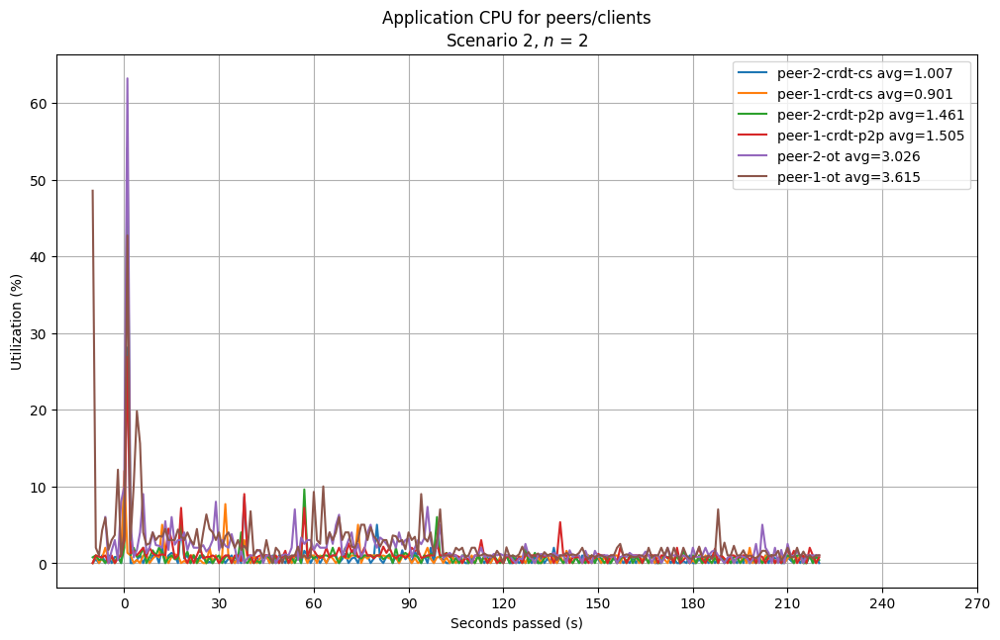

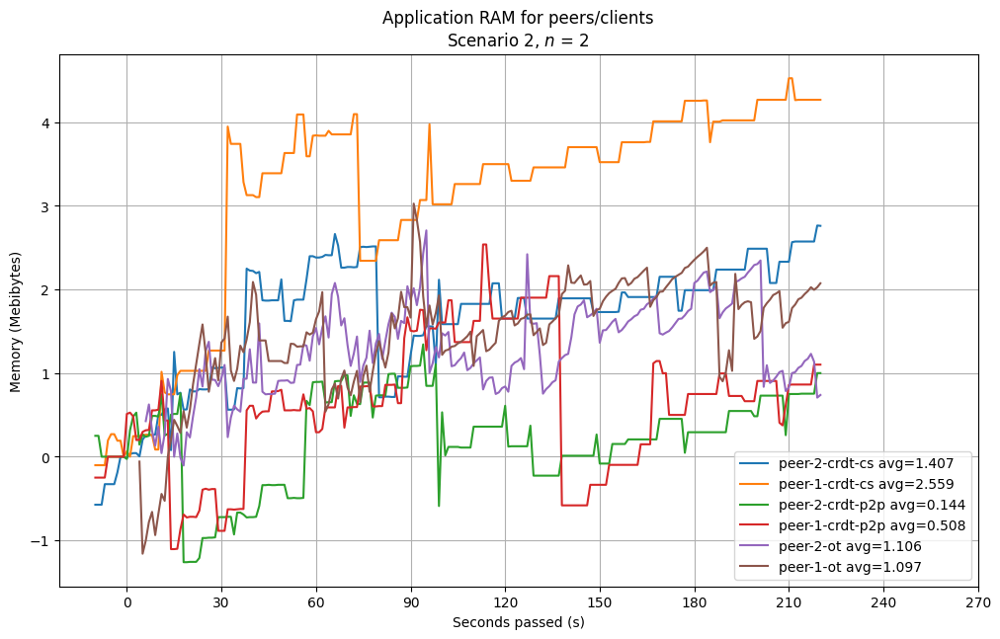

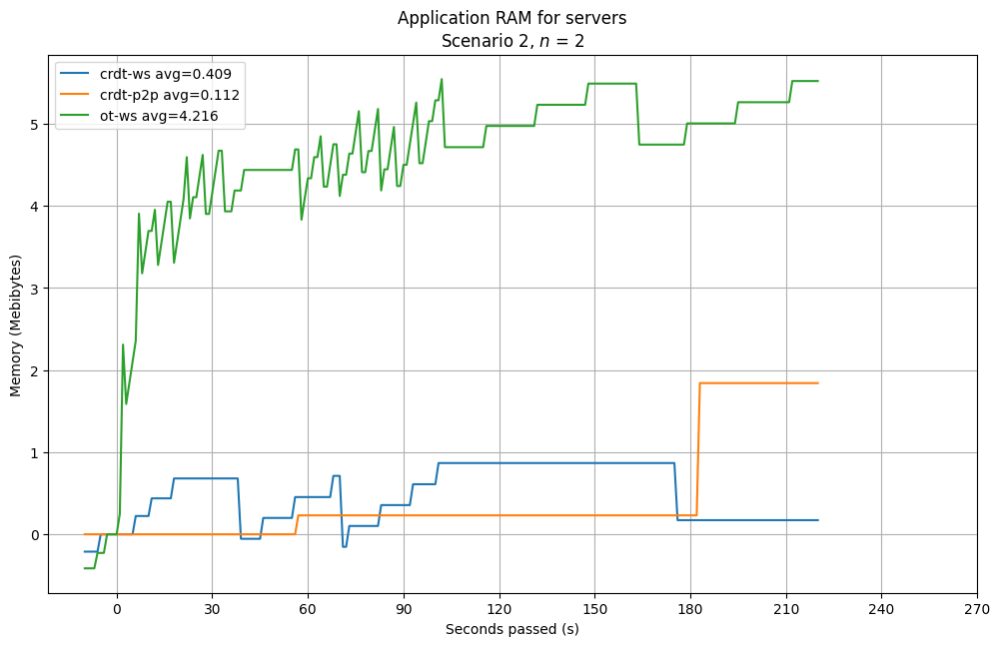

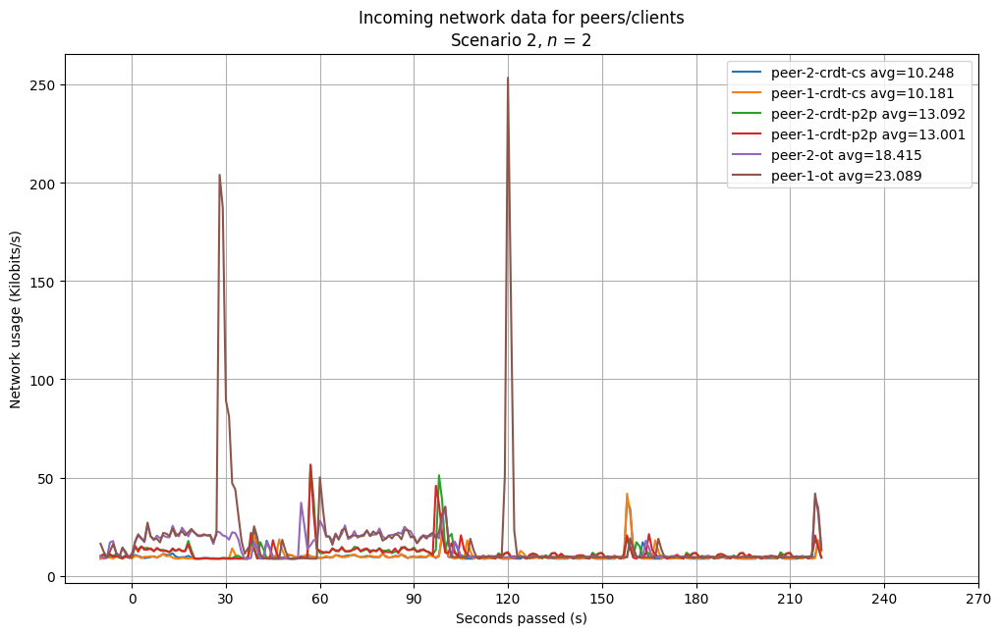

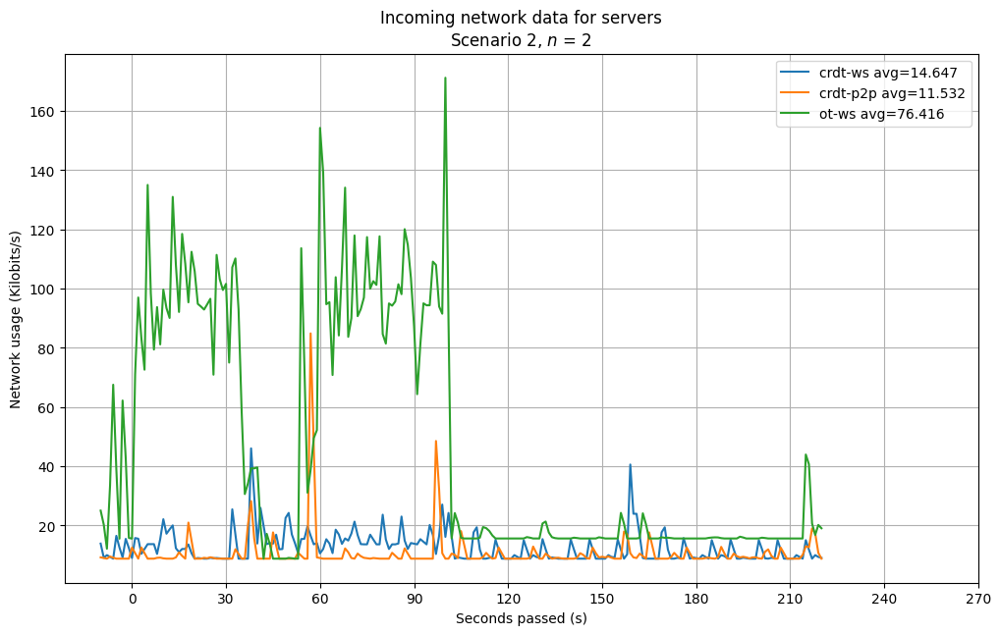

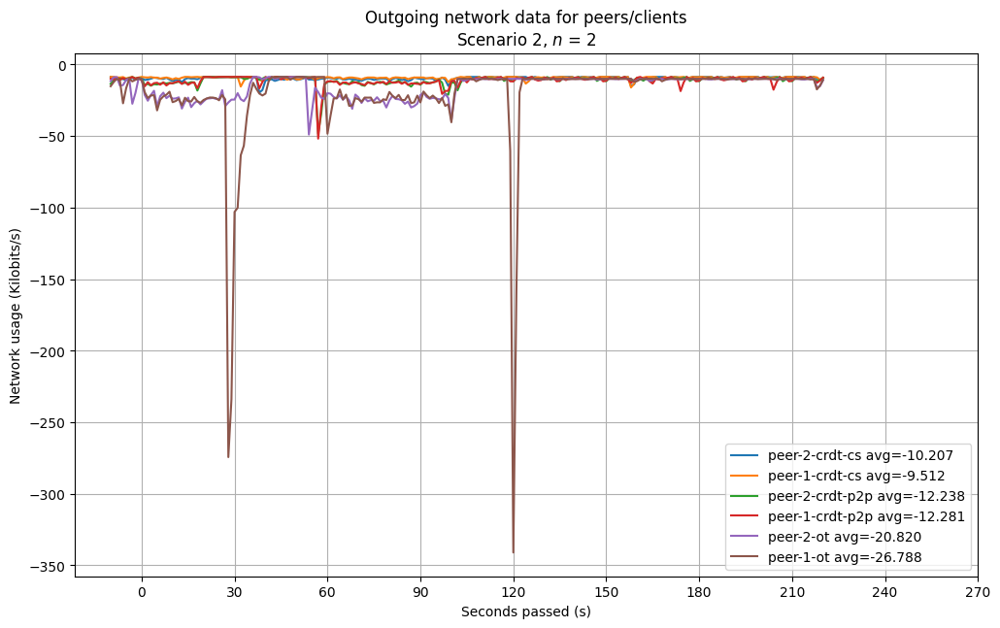

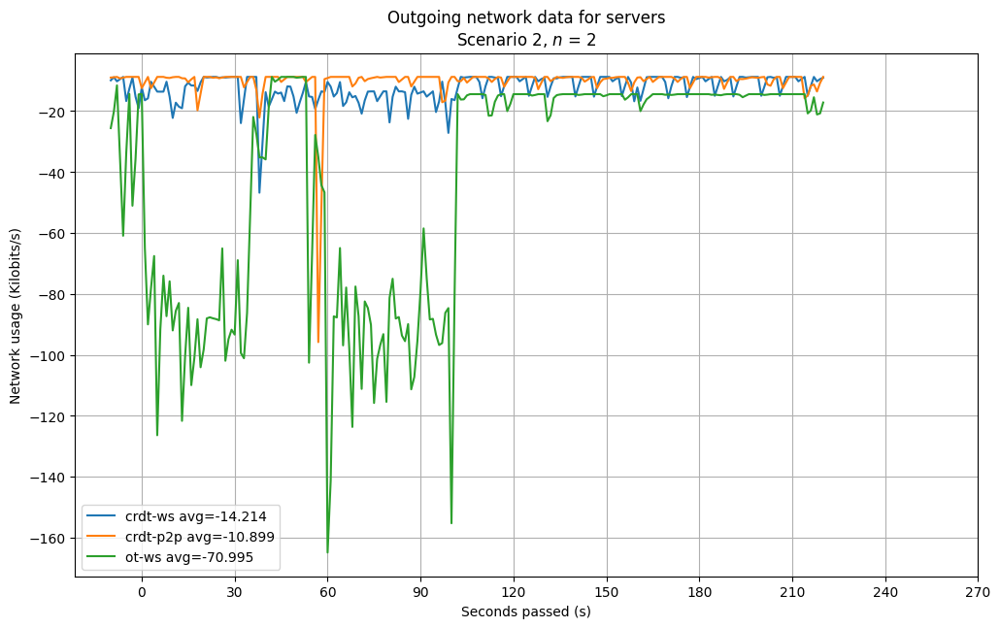

Currently computing for peers (4, 'n04')


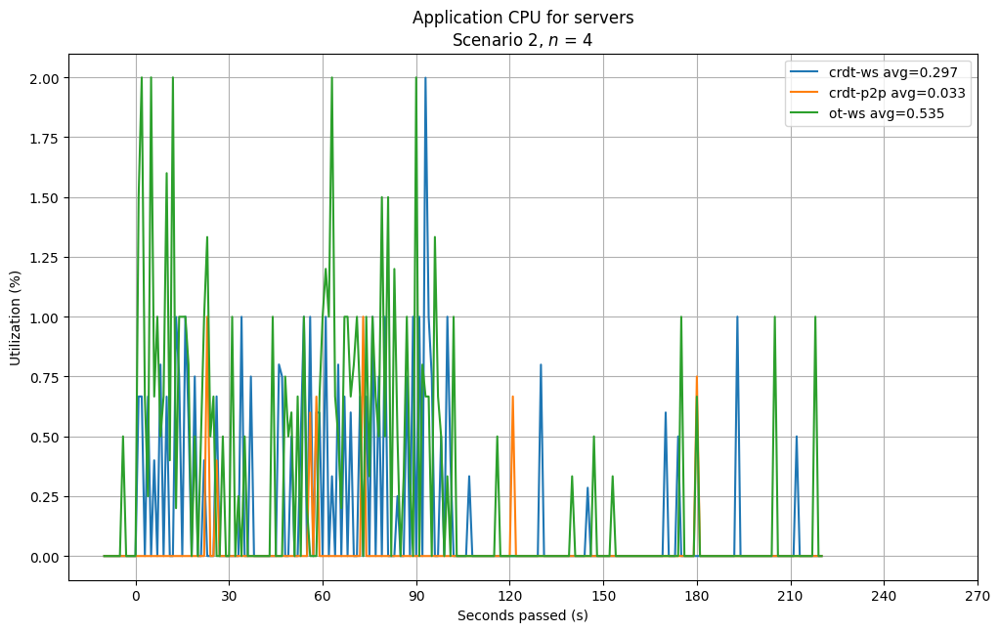

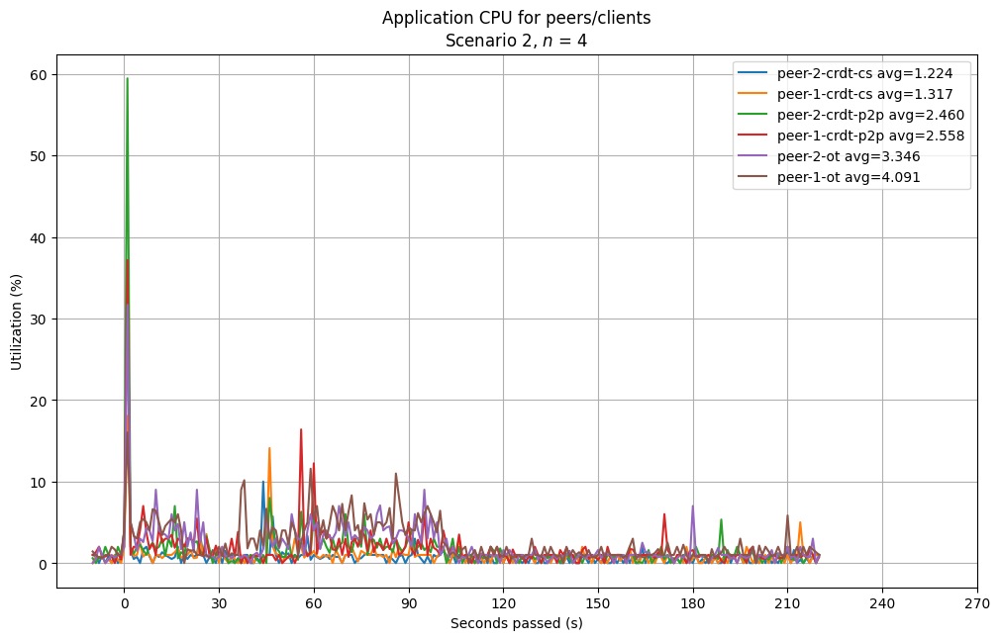

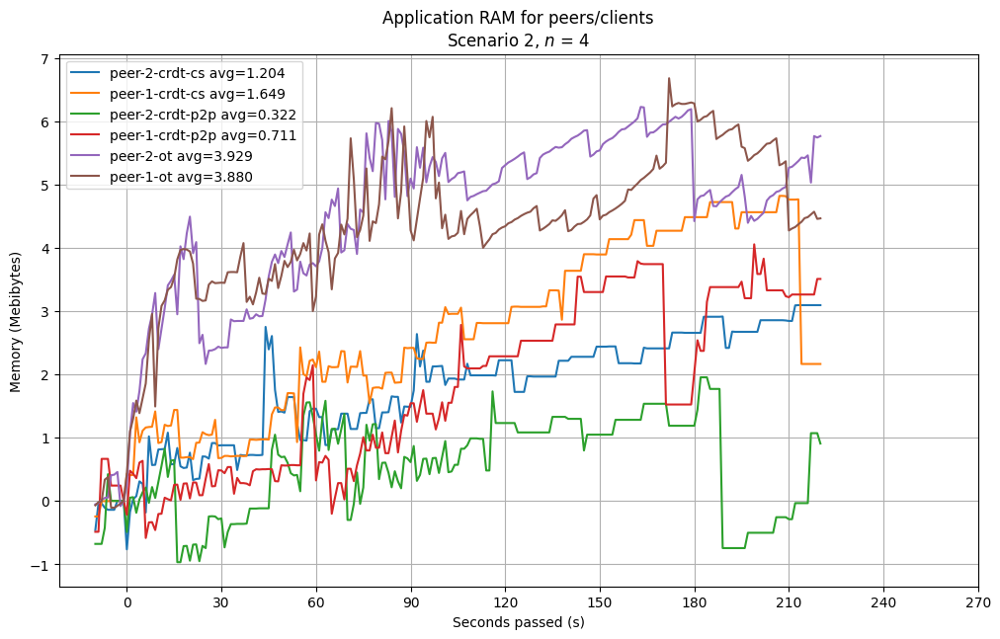

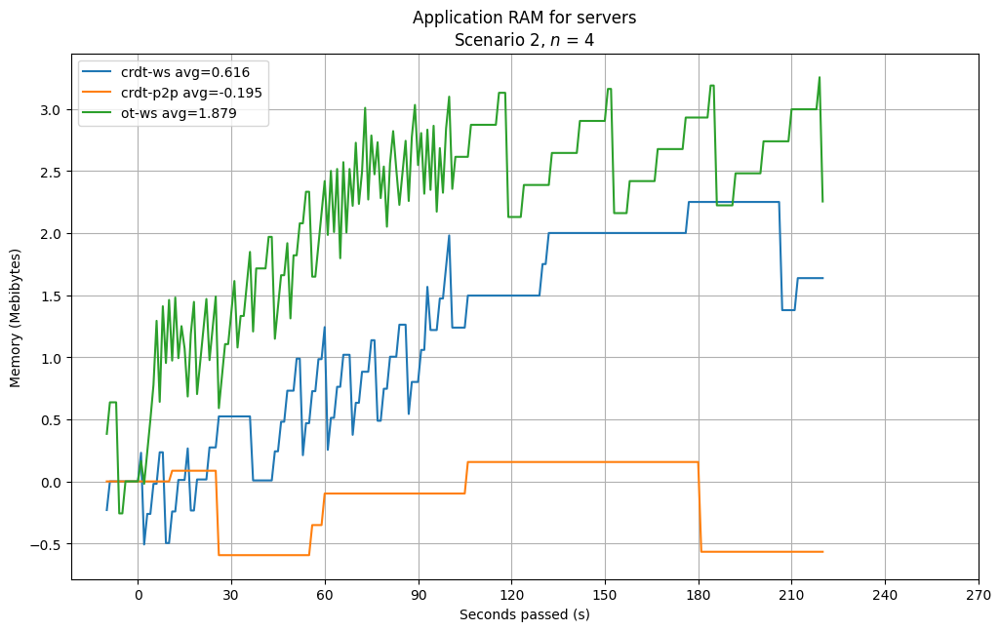

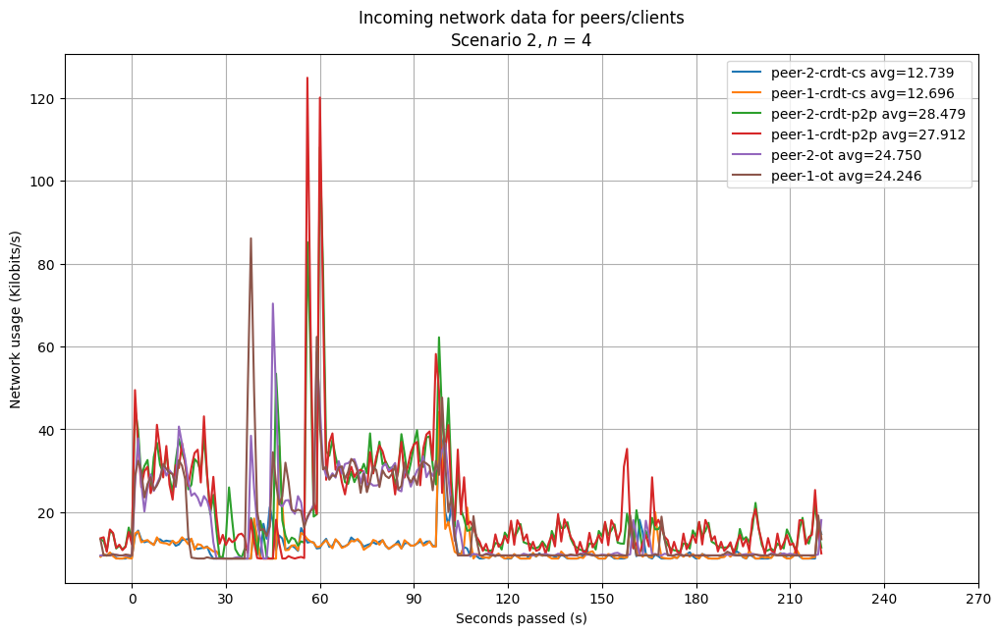

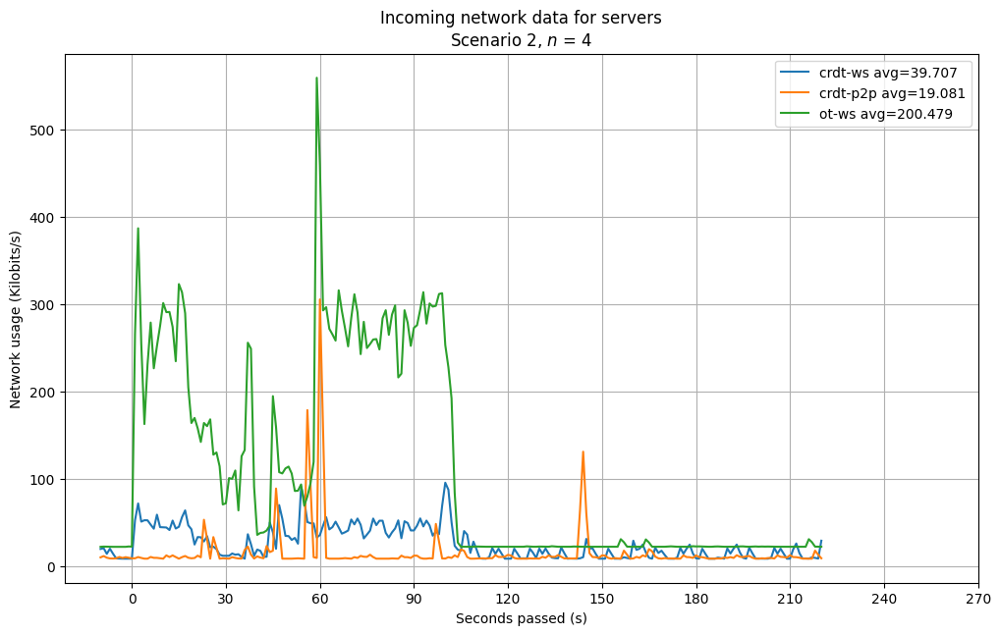

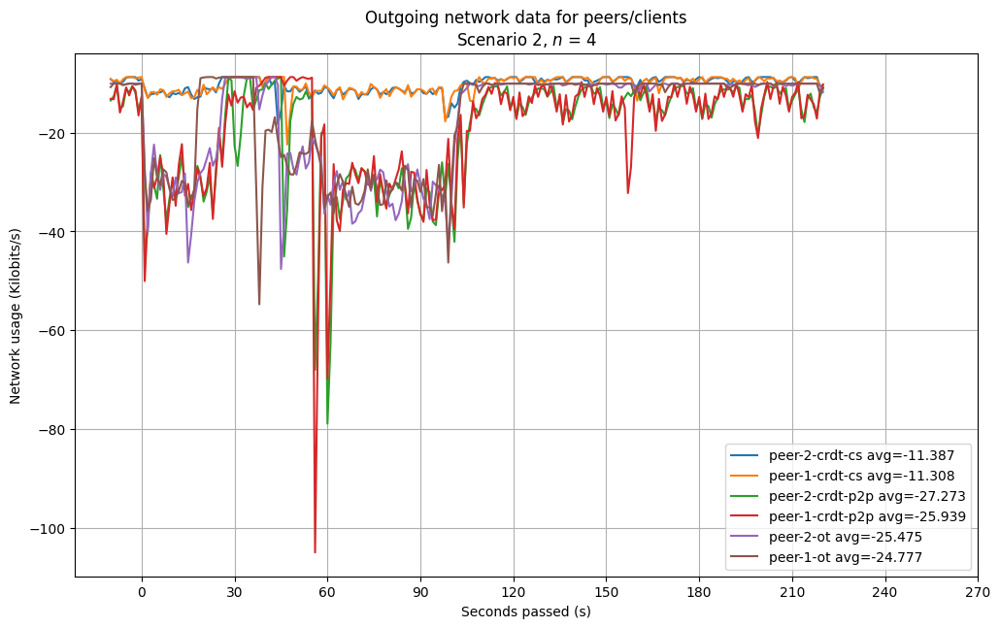

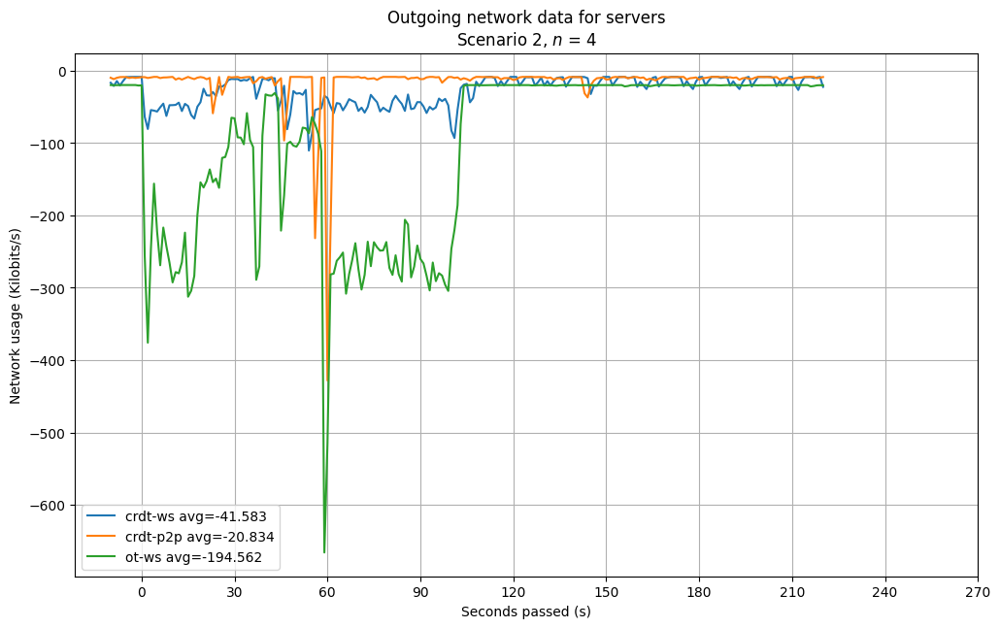

Currently computing for peers (8, 'n08')


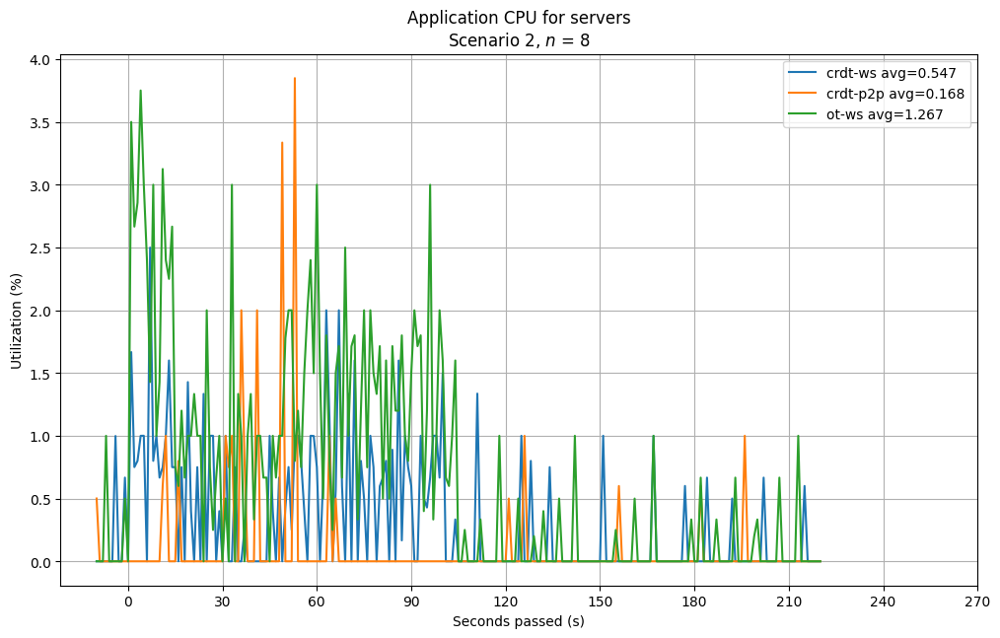

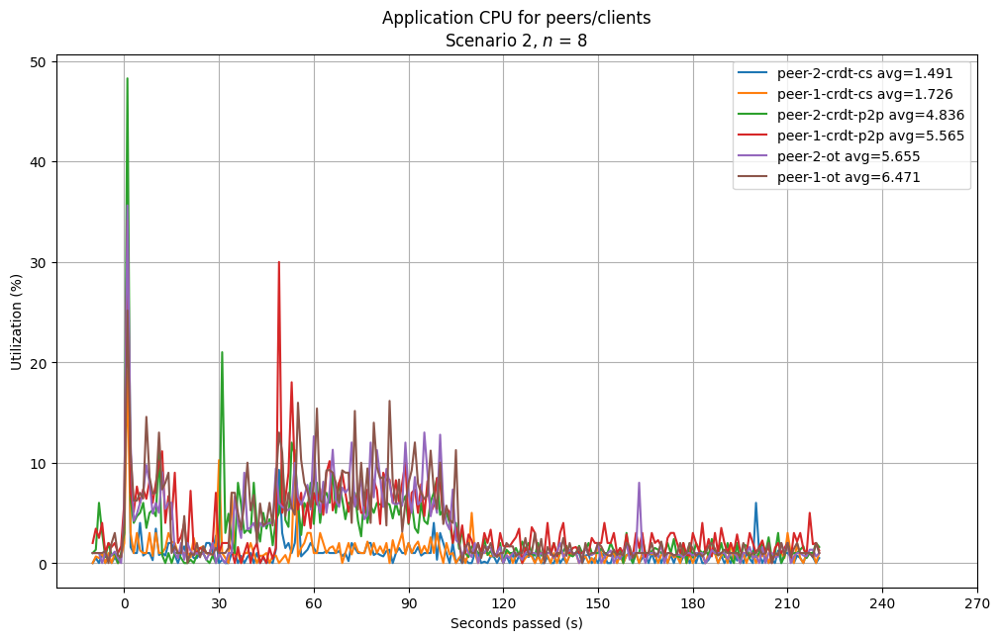

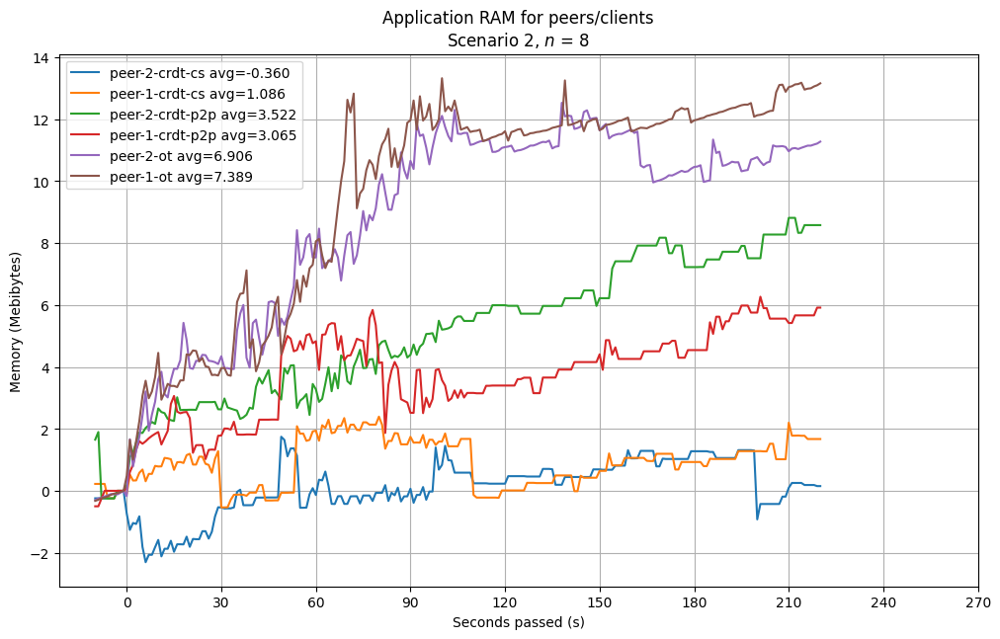

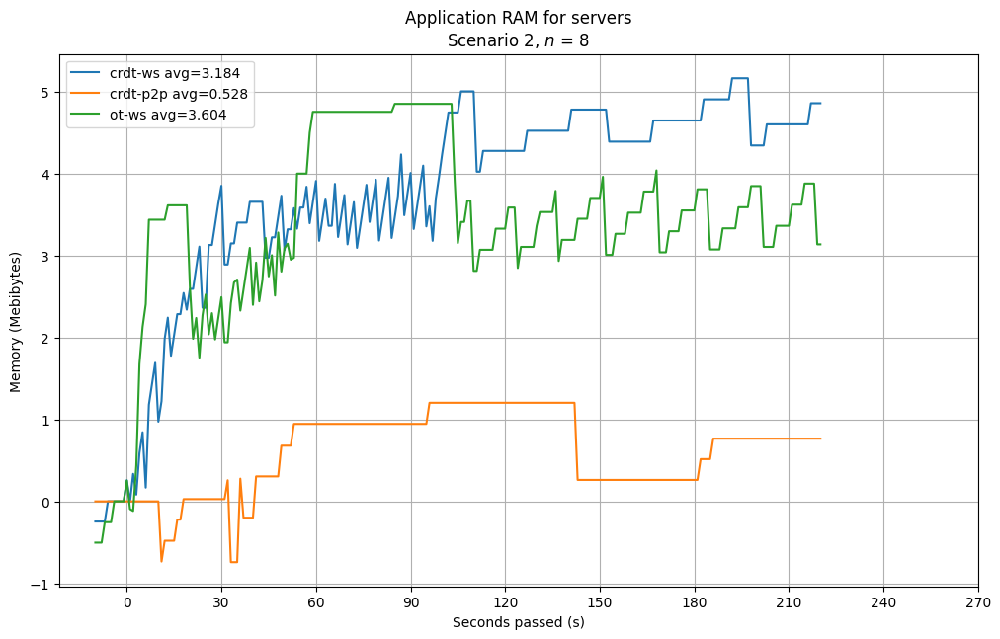

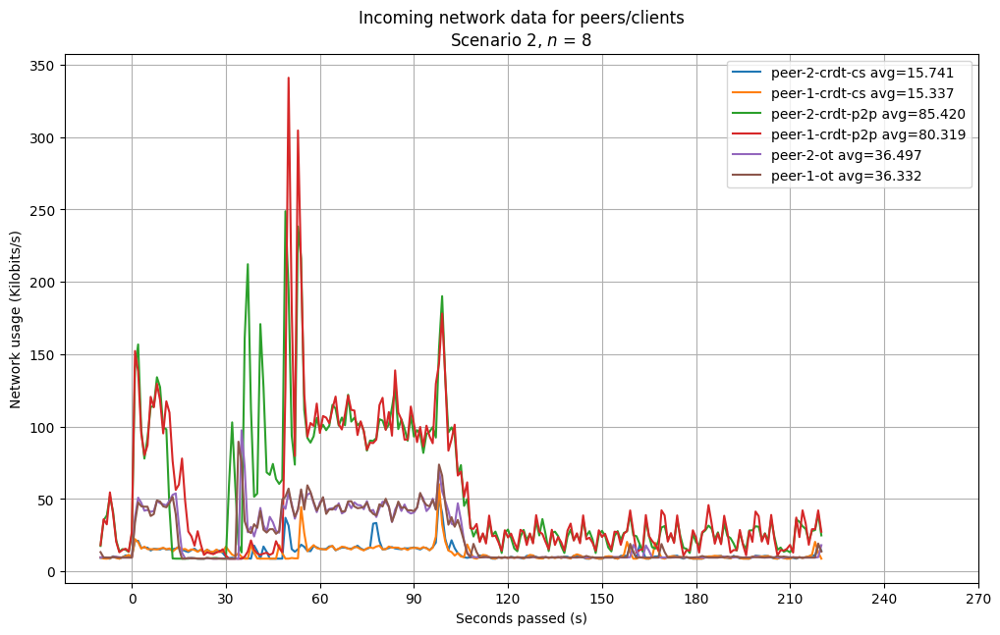

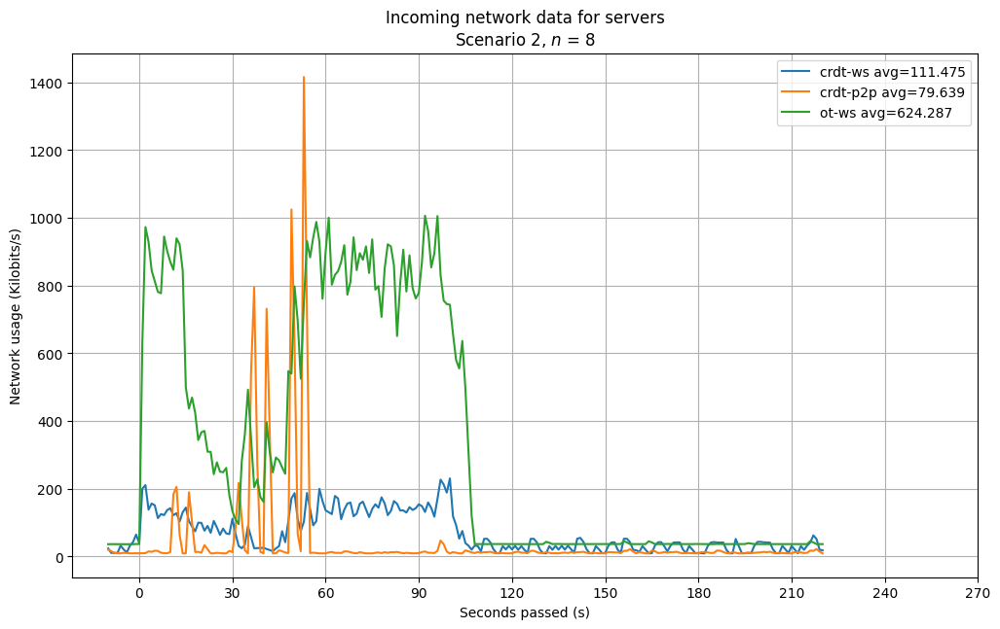

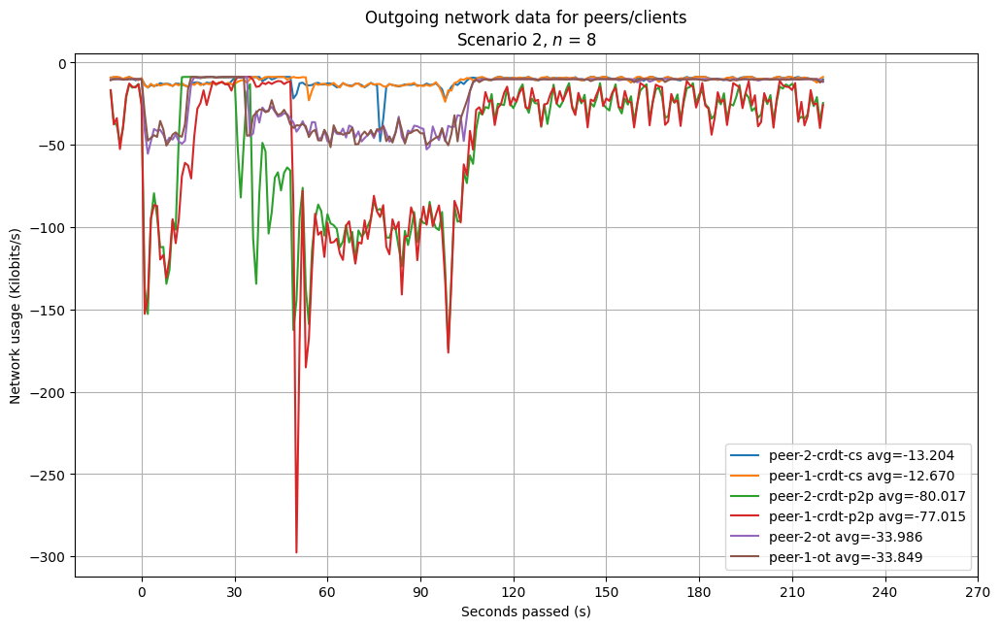

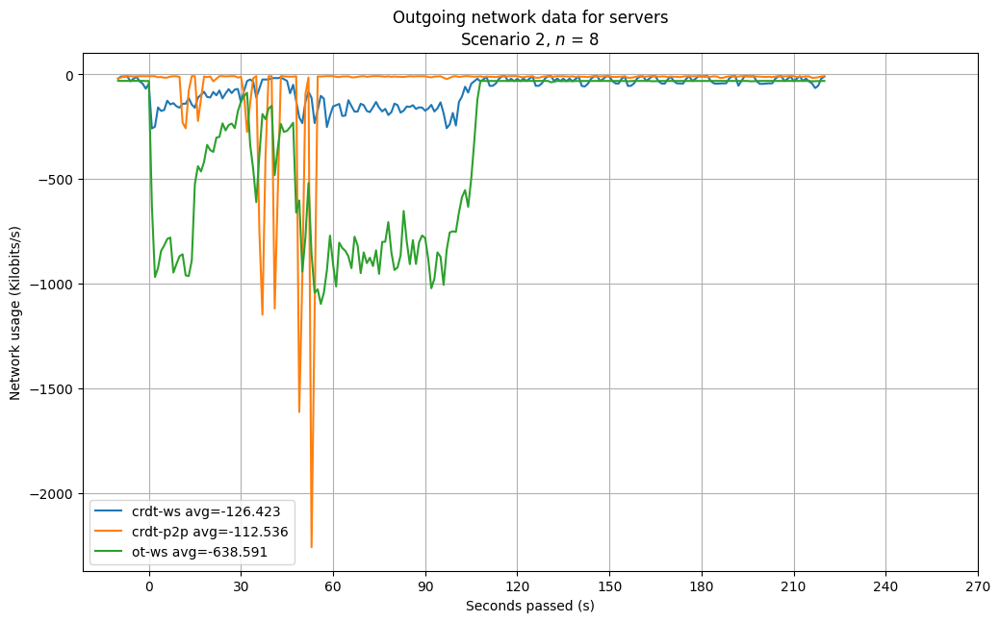

In [29]:
scenario(1)

Currently computing Scenario (3, 's3', 130)
Currently computing for peers (2, 'n02')


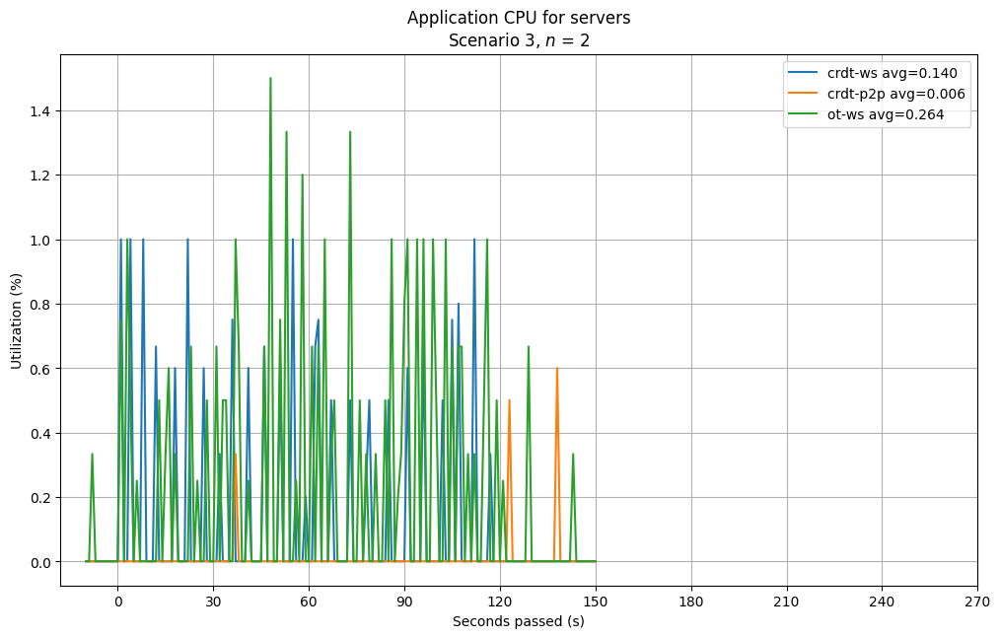

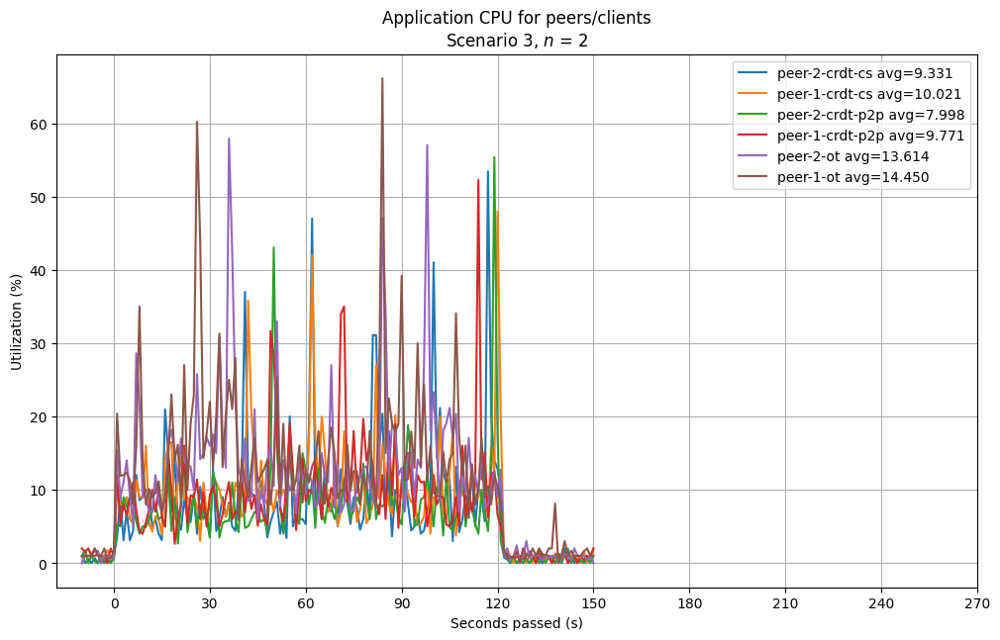

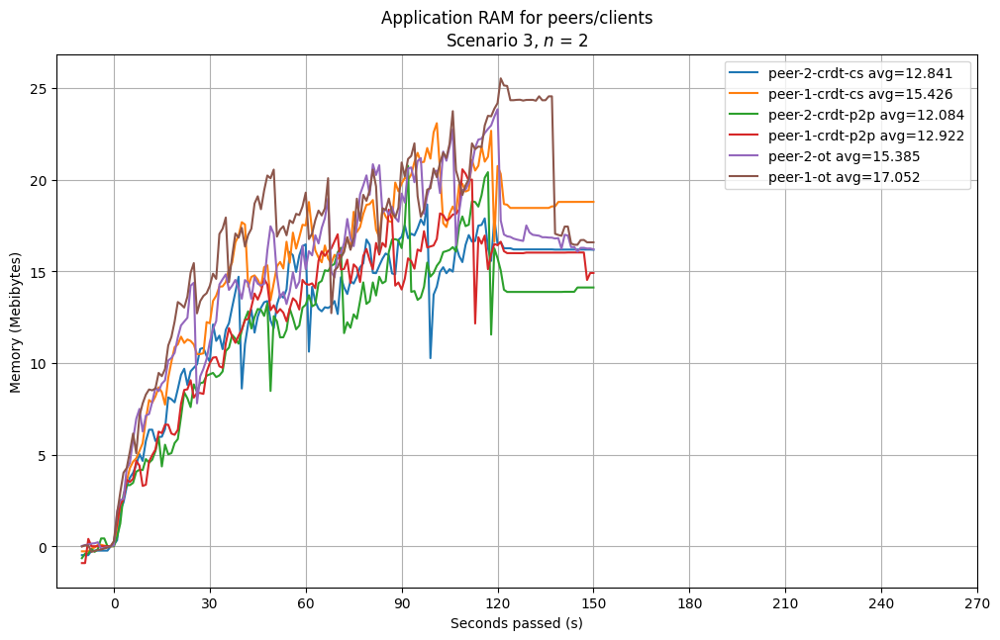

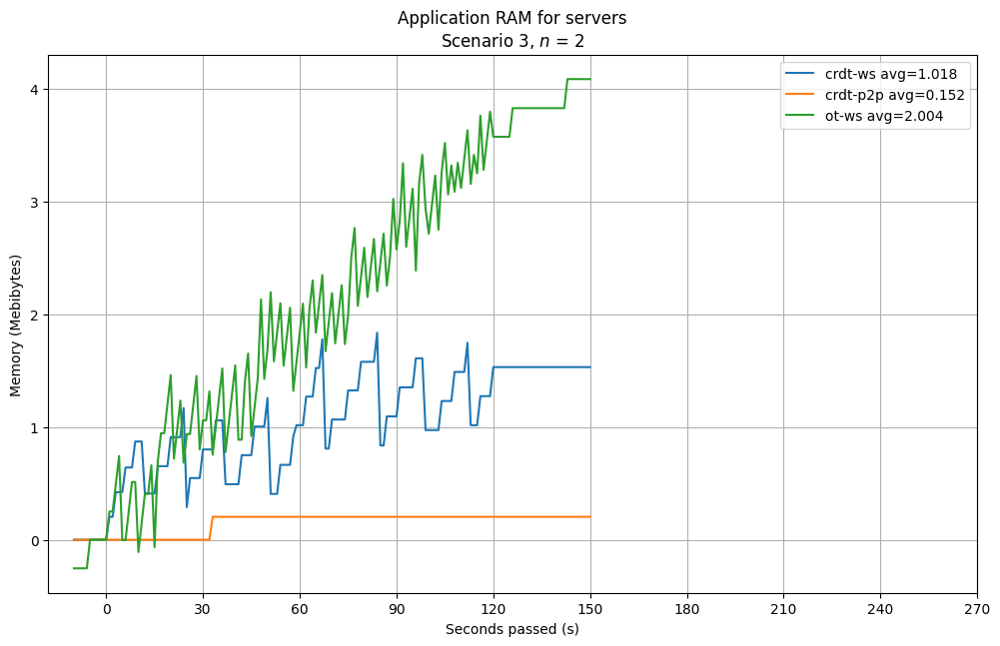

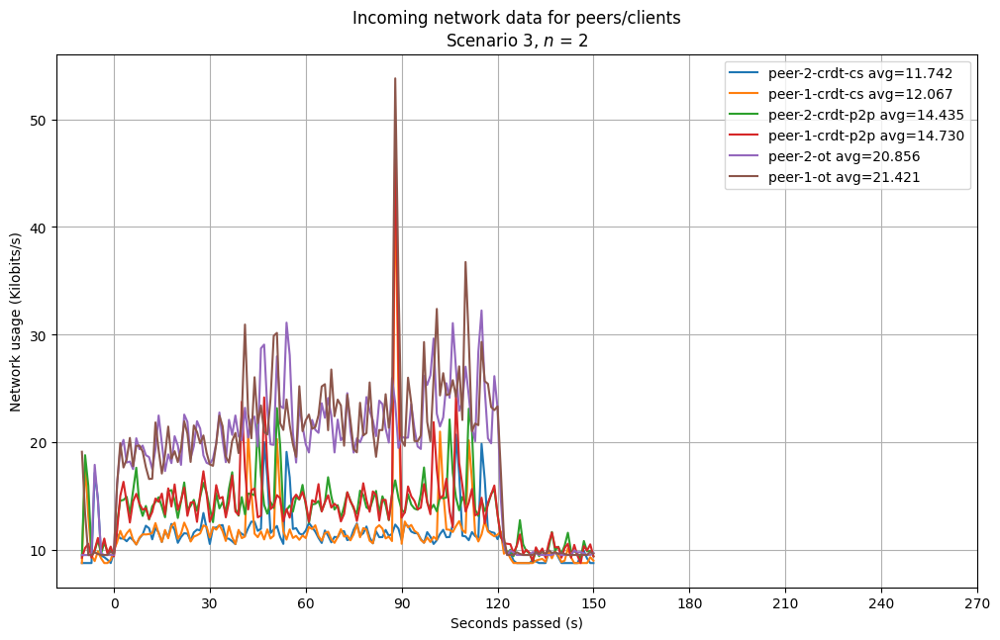

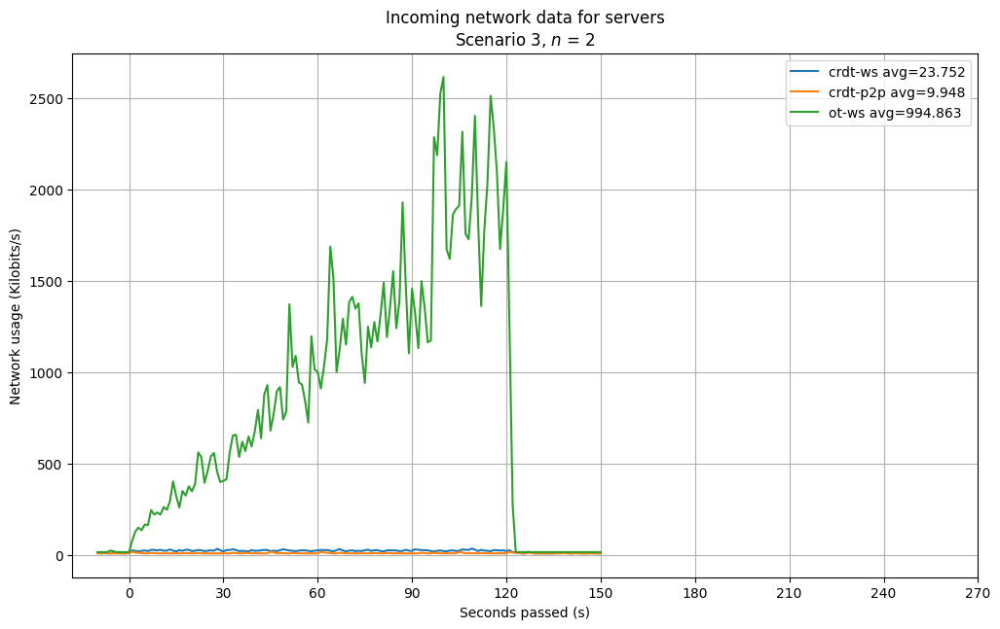

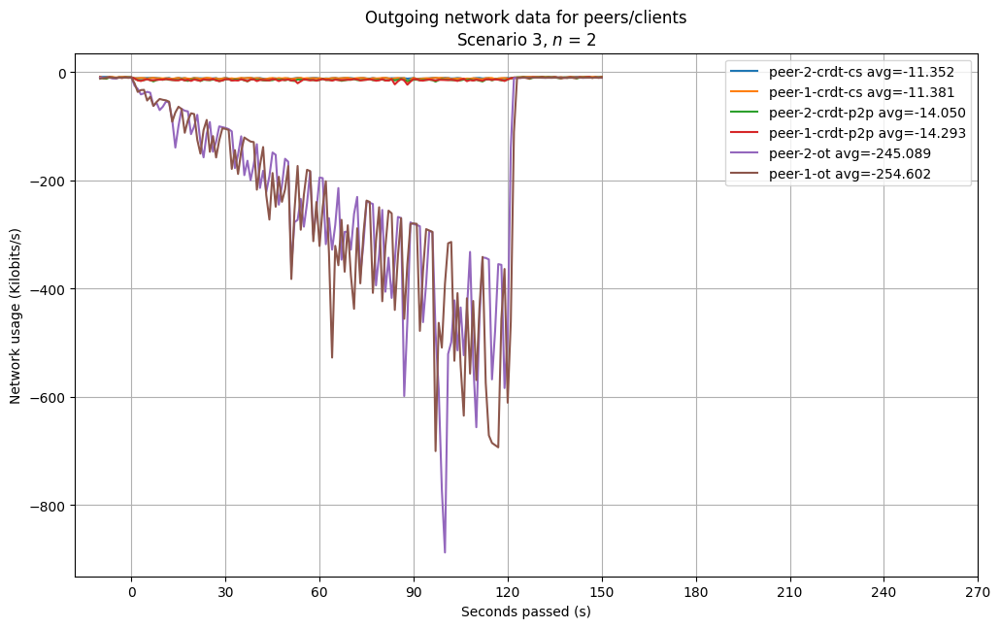

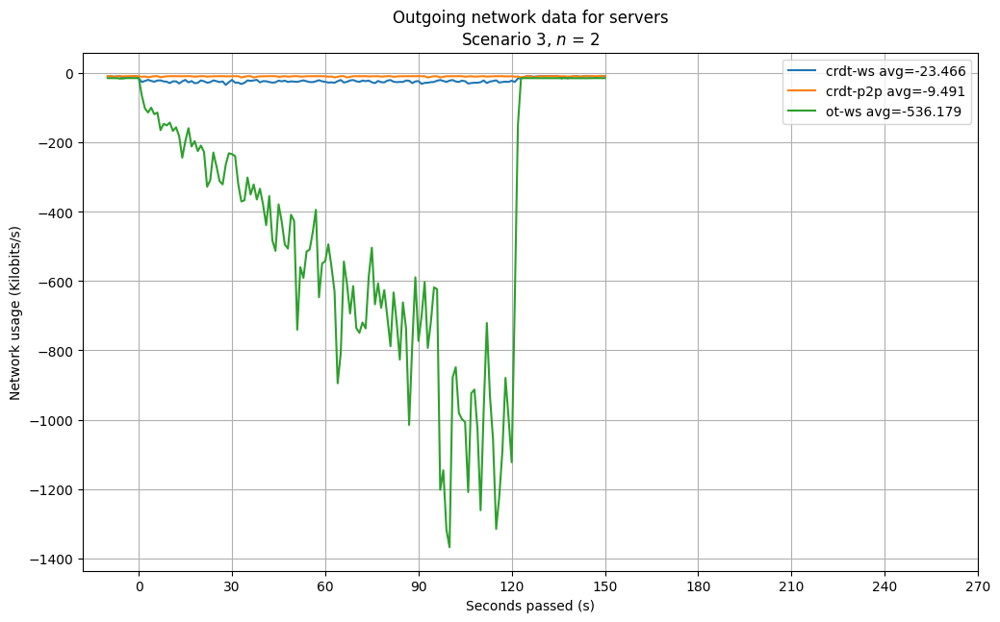

Currently computing for peers (4, 'n04')


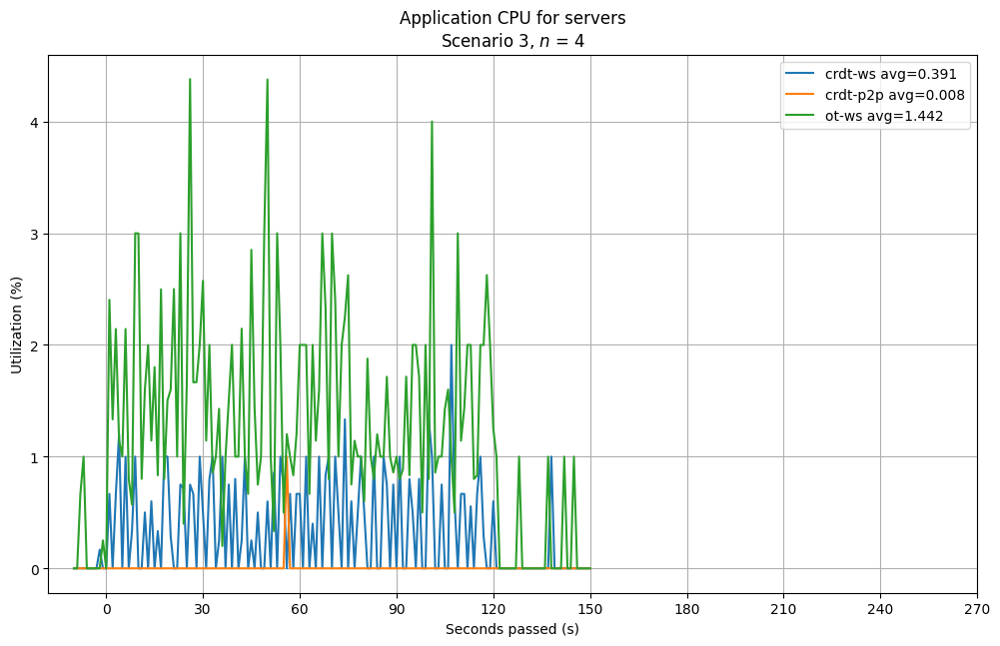

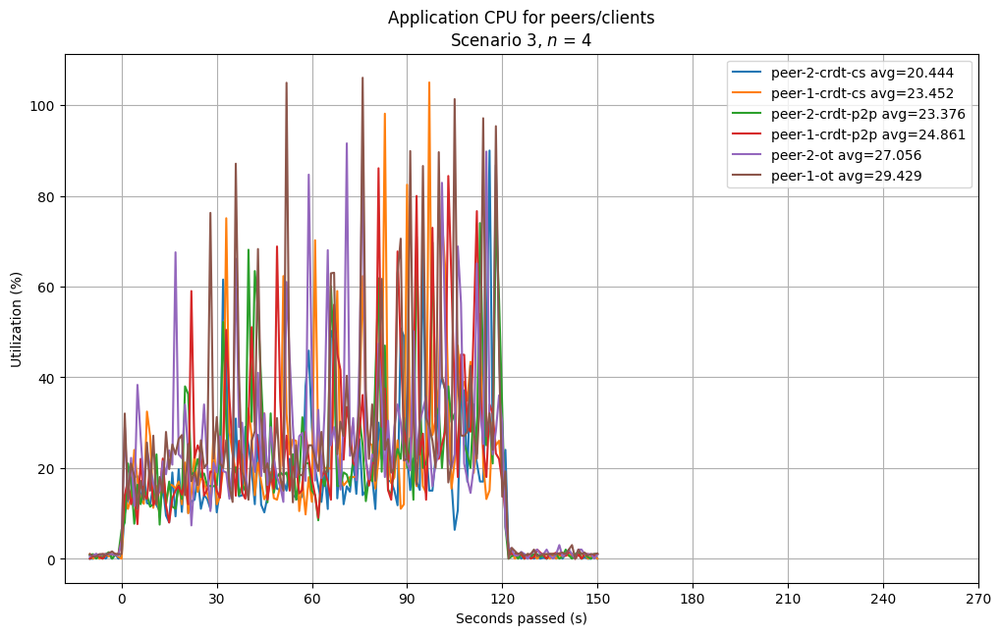

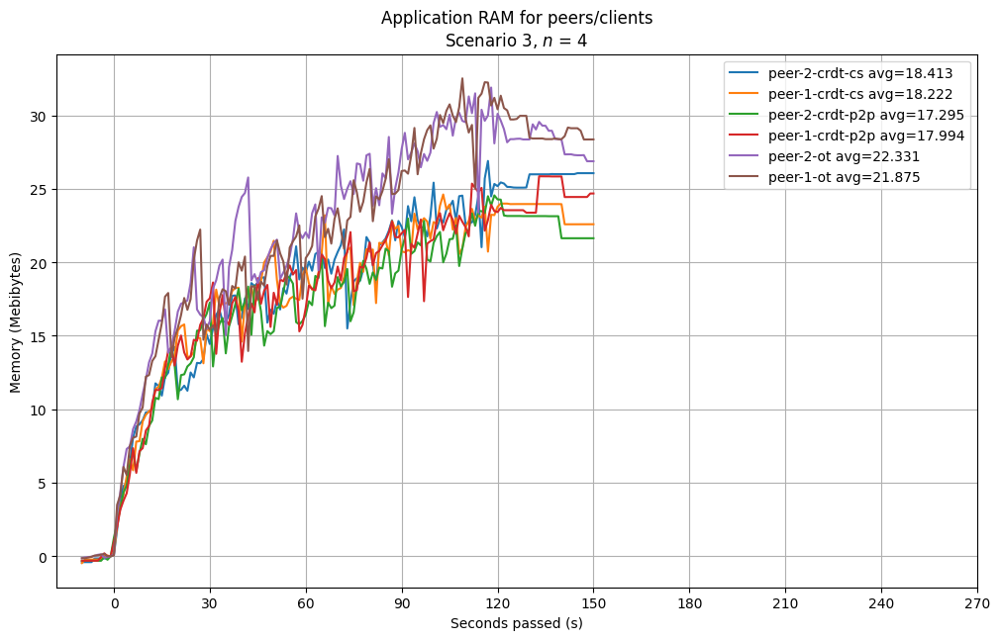

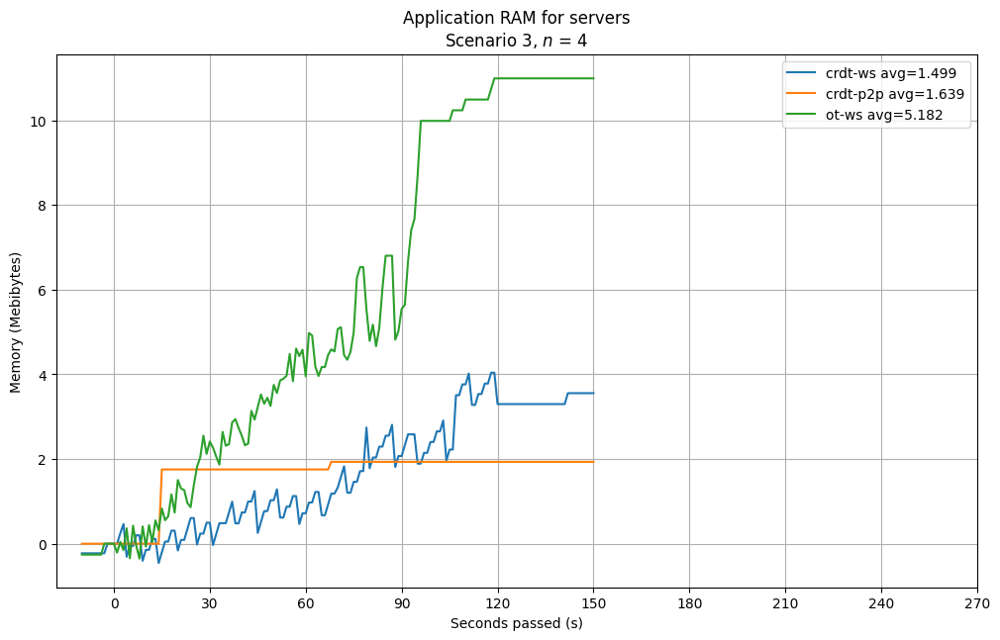

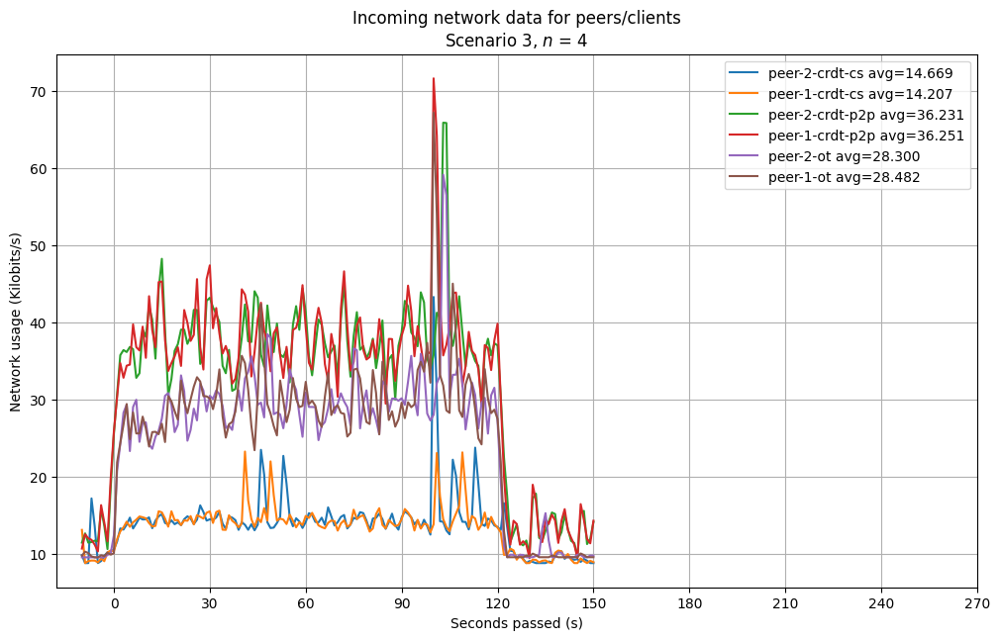

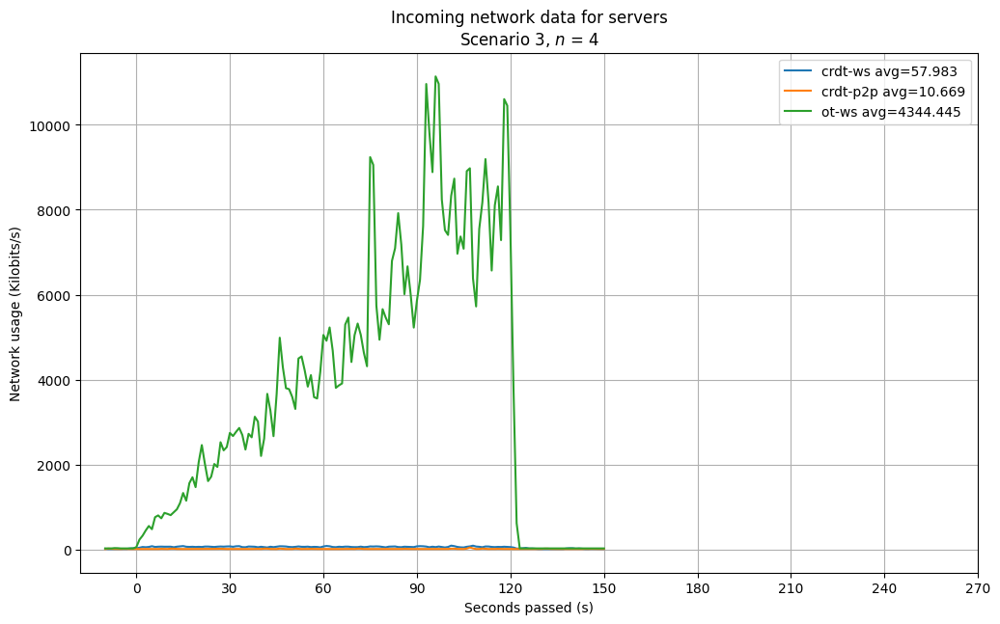

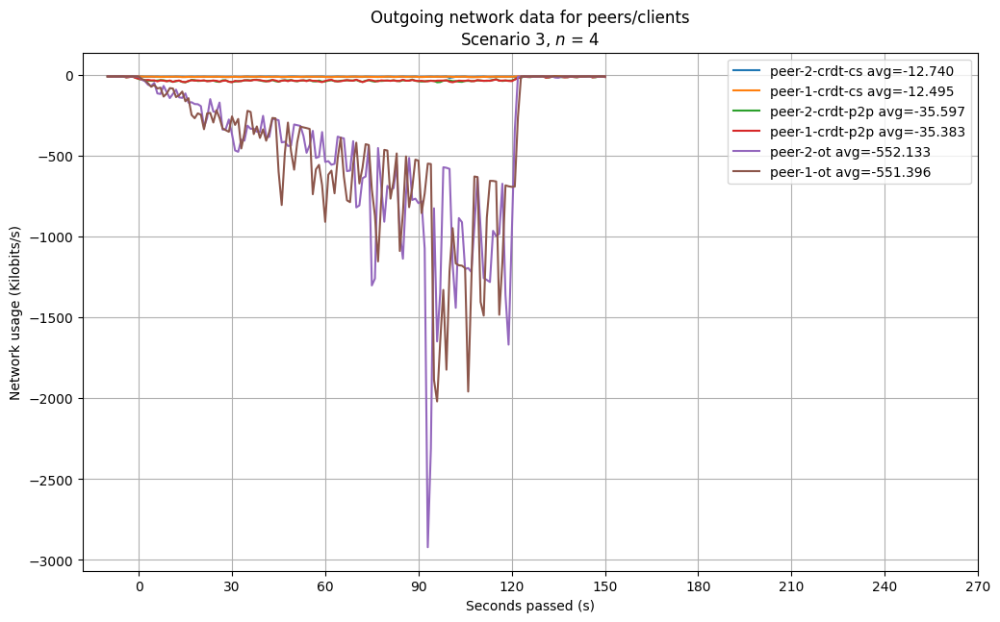

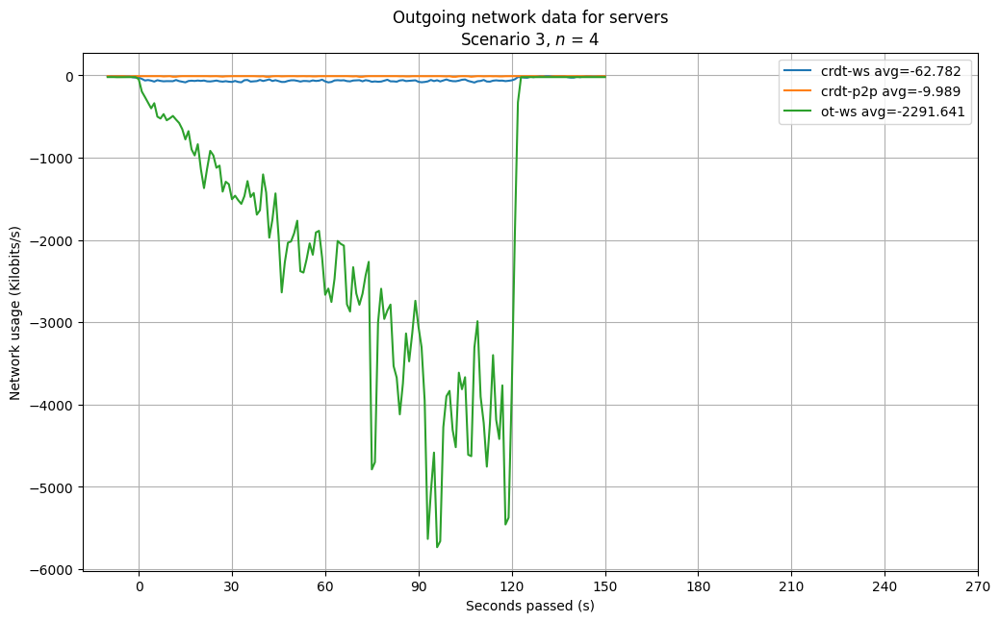

Currently computing for peers (8, 'n08')


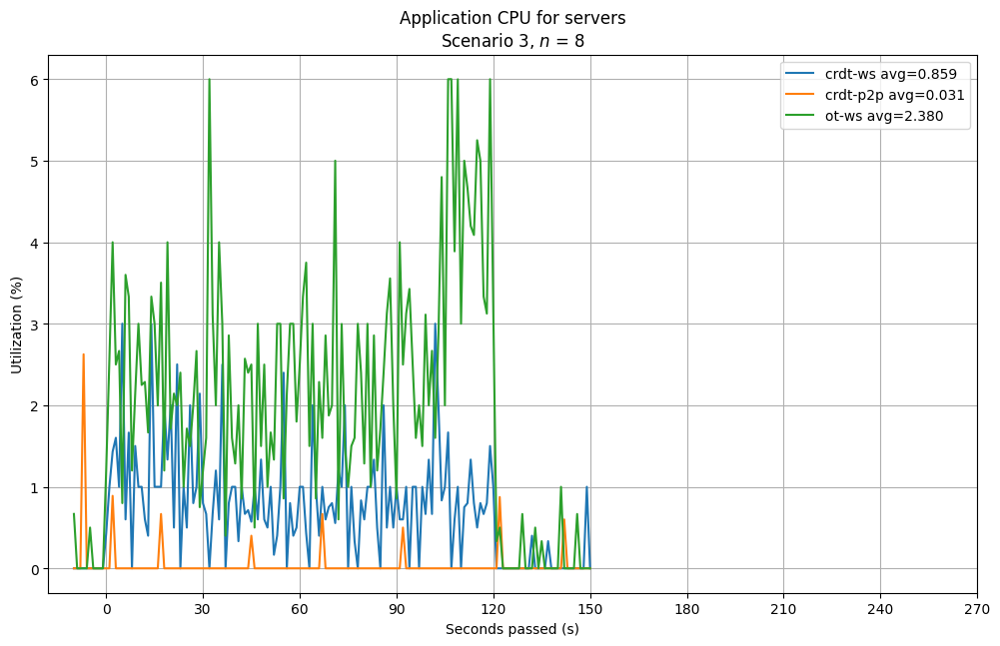

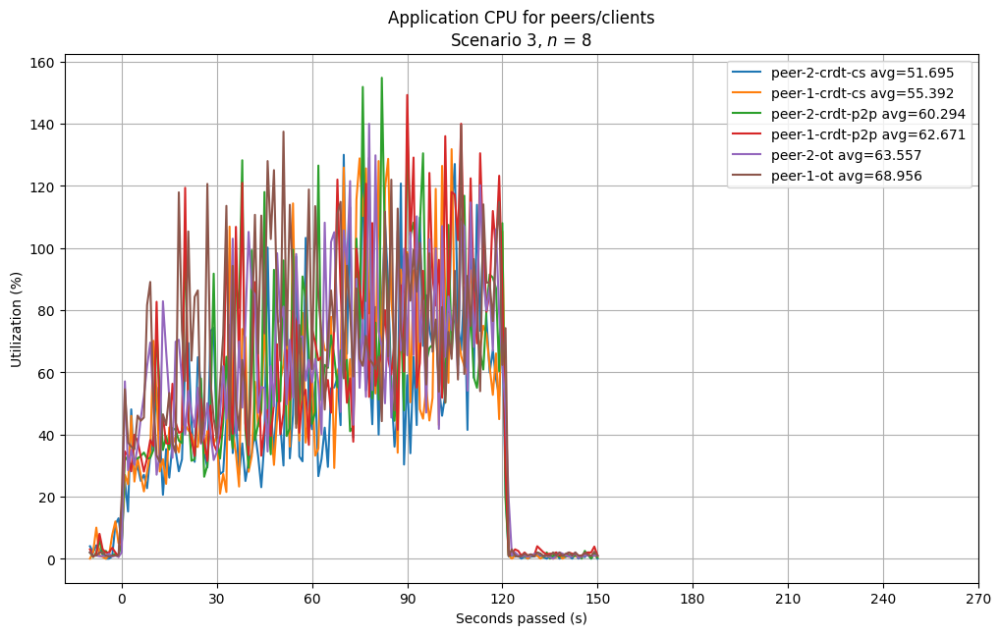

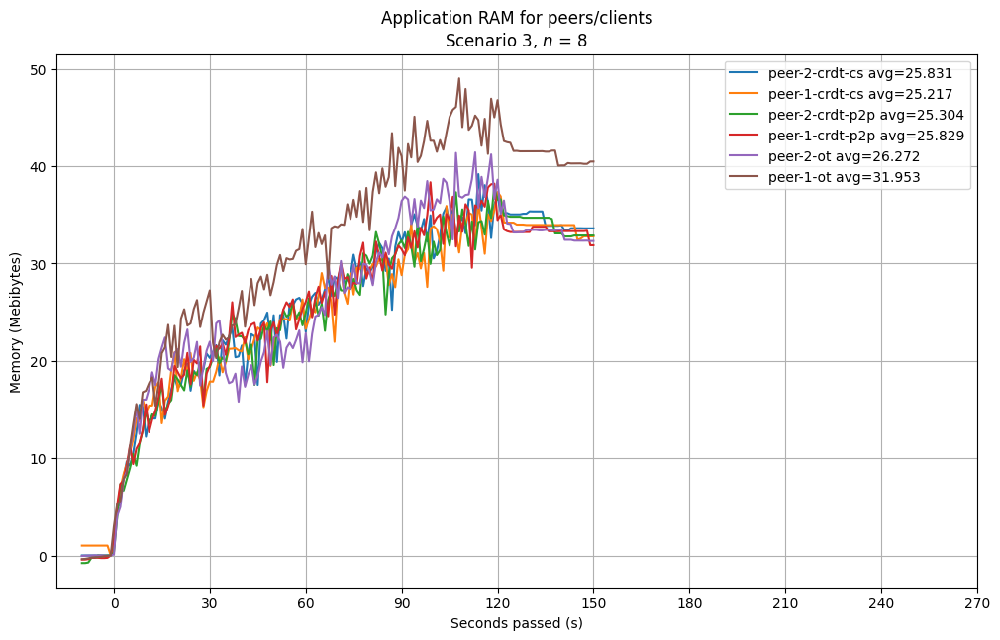

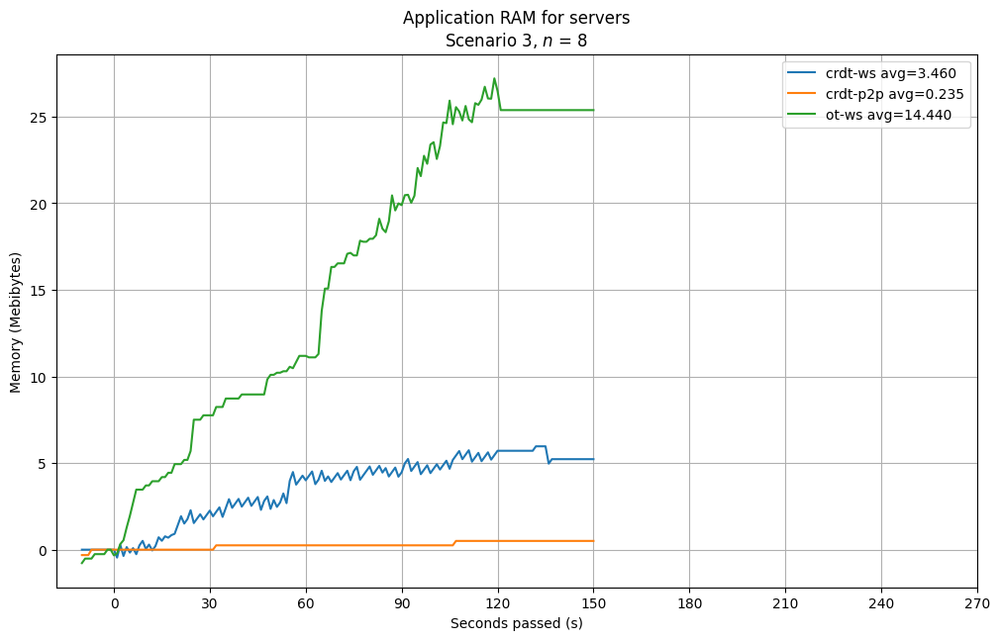

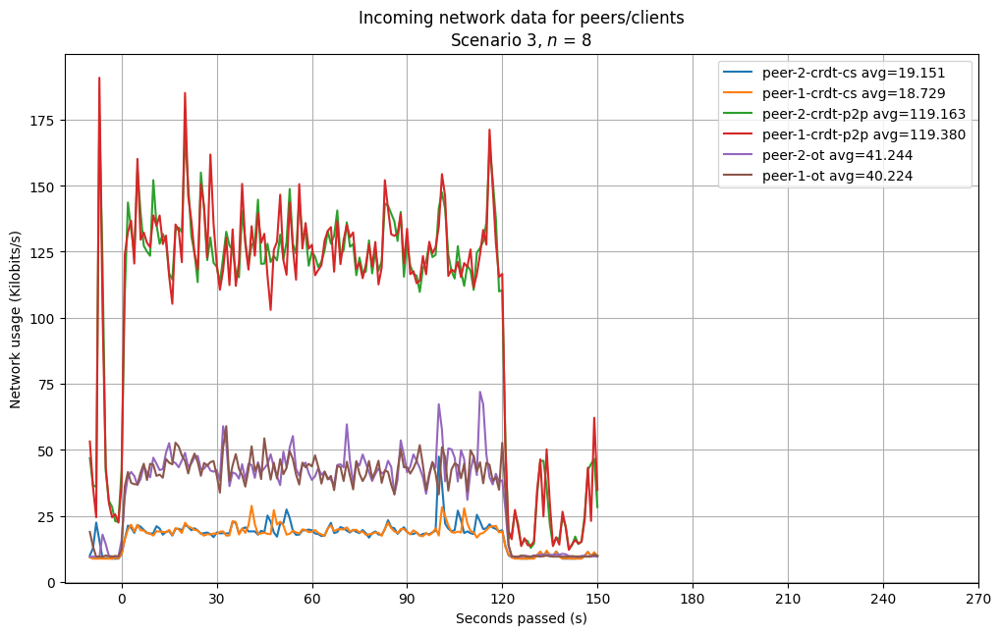

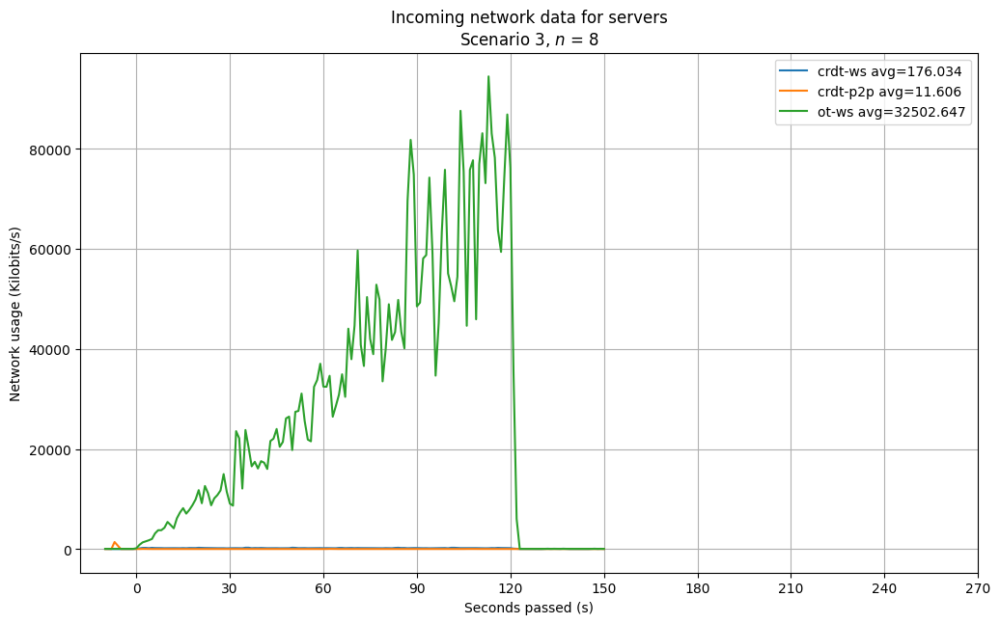

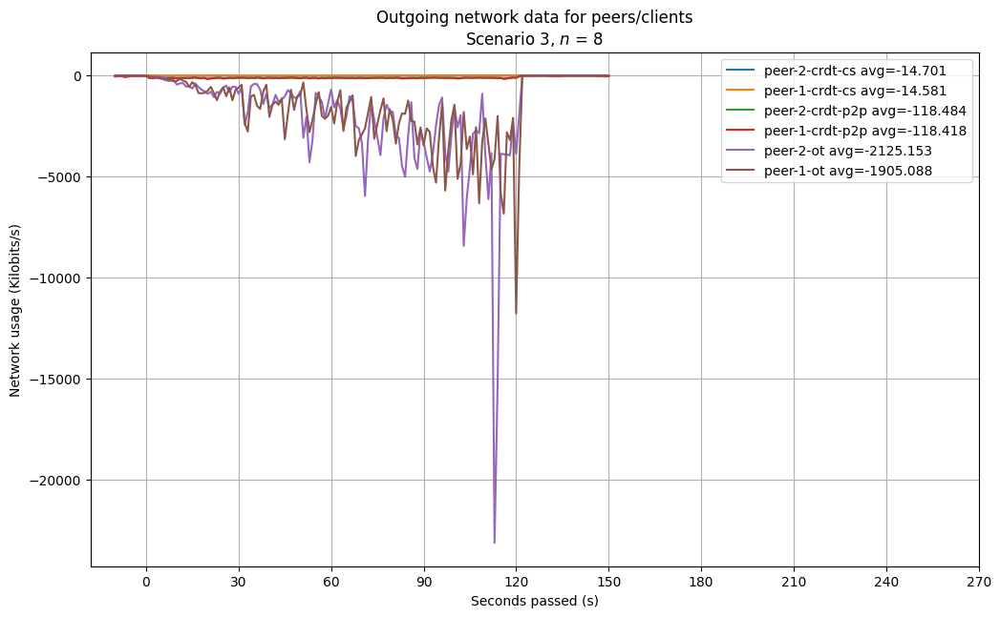

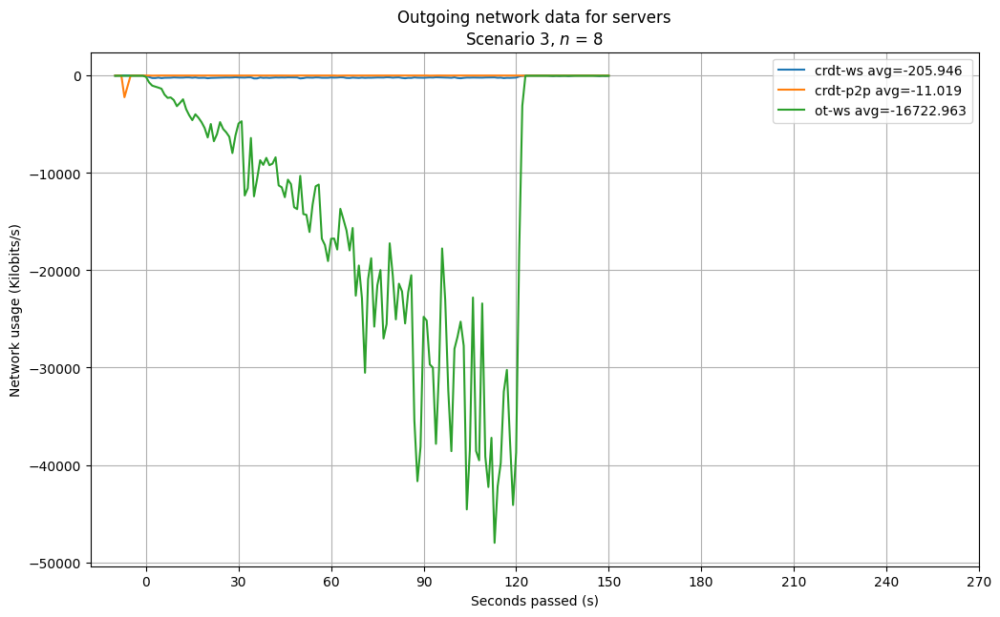

In [30]:
scenario(2)

Currently computing Scenario (4, 's4', 120)
Currently computing for peers (2, 'n02')


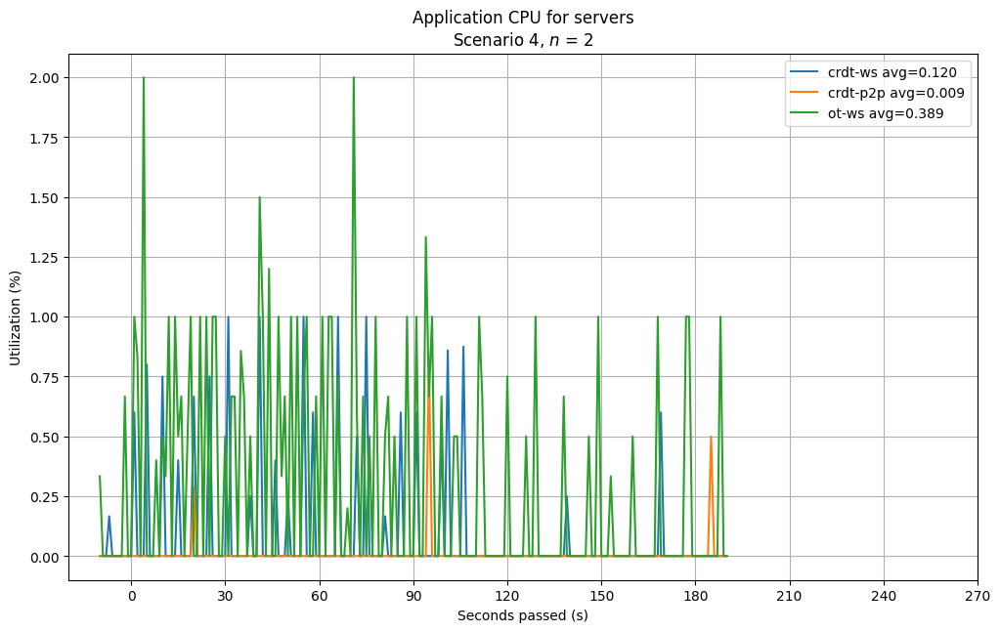

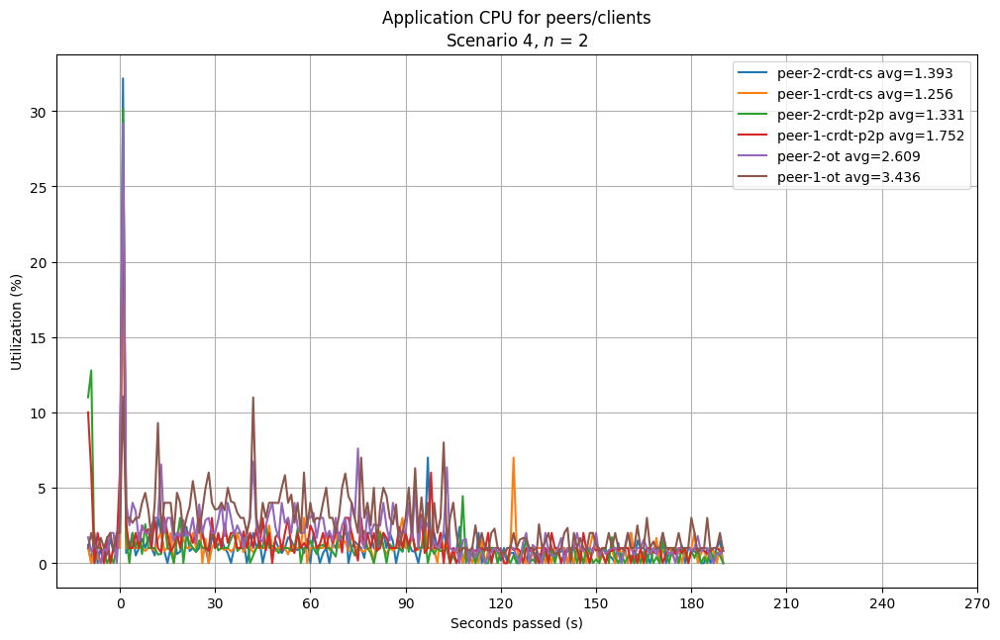

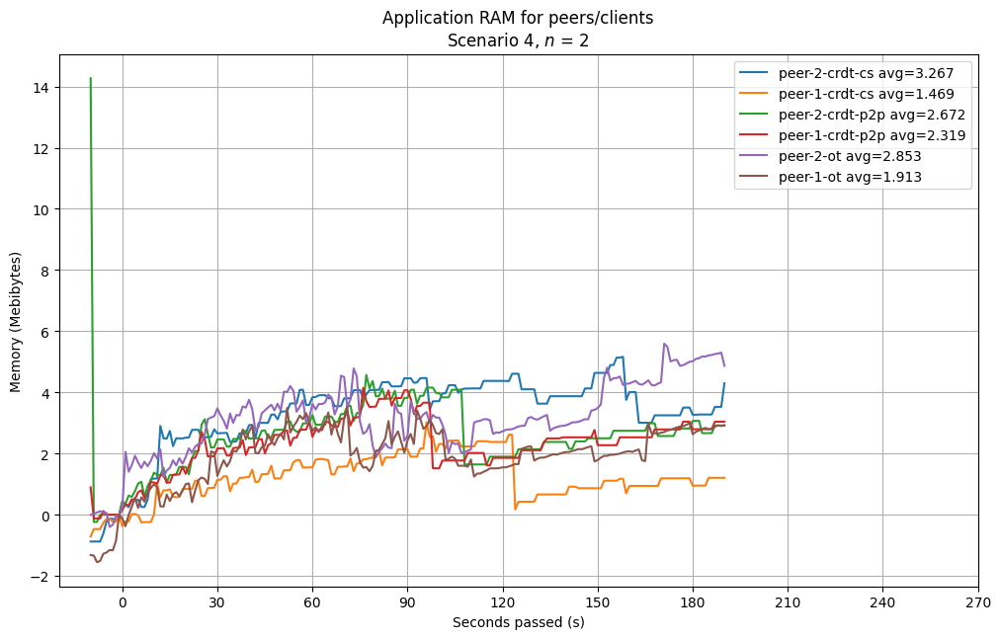

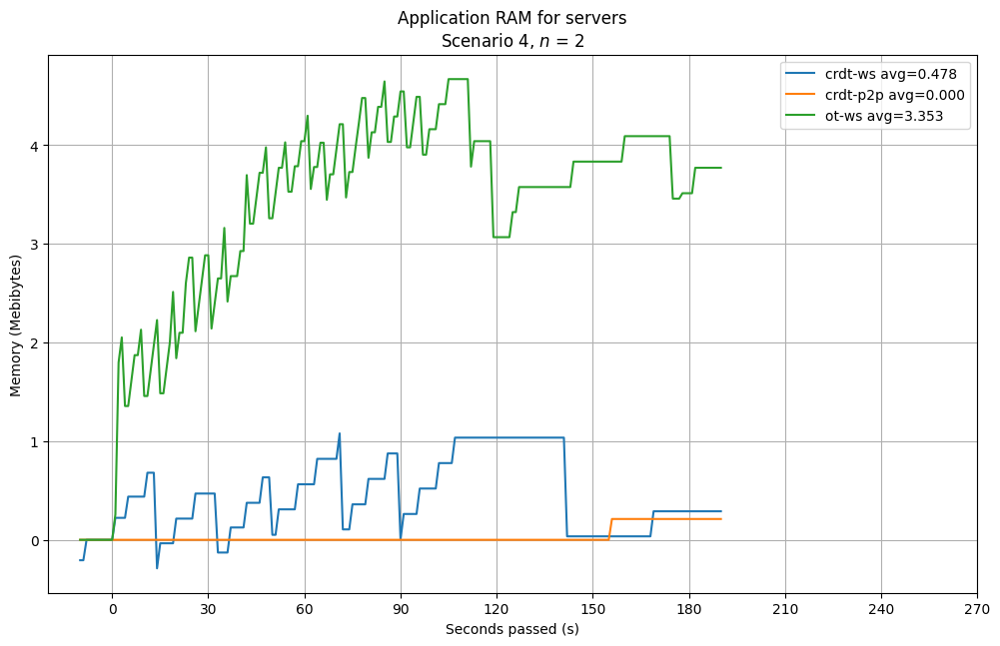

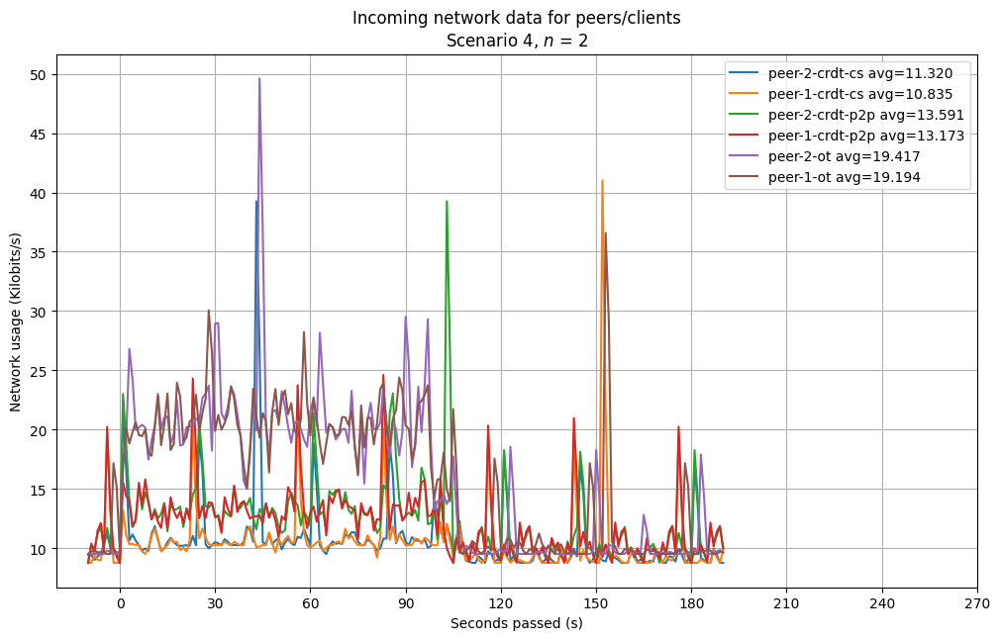

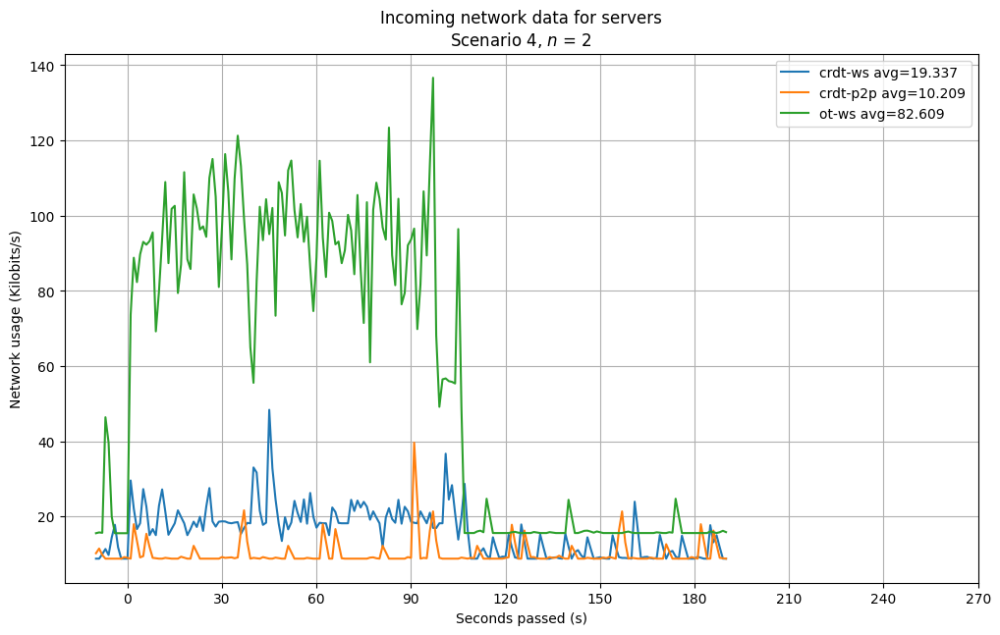

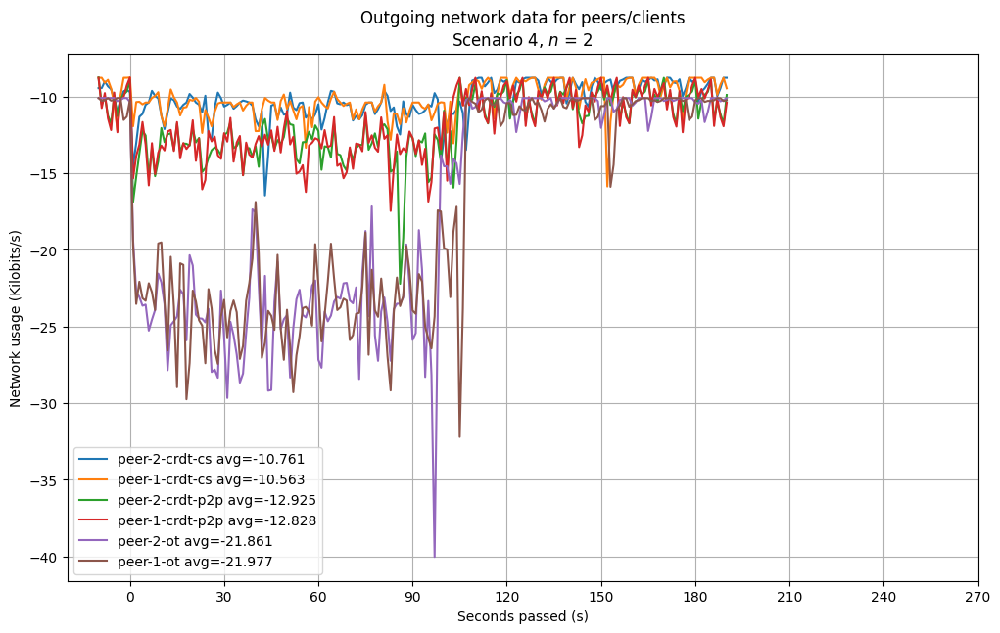

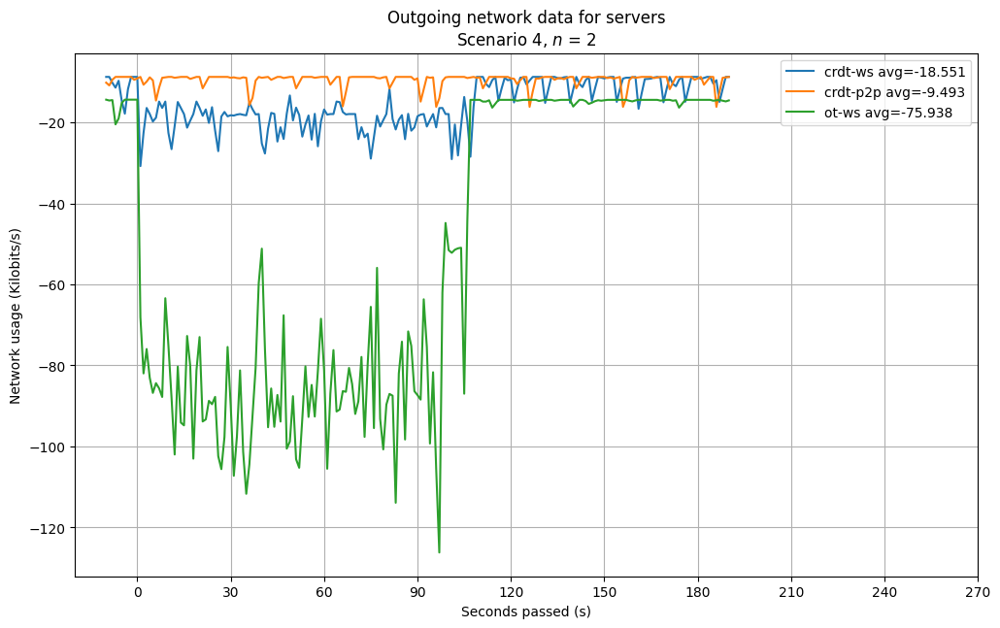

Currently computing for peers (4, 'n04')


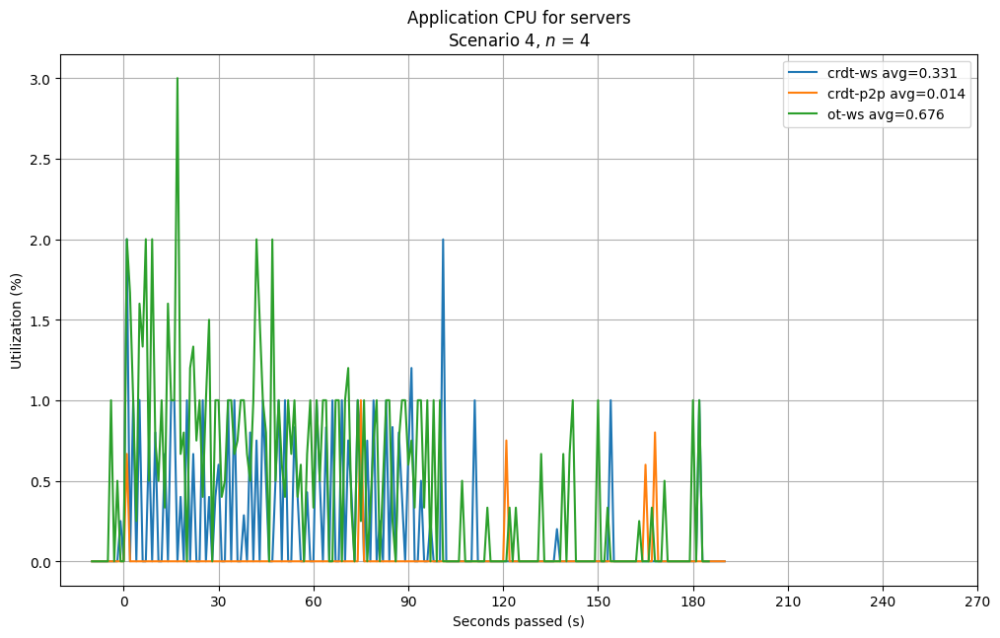

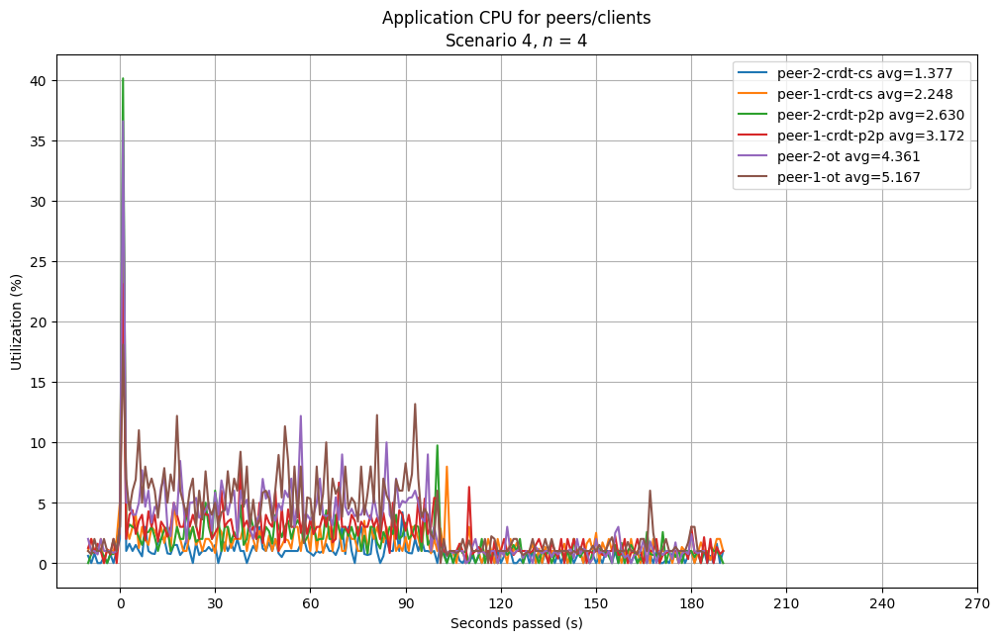

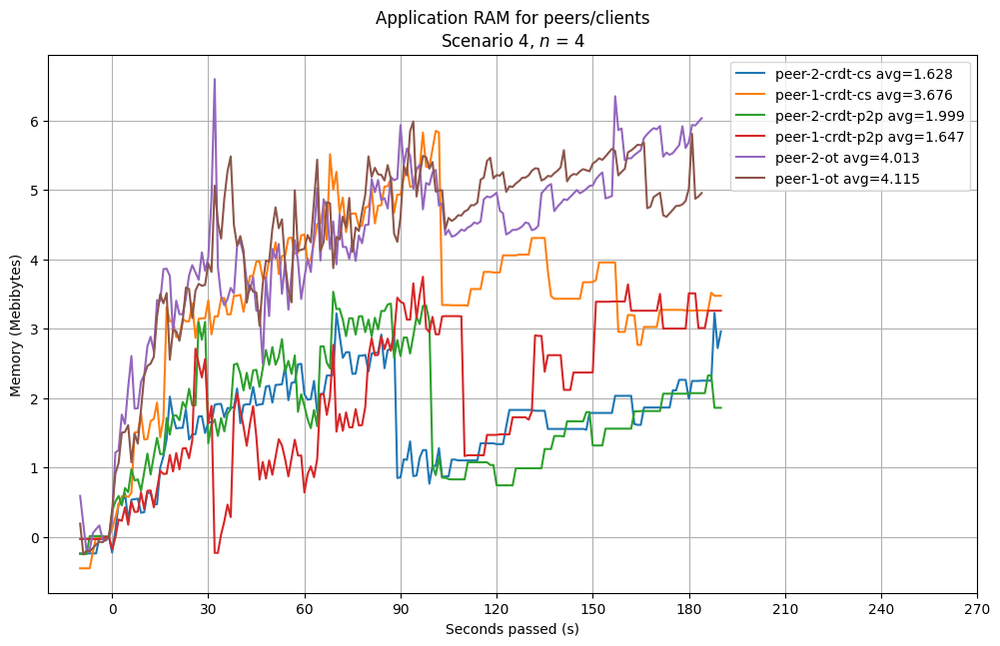

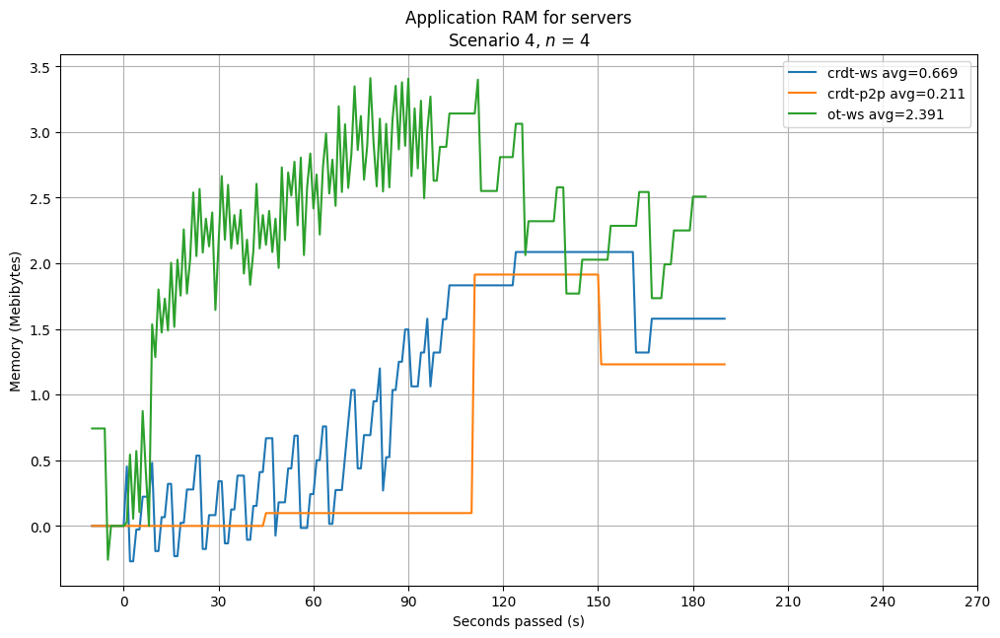

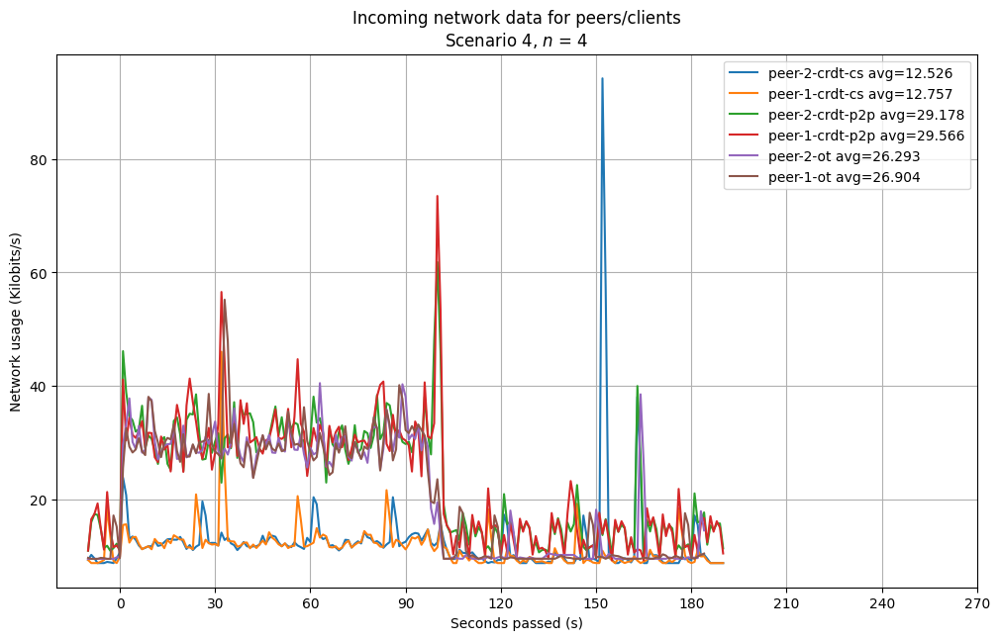

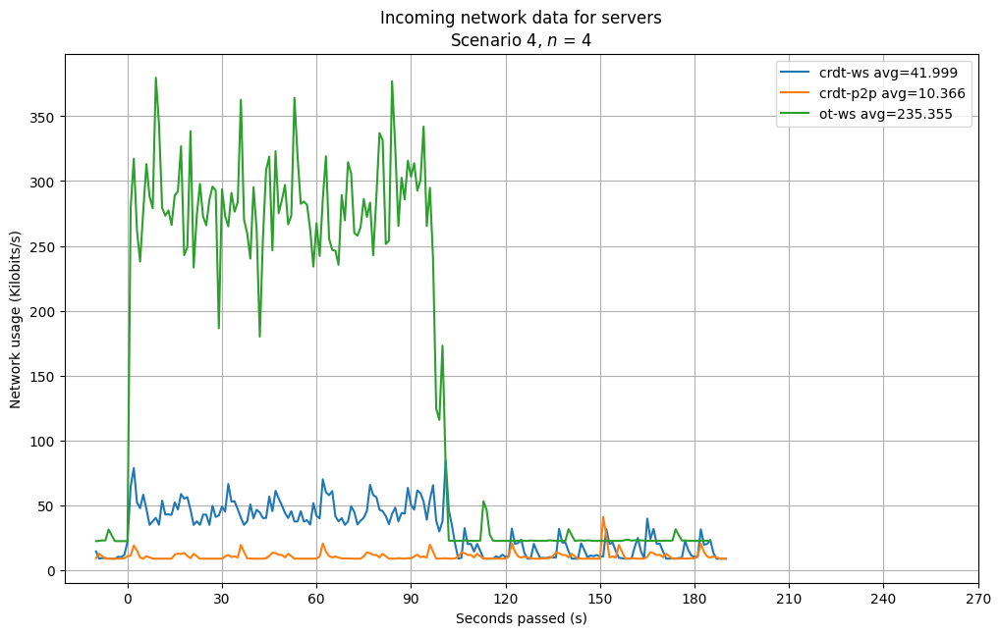

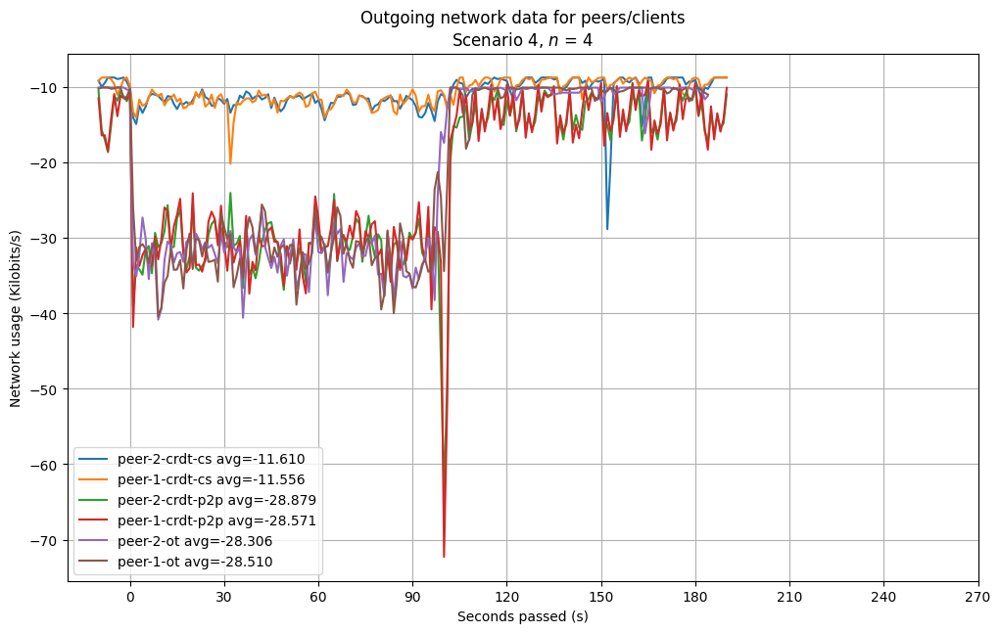

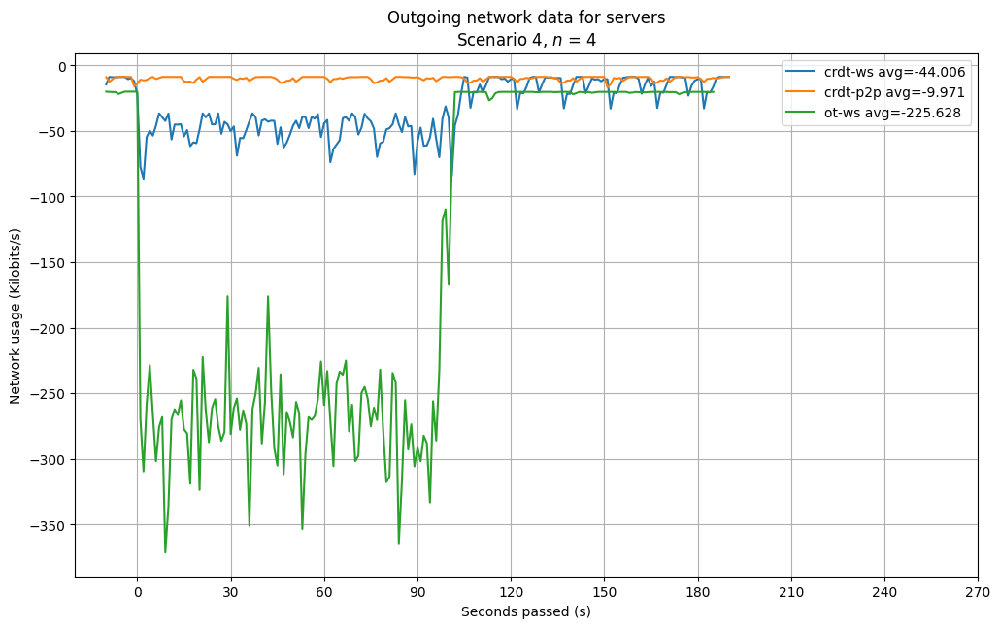

Currently computing for peers (8, 'n08')


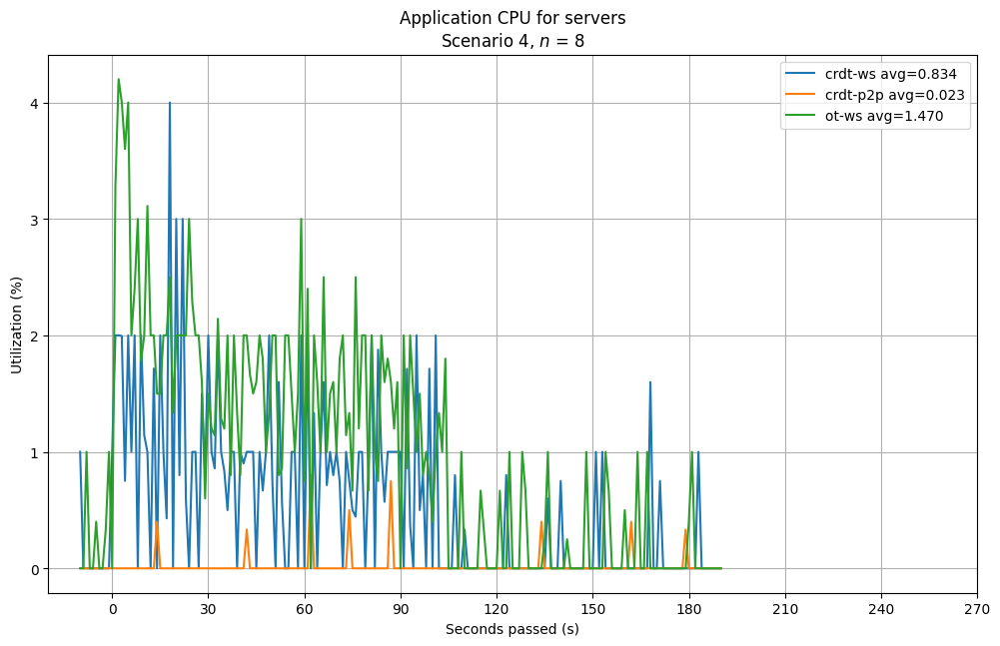

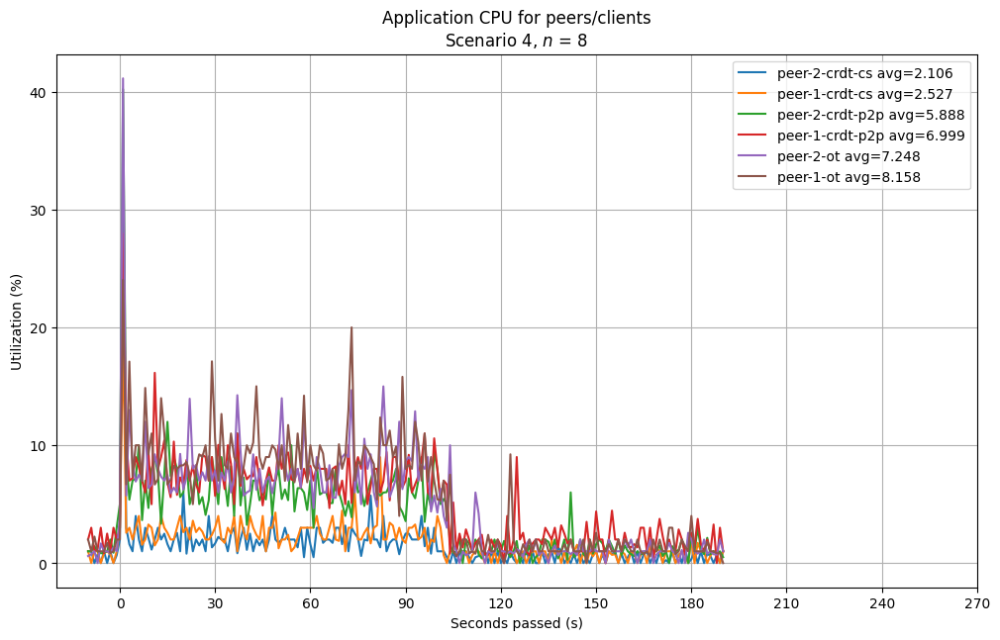

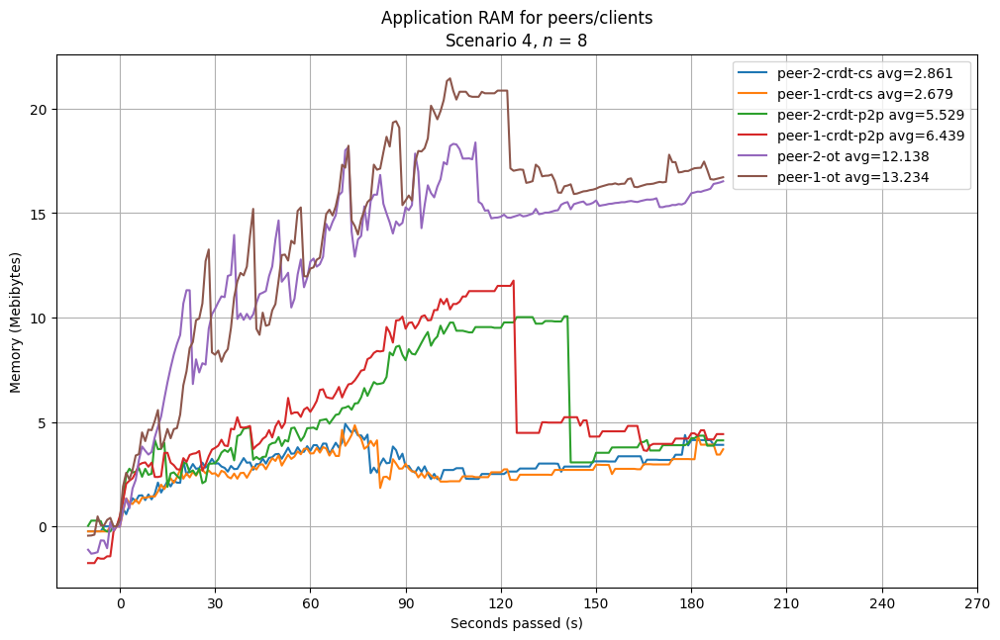

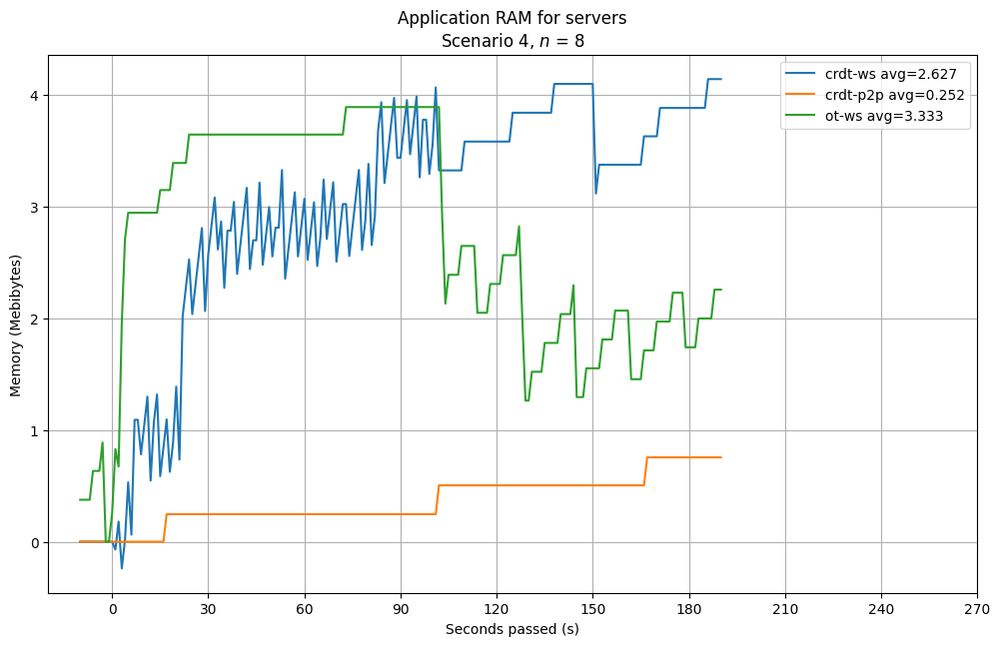

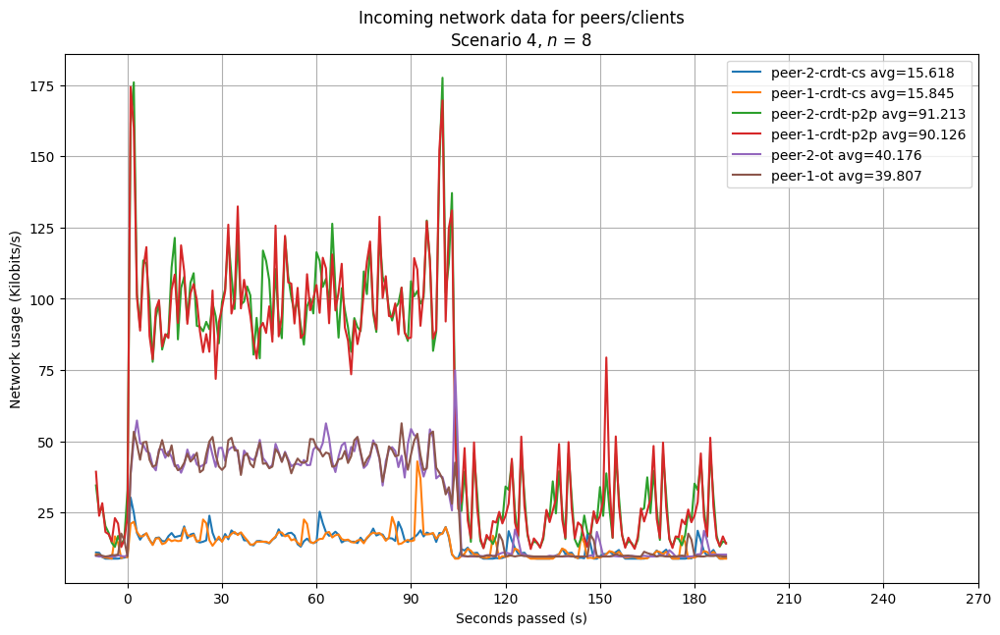

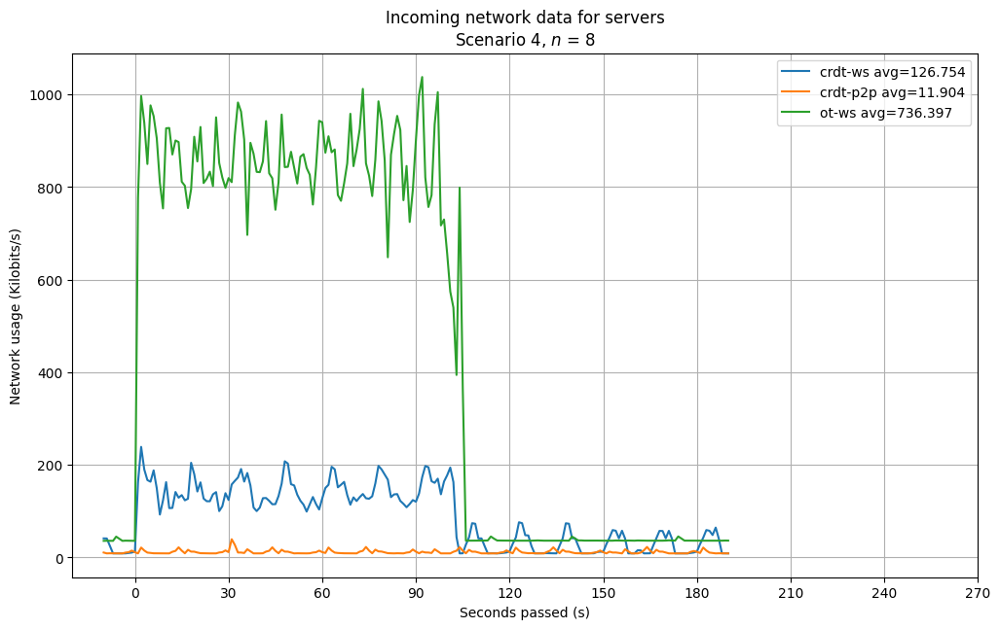

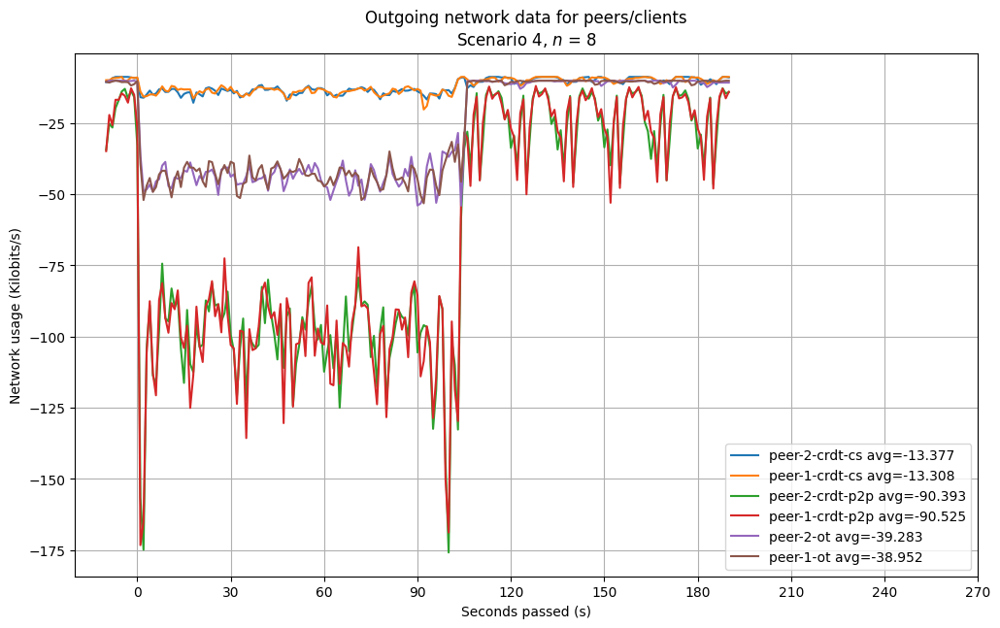

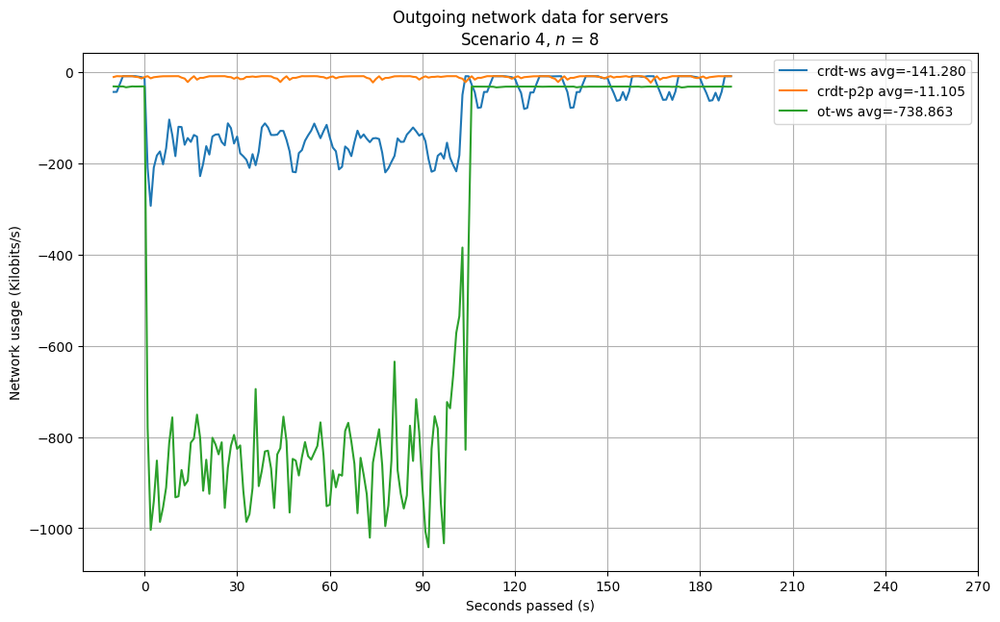

In [31]:
scenario(3)

Currently computing for peers (2, 'n02')


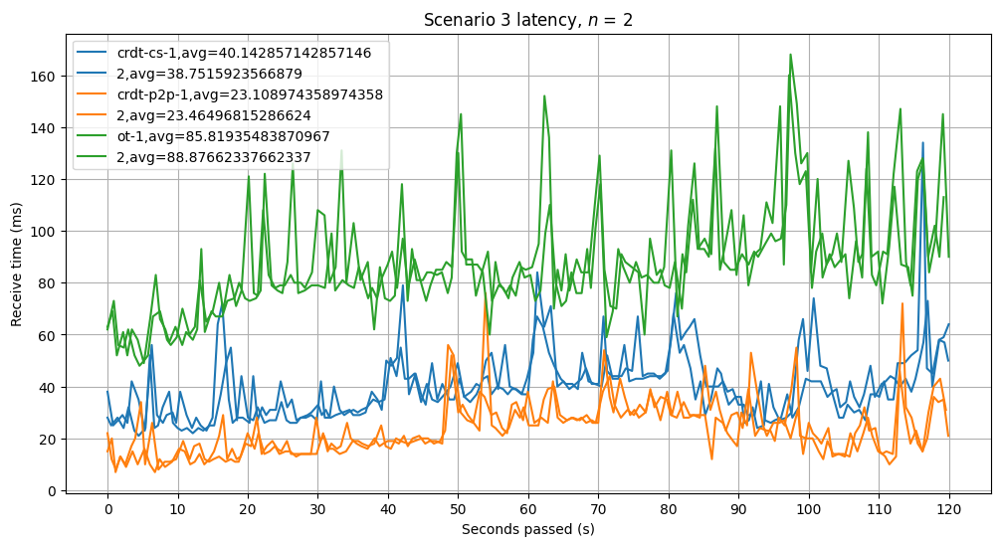

Currently computing for peers (4, 'n04')


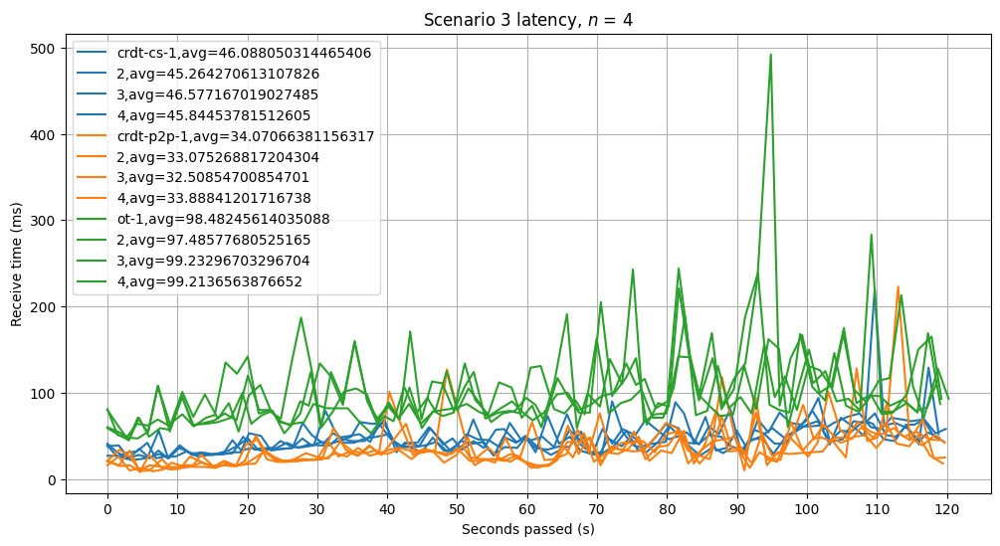

Currently computing for peers (8, 'n08')


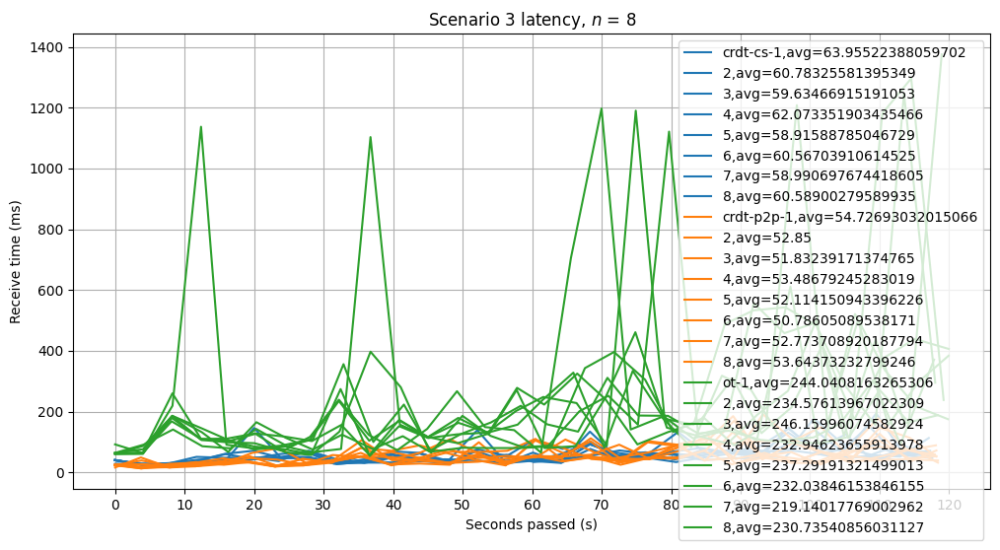

In [32]:
def scenario_three_checker_chaos():
    logger = [["parameter","peer number","instance", "avg", "med", "max", "min"]]
    current_scenario = scenario_list[2]
    for n in number_of_peers_list:
        declare_n(n)
        data_path = os.path.join(os.getcwd(), current_scenario[1], n[1])

        plt.figure(figsize=(12, 6))
        plots = dict()
        plotting_groups = dict()
        for server_kind in type_list:

            start_time = None
            end_time = None
            for i in range(1, n[0] + 1):
                log_path = os.path.join(data_path, server_kind[1], f"peer-{i}")
                # print(log_path)
                log_file = glob.glob(f"{log_path}/*.log")
                assert(len(log_file) == 1)
                assert(os.path.isdir(log_path))
                log_file = log_file[0]
                
                with open(log_file, 'r') as log_buffer:
                    log_data = log_buffer.read()
                    test_start_line = re.search("\[(.+?)\].+Test Start", log_data)
                    timestamp_str = test_start_line.groups()[0]
                    timestamp_int = parse_log_time_second(timestamp_str)
                    if(start_time == None):
                        start_time = timestamp_int
                    assert(start_time == timestamp_int)

                    try:
                        test_start_line = re.search("\[(.+?)\].+Exit Test", log_data)
                        timestamp_int = parse_log_time_second(timestamp_str)

                        if(end_time == None):
                            end_time = timestamp_int
                        # print(log_path)
                        # print(end_time, timestamp_int)
                        end_time = max(end_time, timestamp_int)
                        assert(abs(end_time-timestamp_int) <= 10)
                    except:
                        print(colored(f"{log_path} Doesn't end!", "red"))
                        pass
                
                    splitted_log_data = log_data.split('\n')
                    current_id = None
                    for log_line in splitted_log_data:
                        if("Inserting test" in log_line):
                            current_id = log_line.split()[-1]
                            # print(current_id)
                    running = dict()
                    for log_line in splitted_log_data:
                        splitted_data = log_line.split()
                        try:
                            source_id = splitted_data[-1]
                            ping = int(splitted_data[-2])
                            if(source_id == current_id):
                                continue
                            timestamp_str = splitted_data[0] + " " + splitted_data[1]
                            timestamp_str = timestamp_str.strip('[')
                            timestamp_str = timestamp_str.strip(']')
                            timestamp_int = parse_log_time_mili(timestamp_str)
                            assert start_time <= timestamp_int, f"{start_time} {timestamp_int}"
                            running[timestamp_int] = ping
                        except:
                            pass
                    x = [el for el in sorted(running.keys())]
                    tmp_y = [running[el] for el in x]
                    avg = np.average(tmp_y)

                    x = [x[i] for i in np.arange(0, len(x), int(n[0] ** 2.5) // 5)]

                    y = [(running[el]) for el in x]
                    x = [(el - x[0]) for el in x]
                    plot_key=f"{i}"
                    if(i == 1): plot_key = f"{server_kind[1]}-" + plot_key
                    plt.plot(x, y, label=f"{plot_key},avg={avg}", color = server_kind[2])

                    plots[plot_key] = {X: x, Y: y}
                    assert(current_id != None)
                    # print(current_id, f"peer-{i}" )
        
        plt.grid()
        tmp_tick = list(np.arange(0, 120001, 10000))
        plt.xticks(tmp_tick, [el//1000 for el in tmp_tick])

        plt.title(f"Scenario 3 latency, $n$ = {n[0]}")
        plt.ylabel(f'''Receive time (ms)''')
        plt.xlabel(f'''Seconds passed (s)''')
        
        plt.legend()
        plt.show()


scenario_three_checker_chaos()


Currently computing for peers (2, 'n02')


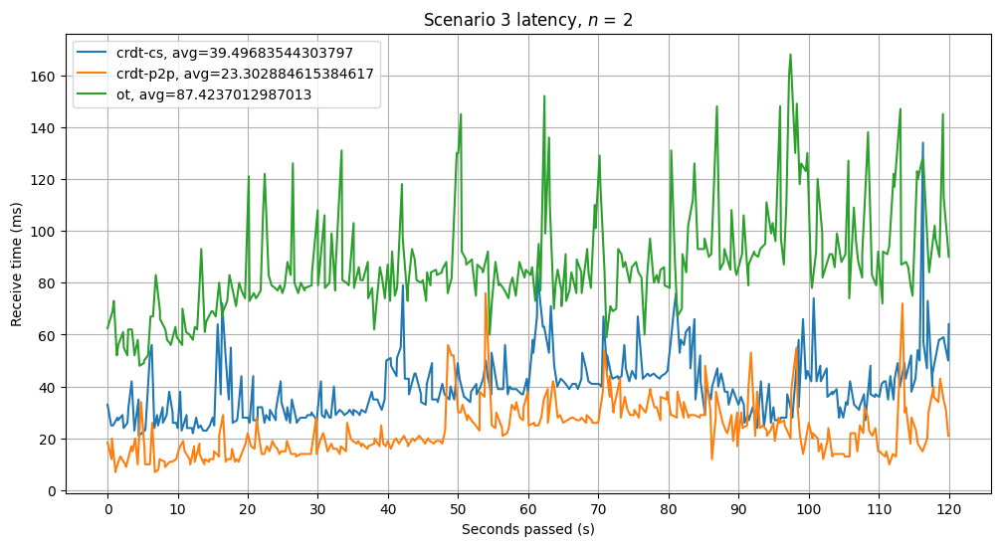

Currently computing for peers (4, 'n04')


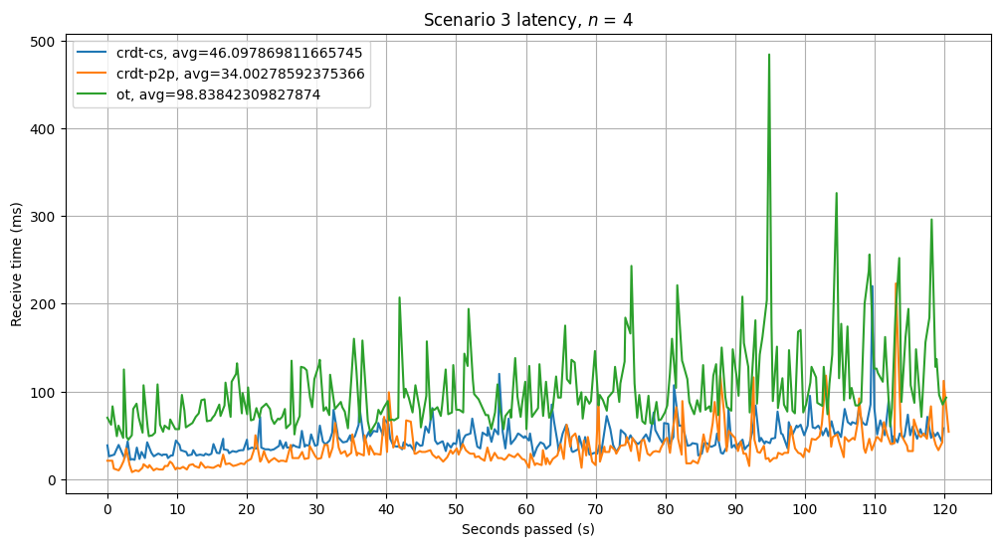

Currently computing for peers (8, 'n08')


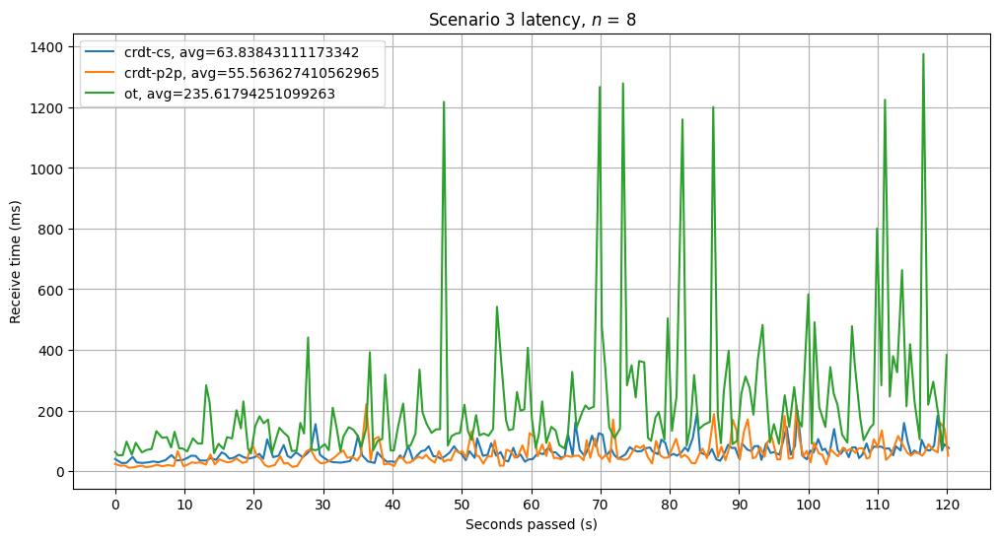

In [33]:
def scenario_three_checker():
    logger = [["peer number","instance", "avg", "med","90th percentile", "max", "min"]]
    current_scenario = scenario_list[2]
    for n in number_of_peers_list:
        declare_n(n)
        data_path = os.path.join(os.getcwd(), current_scenario[1], n[1])

        plt.figure(figsize=(12, 6))
        plots = dict()
        for server_kind in type_list:

            start_time = None
            end_time = None
            for i in range(1, n[0] + 1):
                log_path = os.path.join(data_path, server_kind[1], f"peer-{i}")
                # print(log_path)
                log_file = glob.glob(f"{log_path}/*.log")
                assert(len(log_file) == 1)
                assert(os.path.isdir(log_path))
                log_file = log_file[0]
                
                with open(log_file, 'r') as log_buffer:
                    log_data = log_buffer.read()
                    test_start_line = re.search("\[(.+?)\].+Test Start", log_data)
                    timestamp_str = test_start_line.groups()[0]
                    timestamp_int = parse_log_time_second(timestamp_str)
                    if(start_time == None):
                        start_time = timestamp_int
                    assert(start_time == timestamp_int)

                    try:
                        test_start_line = re.search("\[(.+?)\].+Exit Test", log_data)
                        timestamp_int = parse_log_time_second(timestamp_str)

                        if(end_time == None):
                            end_time = timestamp_int
                        # print(log_path)
                        # print(end_time, timestamp_int)
                        end_time = max(end_time, timestamp_int)
                        assert(abs(end_time-timestamp_int) <= 10)
                    except:
                        print(colored(f"{log_path} Doesn't end!", "red"))
                        pass
                
                    splitted_log_data = log_data.split('\n')
                    current_id = None
                    for log_line in splitted_log_data:
                        if("Inserting test" in log_line):
                            current_id = log_line.split()[-1]
                            # print(current_id)
                    running = dict()
                    for log_line in splitted_log_data:
                        splitted_data = log_line.split()
                        try:
                            source_id = splitted_data[-1]
                            ping = int(splitted_data[-2])
                            if(source_id == current_id):
                                continue
                            timestamp_str = splitted_data[0] + " " + splitted_data[1]
                            timestamp_str = timestamp_str.strip('[')
                            timestamp_str = timestamp_str.strip(']')
                            timestamp_int = parse_log_time_mili(timestamp_str)
                            assert start_time <= timestamp_int, f"{start_time} {timestamp_int}"
                            running[timestamp_int] = ping
                        except:
                            pass
                    x = [el for el in sorted(running.keys())]
                    y = [running[el] for el in x]
                    x = [(el - x[0]) for el in x]

                    plot_key = server_kind
                    # plt.plot(x, y, label=plot_key)
                    plots.setdefault(plot_key, dict())
                    current_plot = plots[plot_key]
                    for current_x, current_y in zip(x, y):
                        current_plot.setdefault(current_x, [])
                        current_plot[current_x].append(current_y)
        for plot_key, plot_val in sorted(plots.items()):
            x = sorted(plot_val.keys())
            y = [np.average(plot_val[el]) for el in x]
            avg = np.average(y)
            med = np.median(y)
            maxi = np.max(y)
            mini = np.min(y)
            perc = np.percentile(y, 90)
            logger.append([n[0], plot_key[1], avg, med, perc, maxi, mini])

            x = [x[i] for i in np.arange(0, len(x), int(n[0] ** 2.5) // 5)]
            y = [(np.median(plot_val[el])) for el in x]
            plt.plot(x, y, label = f"{plot_key[1]}, avg={avg}", color=plot_key[2])
        plt.grid()
        tmp_tick = list(np.arange(0, 120001, 10000))
        plt.xticks(tmp_tick, [el//1000 for el in tmp_tick])
        plt.title(f"Scenario 3 latency, $n$ = {n[0]}")
        plt.xlabel(f'''Seconds passed (s)''')
        plt.ylabel(f'''Receive time (ms)''')
        plt.legend()
        plt.show()
    with open(f"log-scenario-three-latency.csv", "w") as log_buffer:
        writer = csv.writer(log_buffer)
        writer.writerows(logger)

scenario_three_checker()

    


Currently computing for peers (2, 'n02')


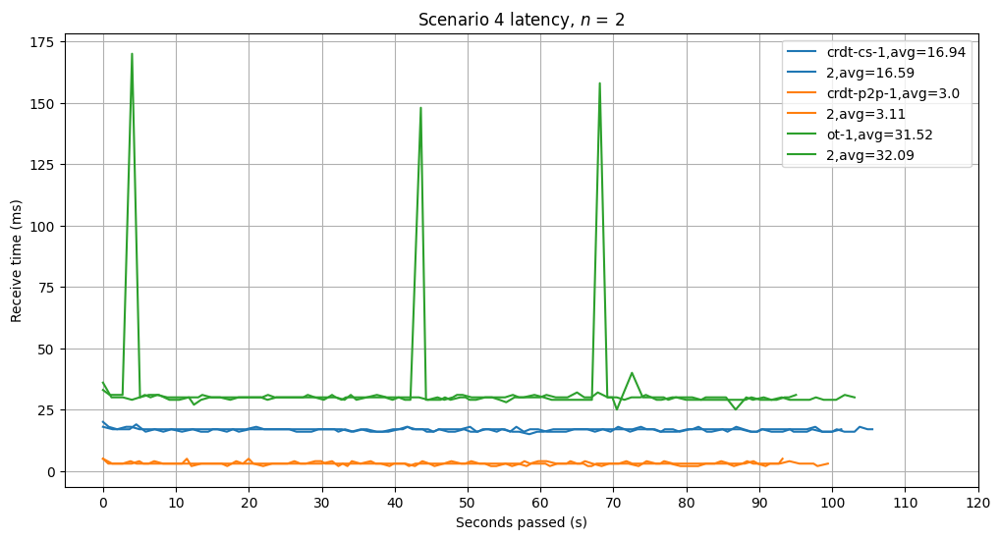

Currently computing for peers (4, 'n04')


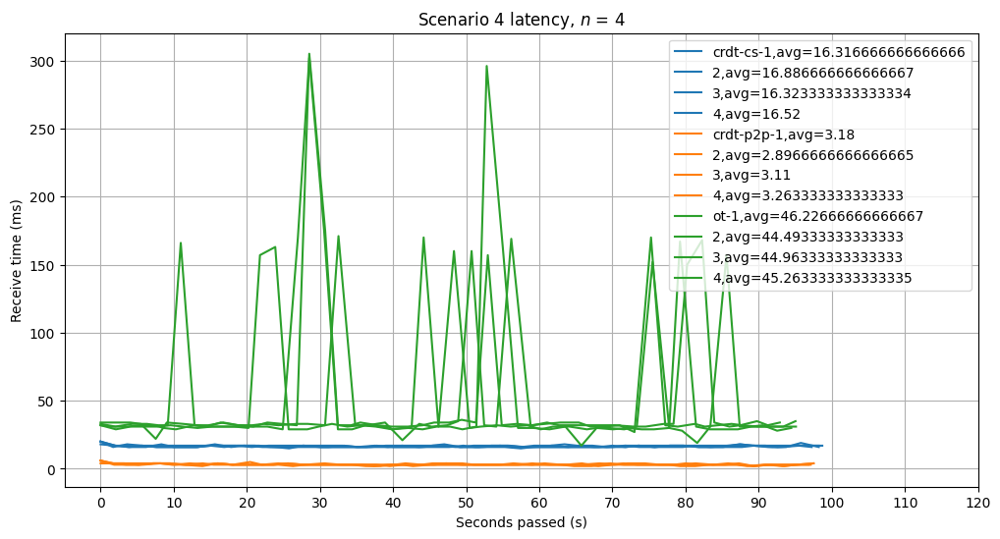

Currently computing for peers (8, 'n08')


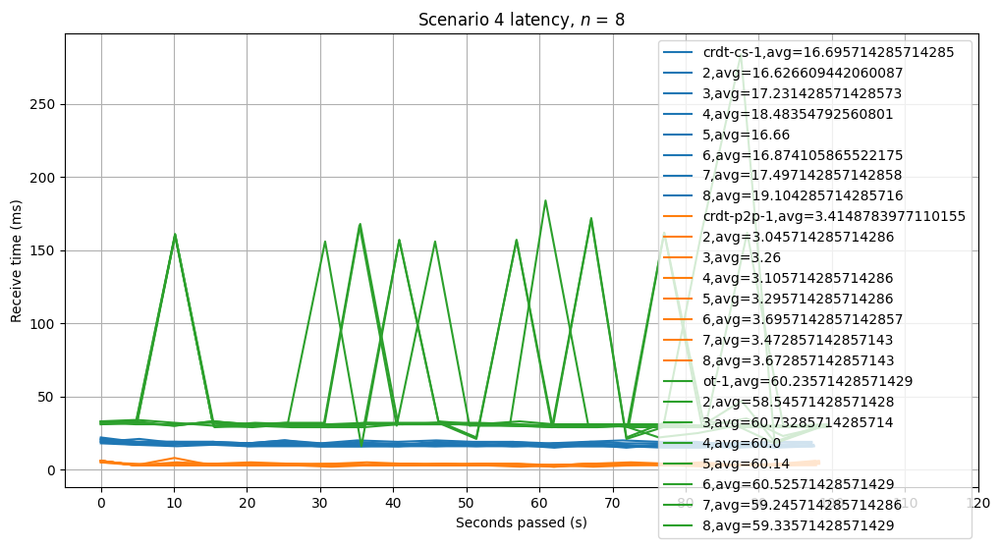

In [34]:
def scenario_four_checker_chaos():
    logger = [["parameter","peer number","instance", "avg", "med", "max", "min"]]
    current_scenario = scenario_list[3]
    for n in number_of_peers_list:
        declare_n(n)
        data_path = os.path.join(os.getcwd(), current_scenario[1], n[1])

        plt.figure(figsize=(12, 6))
        plots = dict()
        plotting_groups = dict()
        for server_kind in type_list:

            start_time = None
            end_time = None
            for i in range(1, n[0] + 1):
                log_path = os.path.join(data_path, server_kind[1], f"peer-{i}")
                # print(log_path)
                log_file = glob.glob(f"{log_path}/*.log")
                assert(len(log_file) == 1)
                assert(os.path.isdir(log_path))
                log_file = log_file[0]
                
                with open(log_file, 'r') as log_buffer:
                    log_data = log_buffer.read()
                    test_start_line = re.search("\[(.+?)\].+Test Start", log_data)
                    timestamp_str = test_start_line.groups()[0]
                    timestamp_int = parse_log_time_second(timestamp_str)
                    if(start_time == None):
                        start_time = timestamp_int
                    assert(start_time == timestamp_int)

                    try:
                        test_start_line = re.search("\[(.+?)\].+Exit Test", log_data)
                        timestamp_int = parse_log_time_second(timestamp_str)

                        if(end_time == None):
                            end_time = timestamp_int
                        # print(log_path)
                        # print(end_time, timestamp_int)
                        end_time = max(end_time, timestamp_int)
                        assert(abs(end_time-timestamp_int) <= 10)
                    except:
                        print(colored(f"{log_path} Doesn't end!", "red"))
                        pass
                
                    splitted_log_data = log_data.split('\n')
                    current_id = None
                    for log_line in splitted_log_data:
                        if("spawning" in log_line):
                            current_id = log_line.split()[-1]
                    assert current_id != None, log_path
                    running = dict()
                    for log_line in splitted_log_data:
                        splitted_data = log_line.split()
                        try:
                            belakang = splitted_data[-1].split(',')
                            source_id = belakang[1]
                            assert(belakang[0] == "shellProcess")
                            if(source_id == current_id):
                                continue
                            ping = int(belakang[2])
                            timestamp_str = splitted_data[0] + " " + splitted_data[1]
                            timestamp_str = timestamp_str.strip('[')
                            timestamp_str = timestamp_str.strip(']')
                            timestamp_int = parse_log_time_mili(timestamp_str)
                            assert start_time <= timestamp_int, f"{start_time} {timestamp_int}"
                            running[timestamp_int] = ping
                        except:
                            pass
                    x = [el for el in sorted(running.keys())]
                    tmp_y = [running[el] for el in x]
                    avg = np.average(tmp_y)

                    x = [x[i] for i in np.arange(0, len(x), int(n[0] ** 2.5) // 5)]

                    y = [(running[el]) for el in x]
                    x = [(el - x[0]) for el in x]
                    plot_key=f"{i}"
                    if(i == 1): plot_key = f"{server_kind[1]}-" + plot_key
                    plt.plot(x, y, label=f"{plot_key},avg={avg}", color = server_kind[2])

                    plots[plot_key] = {X: x, Y: y}
                    assert(current_id != None)
                    # print(current_id, f"peer-{i}" )
        
        plt.grid()
        tmp_tick = list(np.arange(0, 120001, 10000))
        plt.xticks(tmp_tick, [el//1000 for el in tmp_tick])

        plt.title(f"Scenario 4 latency, $n$ = {n[0]}")
        plt.ylabel(f'''Receive time (ms)''')
        plt.xlabel(f'''Seconds passed (s)''')
        
        plt.legend()
        plt.show()


scenario_four_checker_chaos()


Currently computing for peers (2, 'n02')


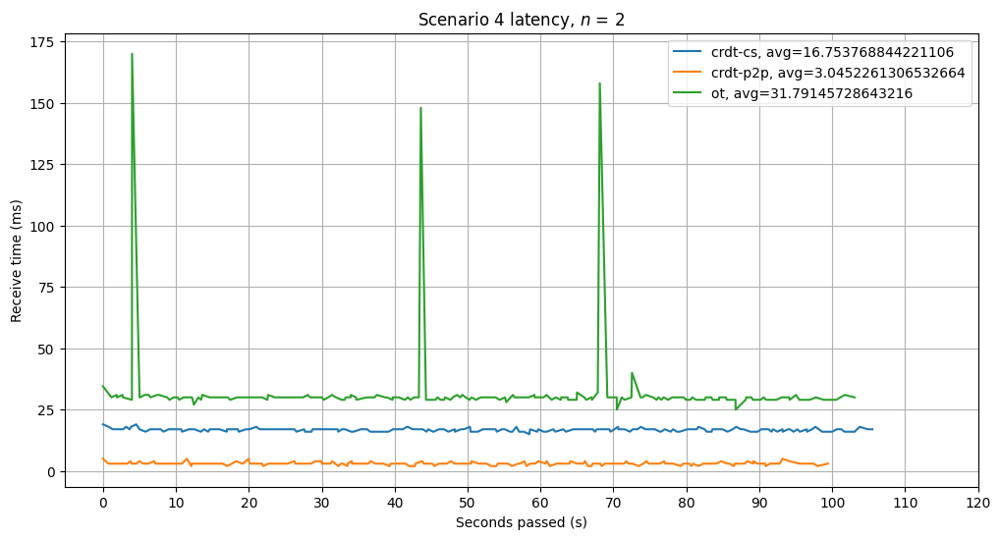

Currently computing for peers (4, 'n04')


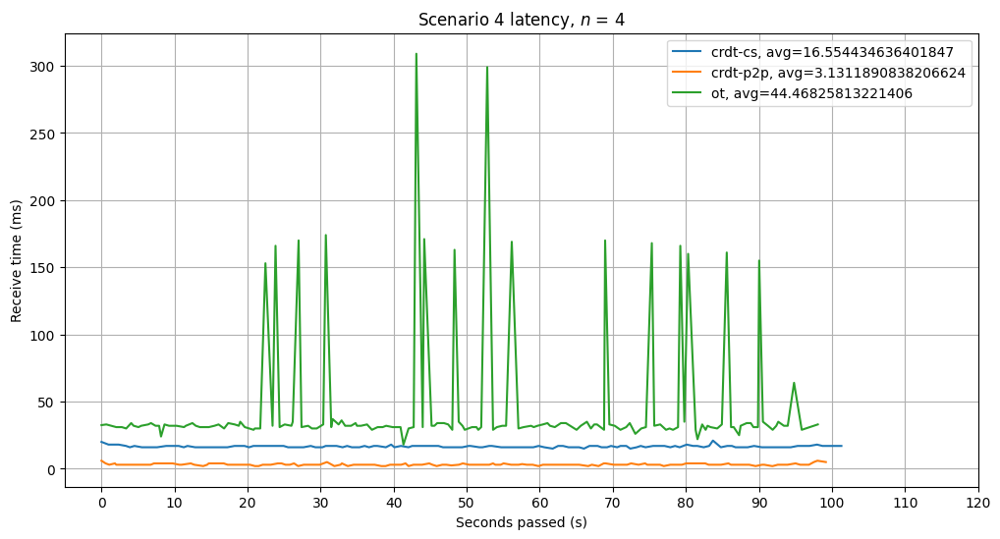

Currently computing for peers (8, 'n08')
/Users/hocky/peertocp-benchmark/s4/n08/crdt-p2p/peer-2


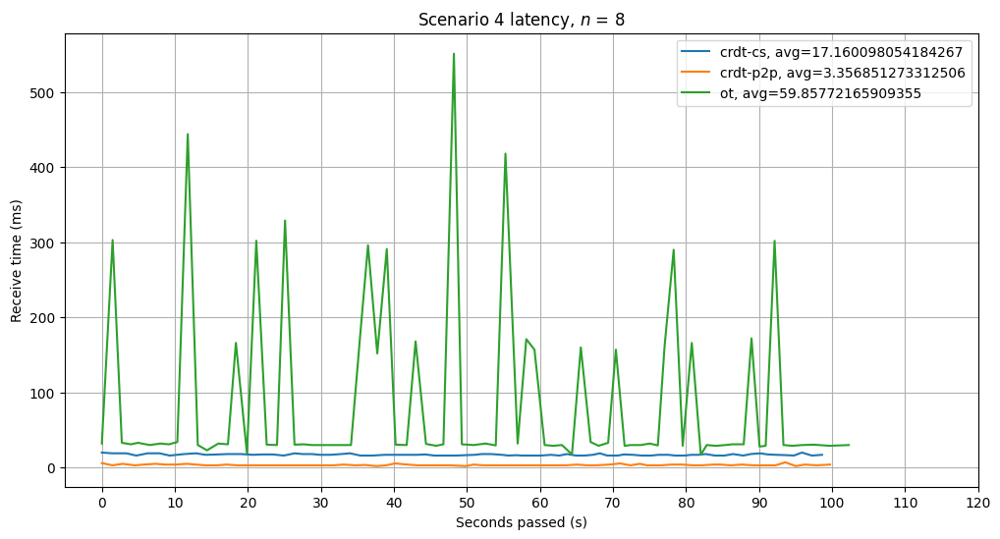

In [35]:
def scenario_four_checker():
    logger = [["peer number","instance", "avg", "med","90th percentile", "max", "min"]]
    current_scenario = scenario_list[3]
    for n in number_of_peers_list:
        declare_n(n)
        data_path = os.path.join(os.getcwd(), current_scenario[1], n[1])

        plt.figure(figsize=(12, 6))
        plots = dict()
        for server_kind in type_list:

            start_time = None
            end_time = None
            for i in range(1, n[0] + 1):
                log_path = os.path.join(data_path, server_kind[1], f"peer-{i}")
                # print(log_path)
                log_file = glob.glob(f"{log_path}/*.log")
                assert(len(log_file) == 1)
                assert(os.path.isdir(log_path))
                log_file = log_file[0]
                
                with open(log_file, 'r') as log_buffer:
                    log_data = log_buffer.read()
                    test_start_line = re.search("\[(.+?)\].+Test Start", log_data)
                    timestamp_str = test_start_line.groups()[0]
                    timestamp_int = parse_log_time_second(timestamp_str)
                    if(start_time == None):
                        start_time = timestamp_int
                    assert(start_time == timestamp_int)

                    try:
                        test_start_line = re.search("\[(.+?)\].+Exit Test", log_data)
                        timestamp_int = parse_log_time_second(timestamp_str)

                        if(end_time == None):
                            end_time = timestamp_int
                        # print(log_path)
                        # print(end_time, timestamp_int)
                        end_time = max(end_time, timestamp_int)
                        assert(abs(end_time-timestamp_int) <= 10)
                    except:
                        print(colored(f"{log_path} Doesn't end!", "red"))
                        pass
                
                    splitted_log_data = log_data.split('\n')
                    current_id = None
                    for log_line in splitted_log_data:
                        if("spawning" in log_line):
                            current_id = log_line.split()[-1]
                            # print(current_id)
                    running = dict()
                    for log_line in splitted_log_data:
                        splitted_data = log_line.split()
                        try:
                            belakang = splitted_data[-1].split(',')
                            source_id = belakang[1]
                            assert(belakang[0] == "shellProcess")
                            if(source_id == current_id):
                                continue
                            ping = int(belakang[2])
                            timestamp_str = splitted_data[0] + " " + splitted_data[1]
                            timestamp_str = timestamp_str.strip('[')
                            timestamp_str = timestamp_str.strip(']')
                            timestamp_int = parse_log_time_mili(timestamp_str)
                            assert start_time <= timestamp_int, f"{start_time} {timestamp_int}"
                            running[timestamp_int] = ping
                            if(ping == 0):
                                print(timestamp_int)
                        except:
                            pass
                    x = [el for el in sorted(running.keys())]
                    y = [running[el] for el in x]
                    x = [(el - x[0]) for el in x]
                    if(1 in y):
                        print(log_path)
                    plot_key = server_kind
                    # plt.plot(x, y, label=plot_key)
                    plots.setdefault(plot_key, dict())
                    current_plot = plots[plot_key]
                    for current_x, current_y in zip(x, y):
                        current_plot.setdefault(current_x, [])
                        current_plot[current_x].append(current_y)
        for plot_key, plot_val in sorted(plots.items()):
            x = sorted(plot_val.keys())
            y = [np.average(plot_val[el]) for el in x]
            avg = np.average(y)
            med = np.median(y)
            maxi = np.max(y)
            mini = np.min(y)
            perc = np.percentile(y, 90)
            logger.append([n[0], plot_key[1], avg, med, perc, maxi, mini])

            x = [x[i] for i in np.arange(0, len(x), int(n[0] ** 2.5) // 5)]
            y = [(np.median(plot_val[el])) for el in x]
            plt.plot(x, y, label = f"{plot_key[1]}, avg={avg}", color=plot_key[2])
        plt.grid()
        tmp_tick = list(np.arange(0, 120001, 10000))
        plt.xticks(tmp_tick, [el//1000 for el in tmp_tick])
        plt.title(f"Scenario 4 latency, $n$ = {n[0]}")
        plt.xlabel(f'''Seconds passed (s)''')
        plt.ylabel(f'''Receive time (ms)''')
        plt.legend()
        plt.show()
    with open(f"log-scenario-four-latency.csv", "w") as log_buffer:
        writer = csv.writer(log_buffer)
        writer.writerows(logger)

scenario_four_checker()

    
